In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib
import matplotlib.pyplot as plt
import kaepora as kpora
import flux_calibration as fc
import pyphot
import numpy as np
from scipy.interpolate import splrep, splev
import scipy.optimize as opt

In [3]:
test_query = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where source = 'cfa'"
spec_array = kpora.grab(test_query, multi_epoch = False, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')
# test_phot = spec_array[0].light_curves
# test_phot_csp = spec_array[0].csp_light_curves
spec_array_dered = kpora.host_dereddening(spec_array, verbose=False, cutoff=2.)

2584 Total Spectra found
41 flagged spectra removed 2543 spectra left
54 spectra of peculiar Ias removed 2489 spectra left
241 spectra of SNe that have host reddening corrections
Arrays cleaned
1993ac sn1993ac-19931016.49-mmt.flm cfa 27.6005691719 6.74928503336 1.19 None 3056.0 7740.0
1993ae sn1993ae-19931213.11-mmt.flm cfa 12.8566707633 None 1.26110614317 19.0 3546.0 10282.0
1994ae sn1994ae-19941207.55-mmt.flm cfa 209.756233615 8.84427034272 0.96 14.0 2790.0 8628.0
1994d sn1994D-19940310.36-mmt.flm cfa 132.470672735 -11.2029443405 1.37 8.0 3208.0 8992.0
1994m sn1994M-19940515.27-mmt.flm cfa 35.7646192949 13.6942924159 1.26 8.0 3160.0 8626.0
1994q sn1994Q-19940604.39-fast.flm cfa 22.0603884891 10.8618793975 1.03 15.0 3744.0 7452.0
1994s sn1994S-19940611.28-fast.flm cfa 75.6897634875 -3.98354178631 0.94 11.0 3800.0 7562.0
1994t sn1994T-19940612.19-fast.flm cfa 6.99248808452 0.768371323421 1.51 9.0 3728.0 7418.0
1995ac sn1995ac-19951123.07-mmt.flm cfa 3.19791131366 49.0669536358 0.77 10.

In [4]:
# fc.plot_light_curves(spec_array[3].light_curves, fit=True, filt_list = ['B'])
# problems: 1994ae, 1994d, different mags at same mjd

I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



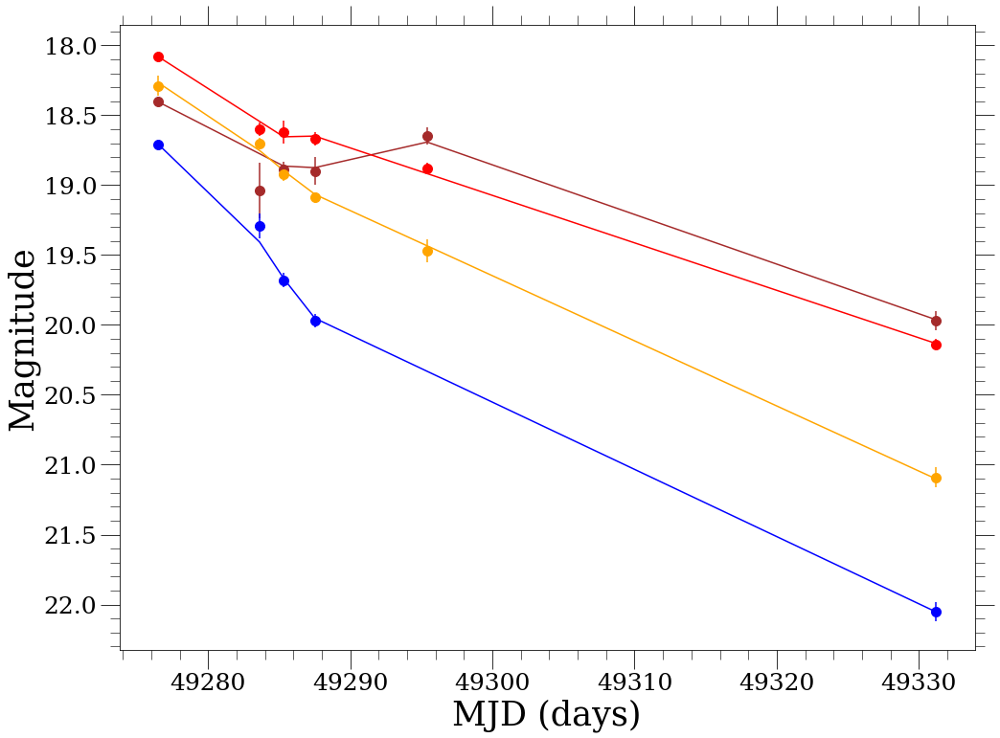

0 1993ac
I
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

B
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

R
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

V
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17



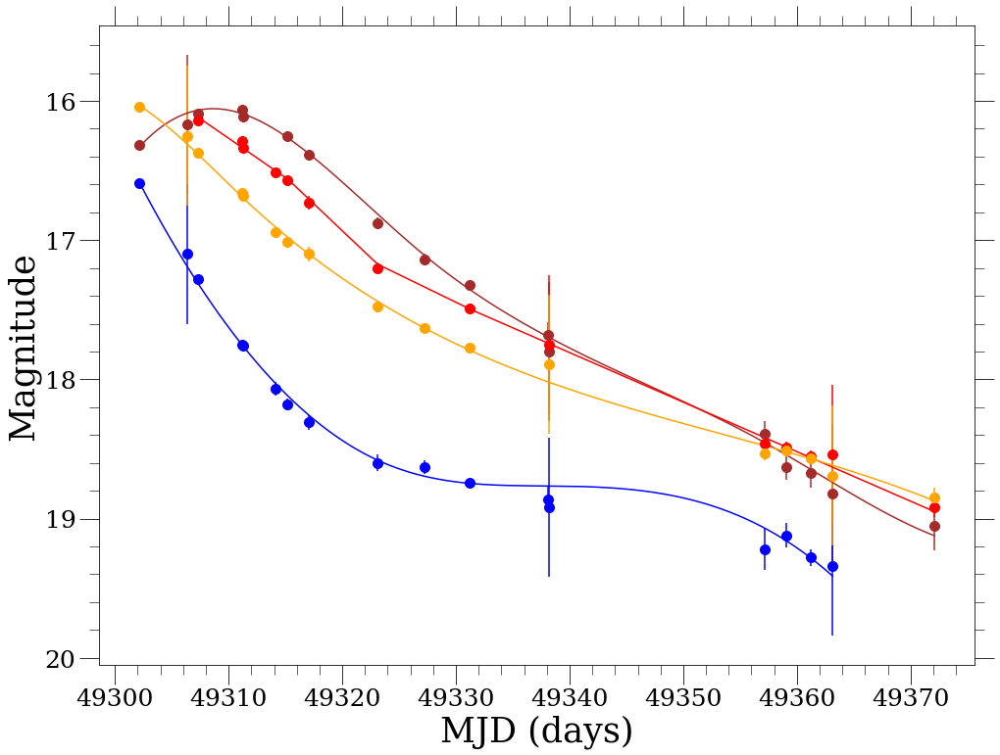

1 1993ae
I
{'None': 64}
{'None': 64}
{'None': 64}
{'None': 64}
None
64

R
{'None': 71}
{'None': 71}
{'None': 71}
{'None': 71}
None
71

B
{'None': 74}
{'None': 74}
{'None': 74}
{'None': 74}
None
74

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 85}
{'None': 85}
{'None': 85}
{'None': 85}
None
85



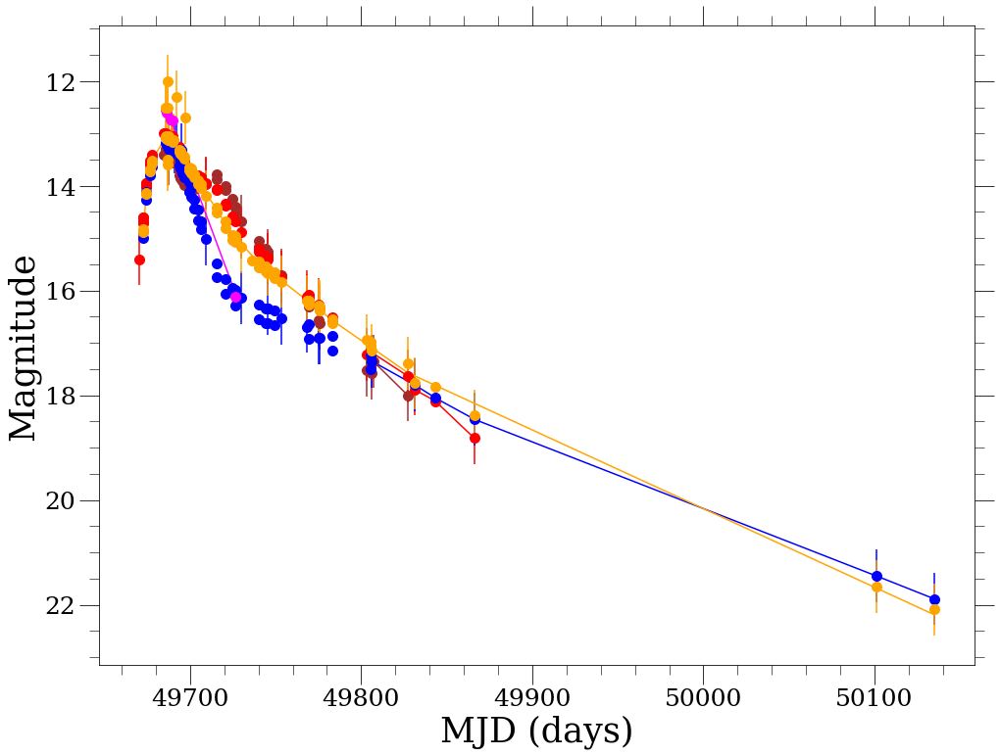

2 1994ae
I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

U
{'None': 51}
{'None': 51}
{'None': 51}
{'None': 51}
None
51

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152



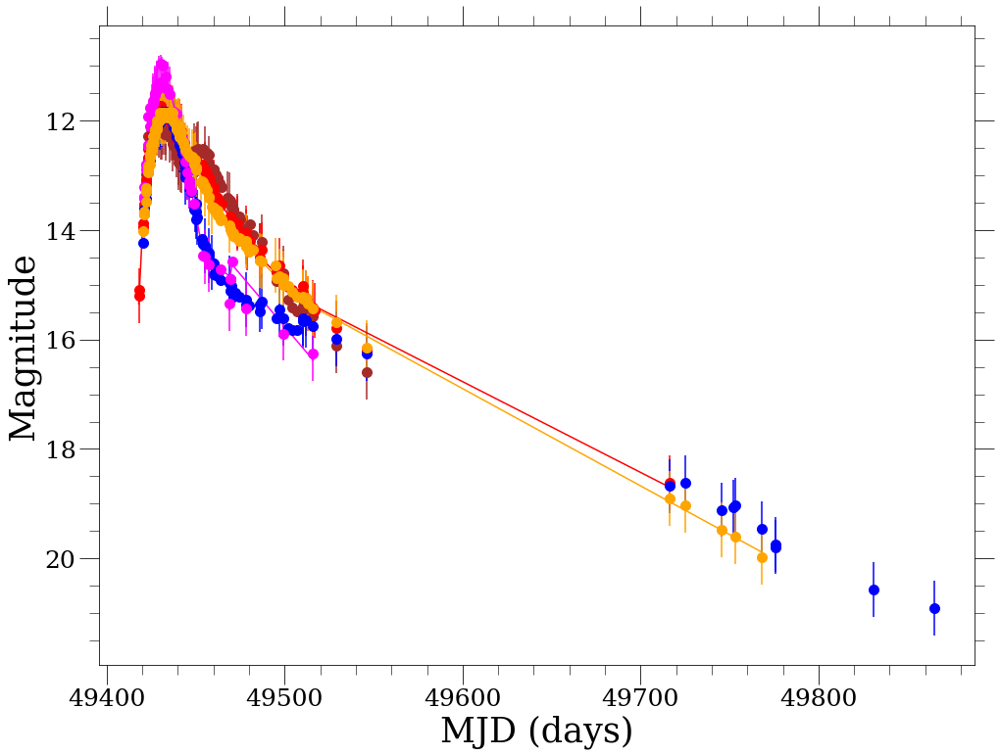

3 1994d
I
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

B
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

V
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21



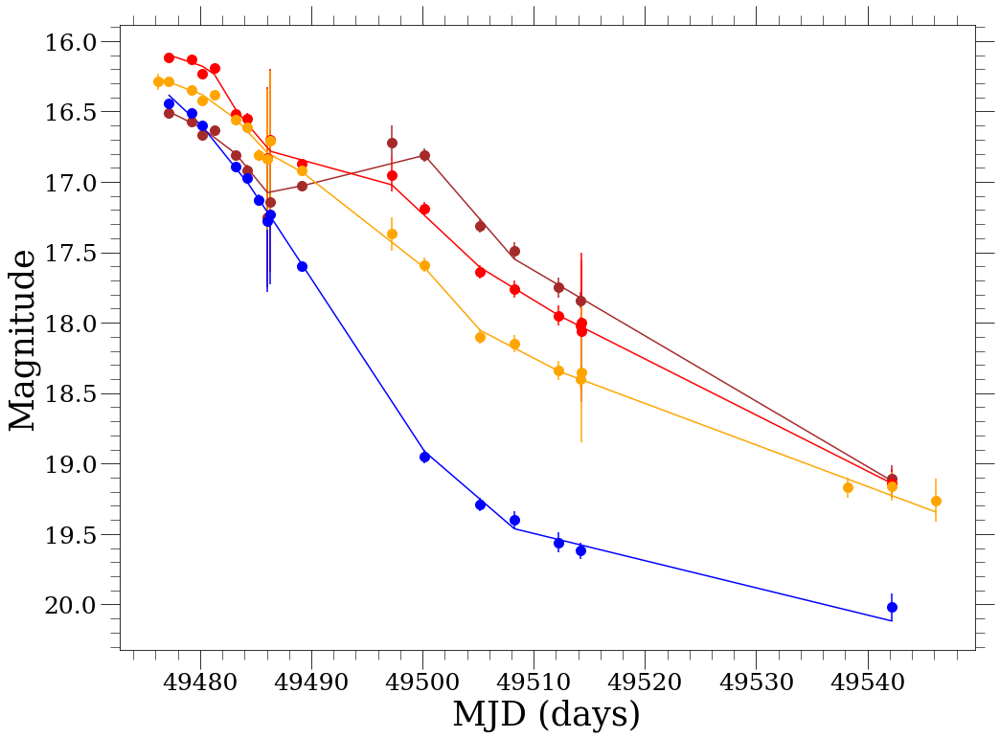

4 1994m
I
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

B
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

R
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16



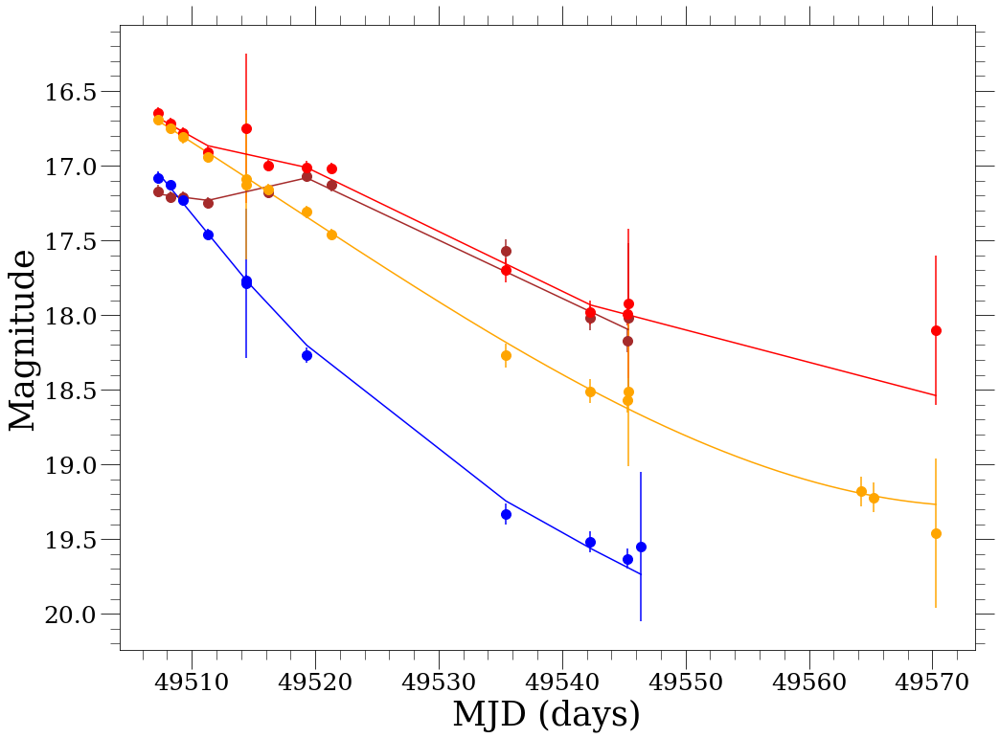

5 1994q
I
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

B
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

R
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

V
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12



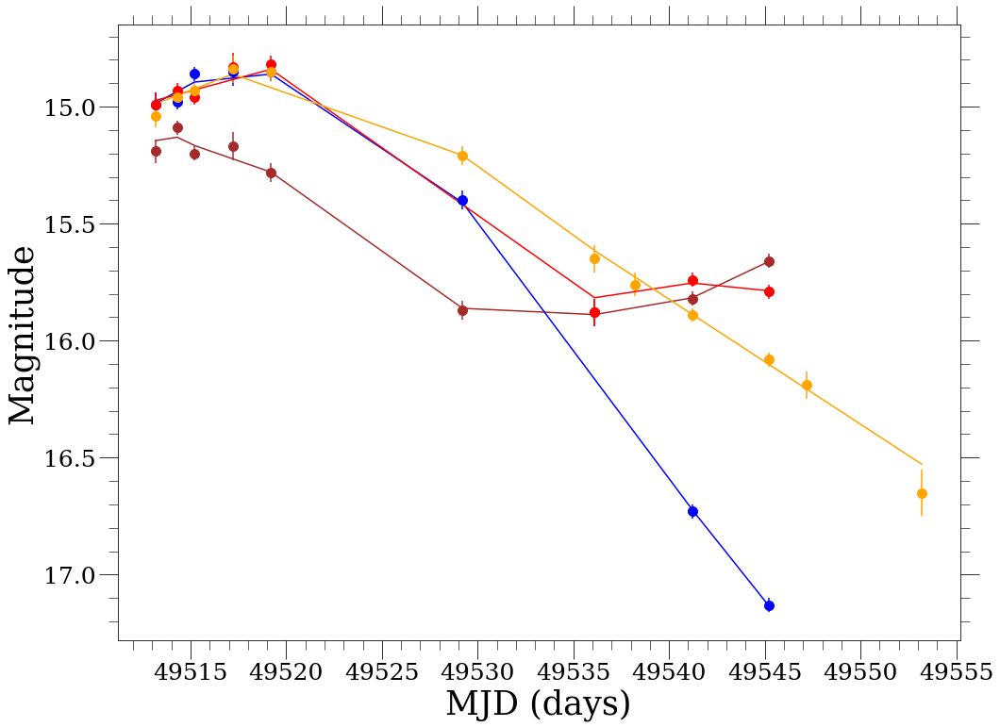

6 1994s
I
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

B
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

R
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

V
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11



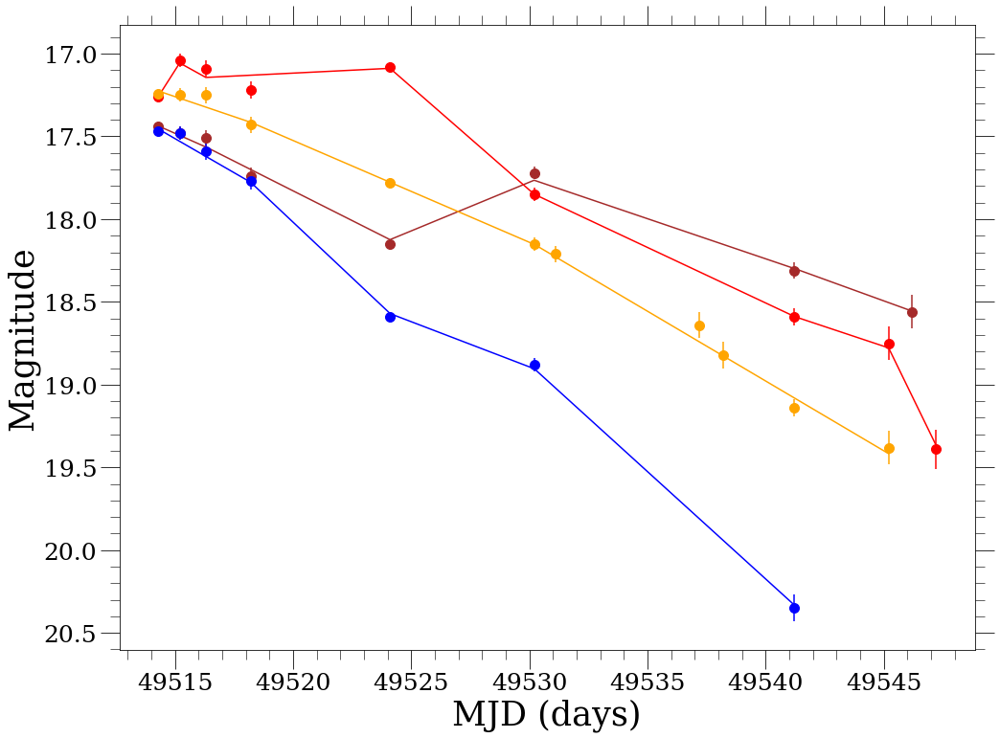

7 1994t
I
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

B
{'None': 25}
{'None': 25}
{'None': 25}
{'None': 25}
None
25

R
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

V
{'None': 26}
{'None': 26}
{'None': 26}
{'None': 26}
None
26



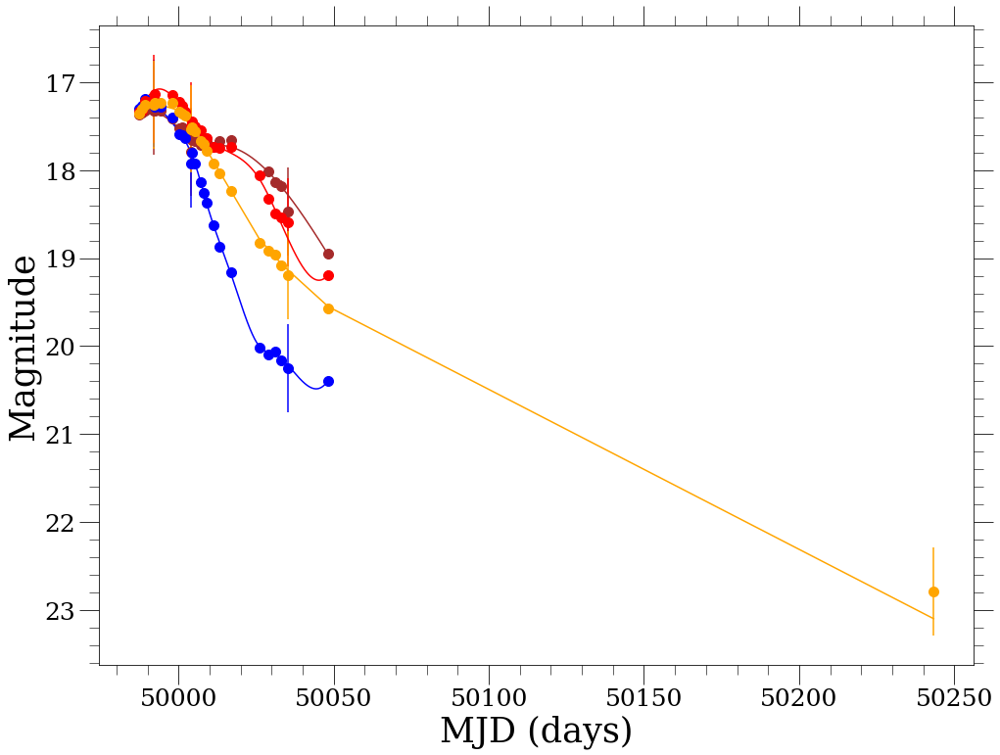

8 1995ac
I
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

B
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

V
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16



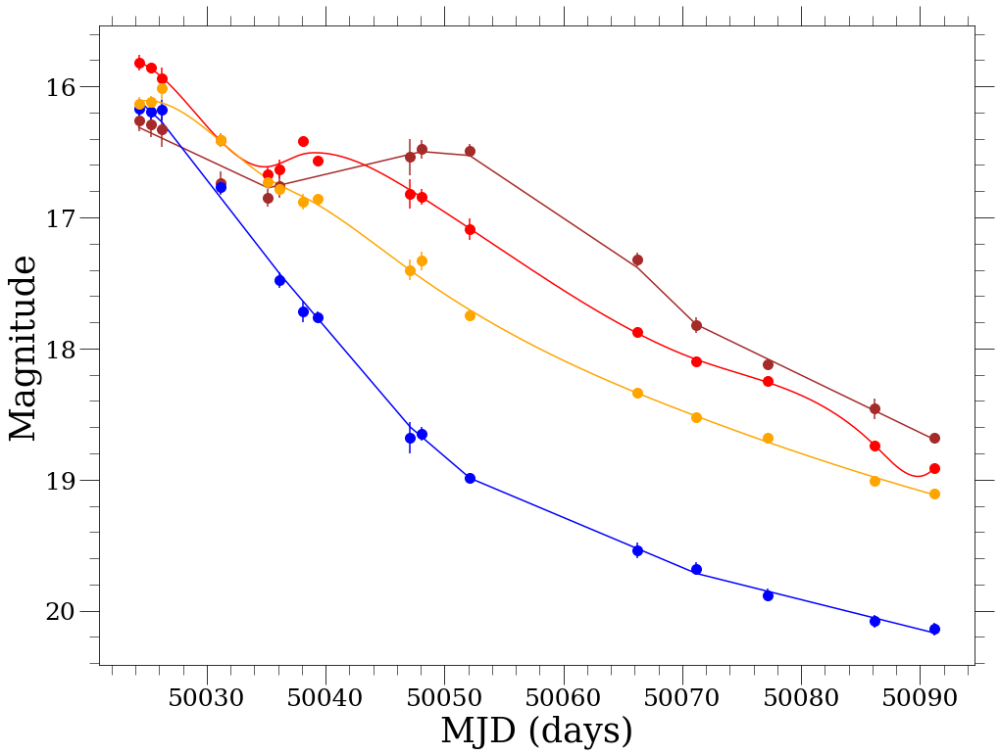

9 1995ak
C
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

B
{'None': 31}
{'None': 31}
{'None': 31}
{'None': 31}
None
31

I
{'None': 22}
{'None': 22}
{'None': 22}
{'None': 22}
None
22

R
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

U
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

V
{'None': 41}
{'None': 41}
{'None': 41}
{'None': 41}
None
41



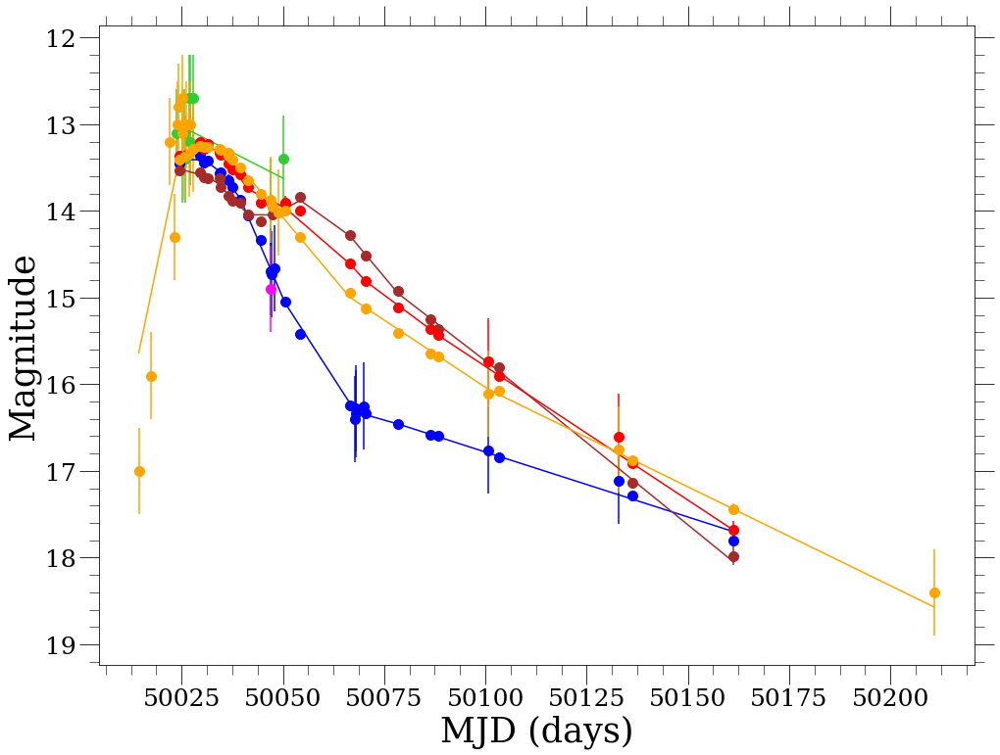

10 1995al
I
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

B
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

R
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

V
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21



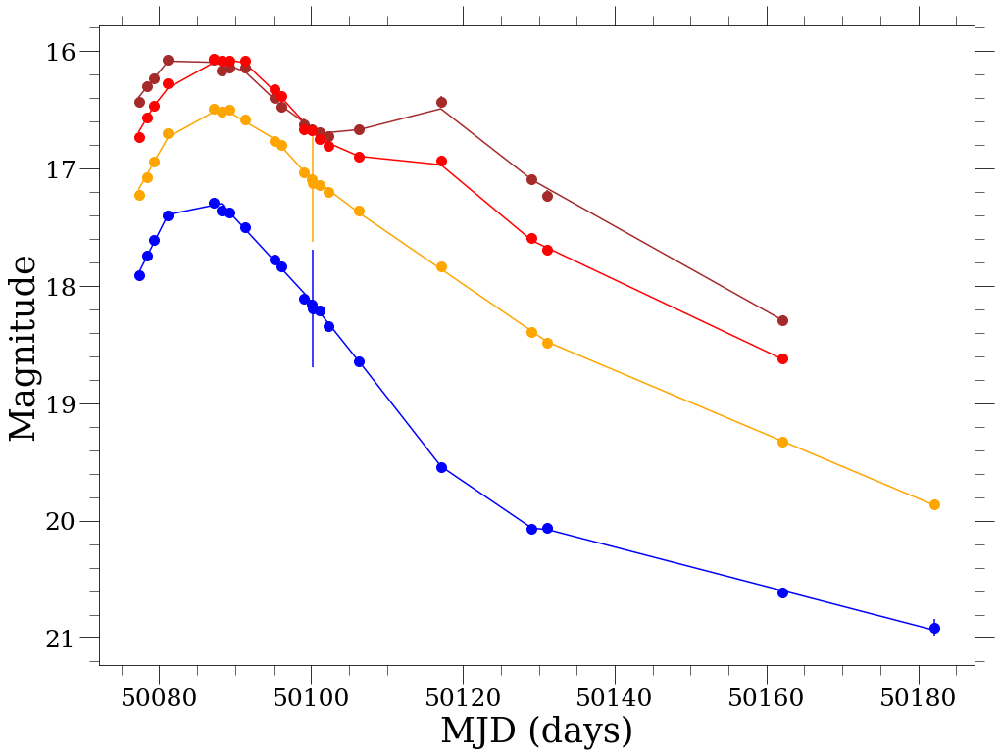

11 1995bd
I
{'None': 41}
{'None': 41}
{'None': 41}
{'None': 41}
None
41

C
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 50}
{'None': 50}
{'None': 50}
{'None': 50}
None
50

B
{'None': 56}
{'None': 56}
{'None': 56}
{'None': 56}
None
56

V
{'None': 78}
{'None': 78}
{'None': 78}
{'None': 78}
None
78



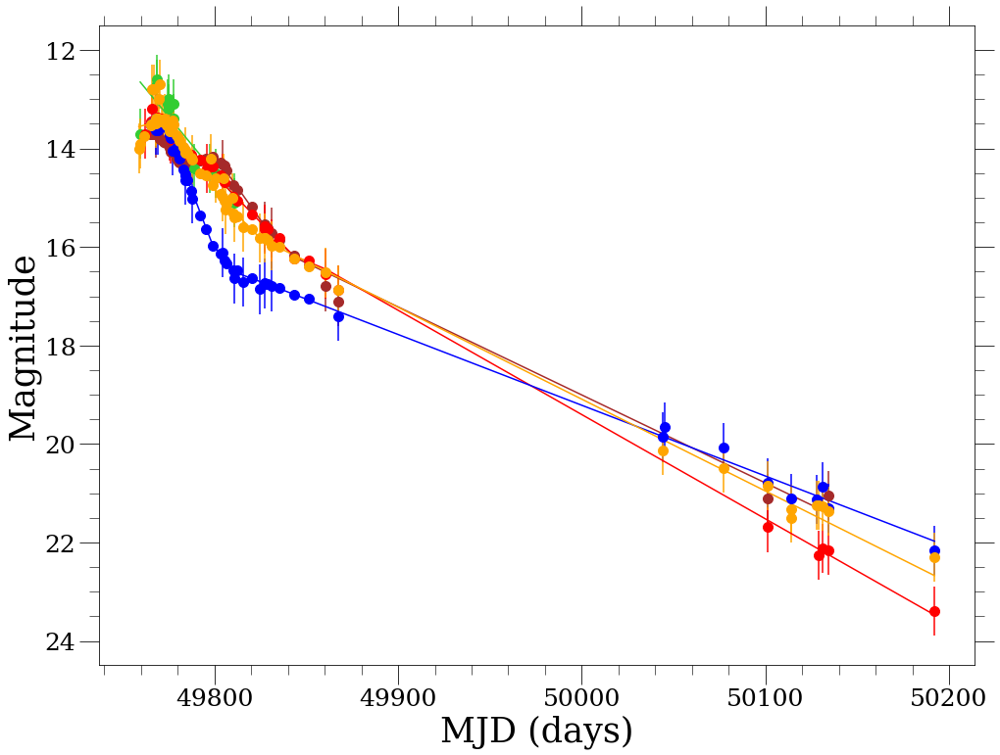

12 1995d
I
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

B
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

R
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

V
{'None': 26}
{'None': 26}
{'None': 26}
{'None': 26}
None
26



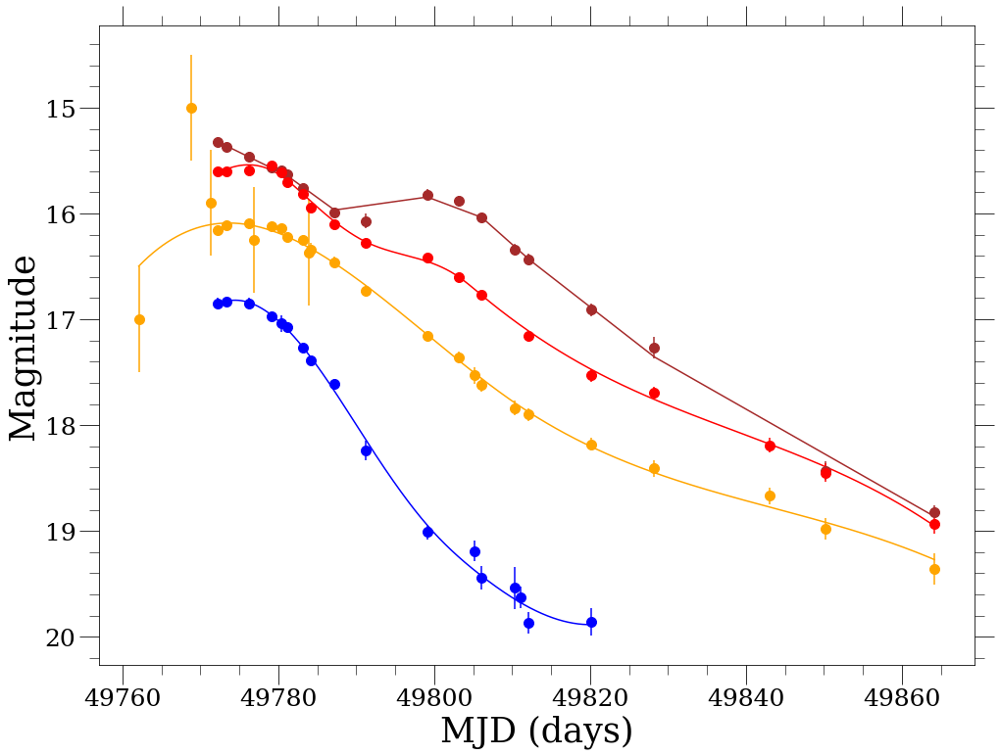

13 1995e
B
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17



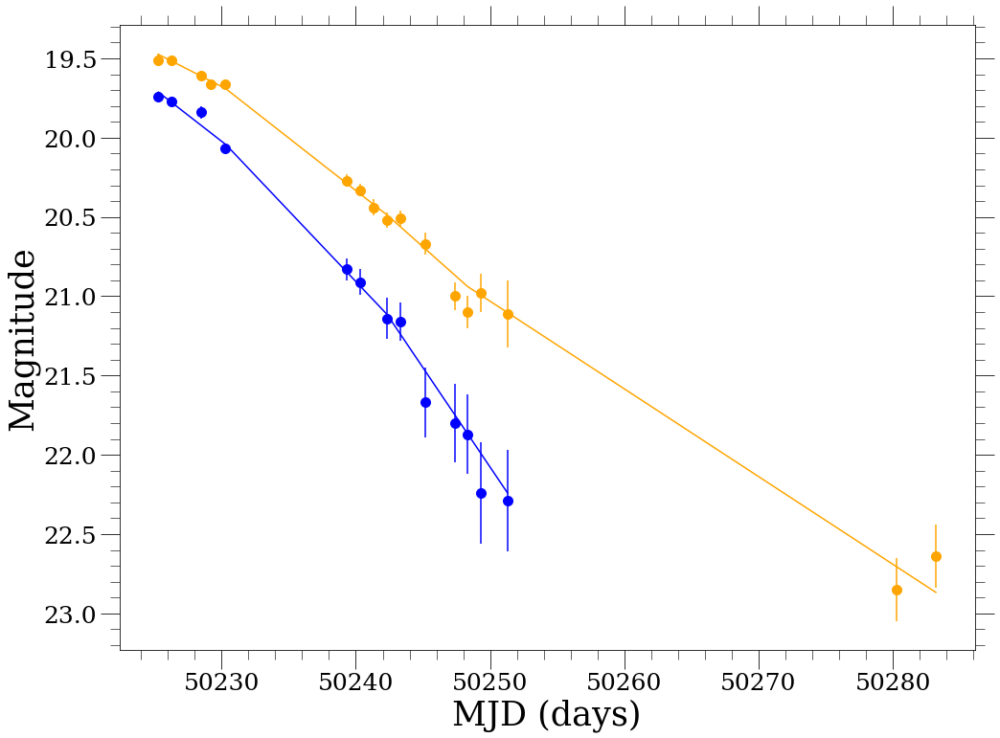

14 1996ab
I
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

B
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

R
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12



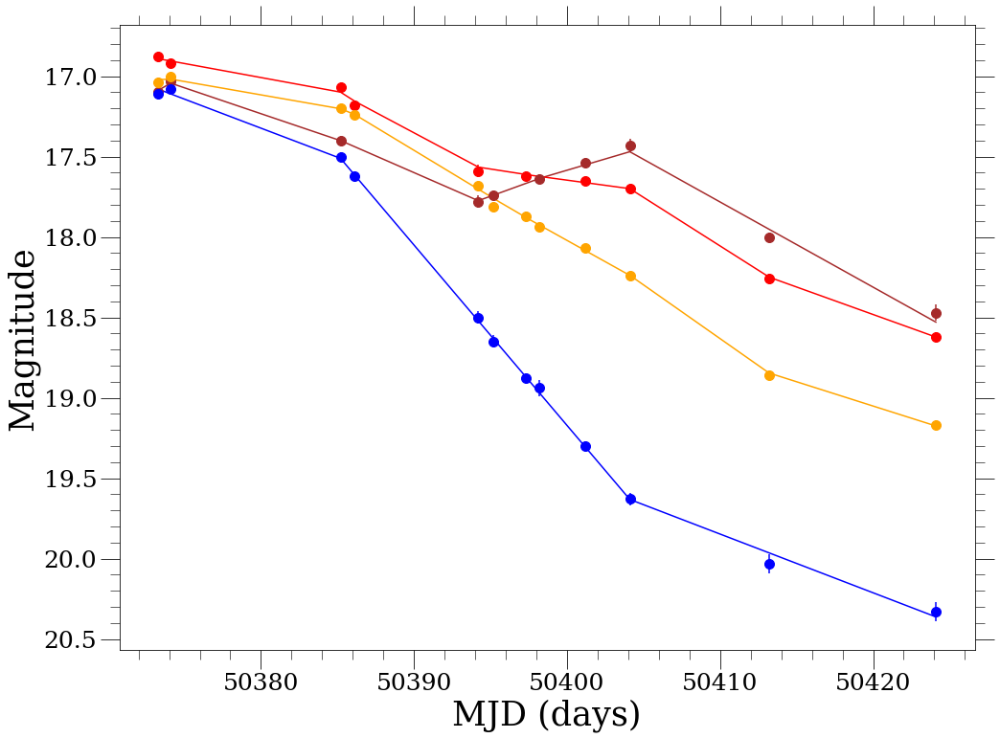

15 1996bl
I
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

B
{'None': 25}
{'None': 25}
{'None': 25}
{'None': 25}
None
25

R
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

U
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

V
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21



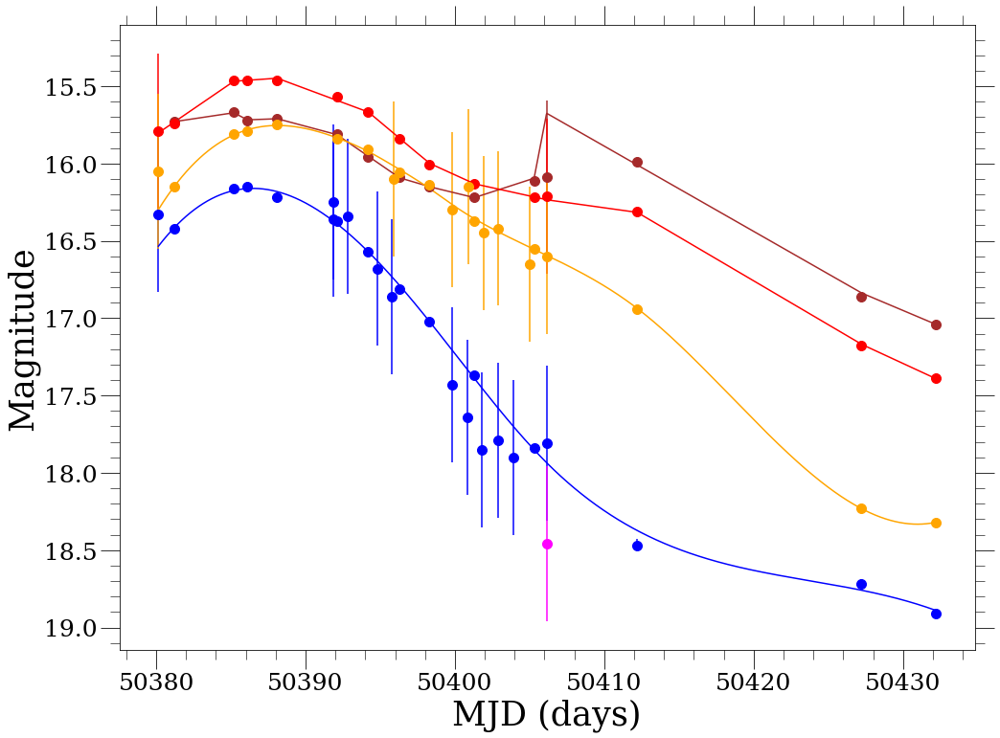

16 1996bo
I
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

B
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

R
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



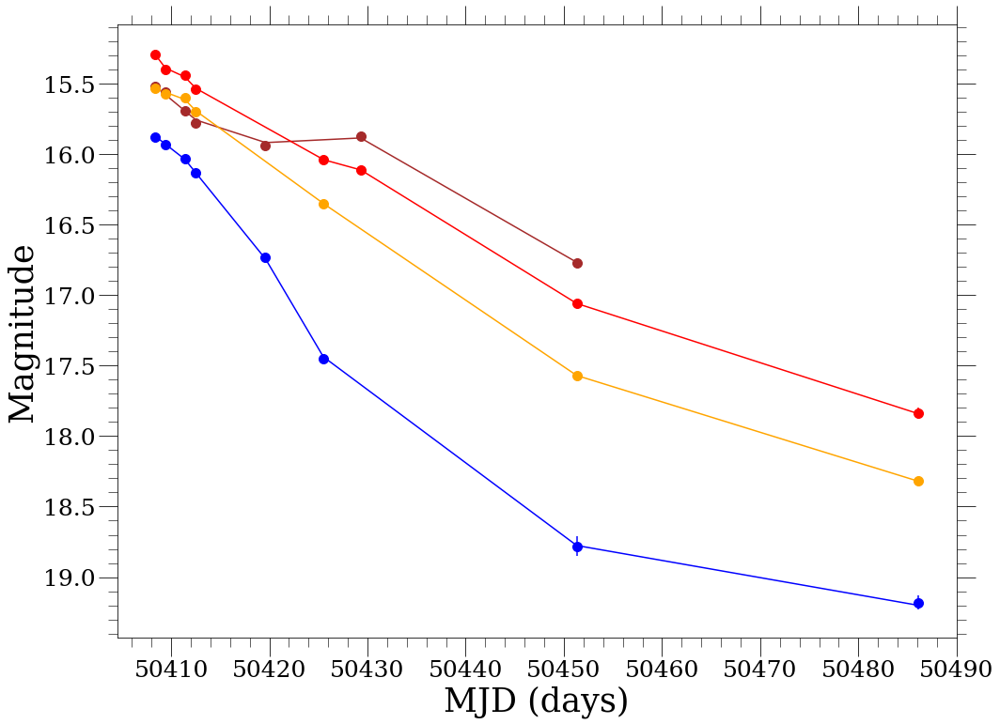

17 1996bv
I
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

B
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

V
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18



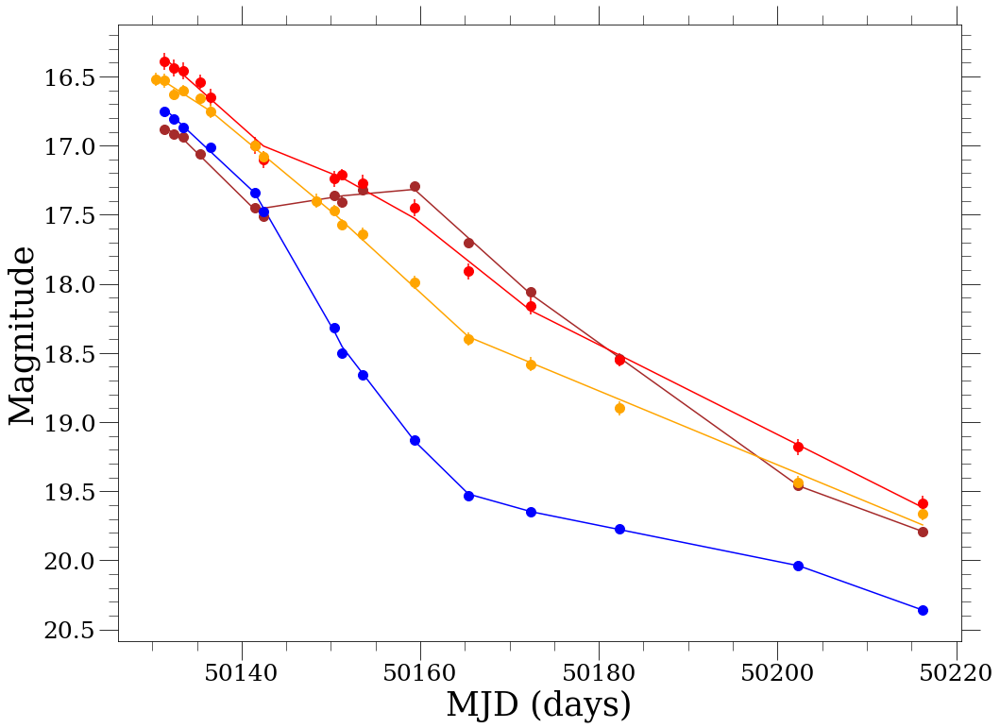

18 1996c
C
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 50}
{'None': 50}
{'None': 50}
{'None': 50}
None
50

I
{'None': 51}
{'None': 51}
{'None': 51}
{'None': 51}
None
51

R
{'None': 49}
{'None': 49}
{'None': 49}
{'None': 49}
None
49

U
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

V
{'None': 66}
{'None': 66}
{'None': 66}
{'None': 66}
None
66



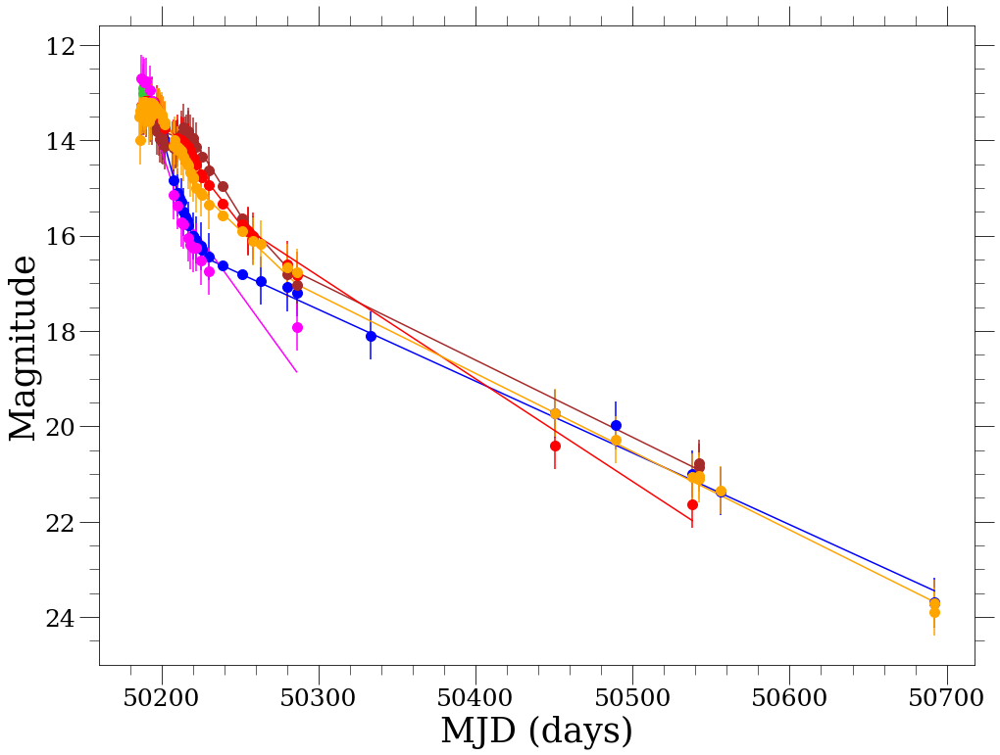

19 1996x
R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



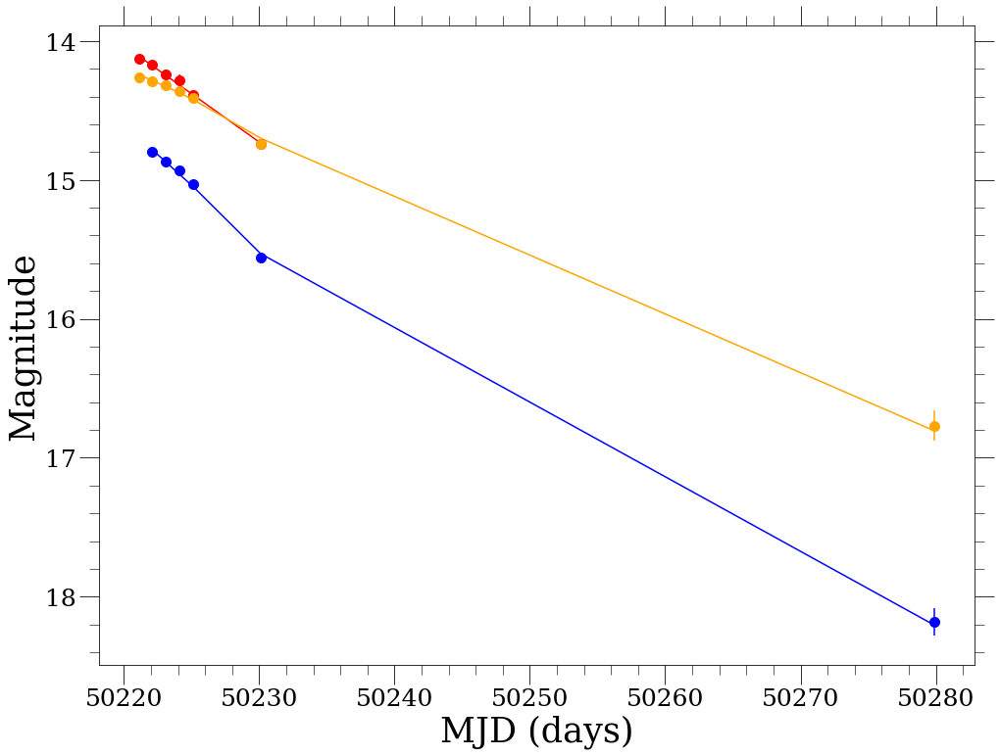

20 1996z
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 22}
{'None': 22}
{'None': 22}
{'None': 22}
None
22

I
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

R
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

U
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

V
{'None': 22}
{'None': 22}
{'None': 22}
{'None': 22}
None
22



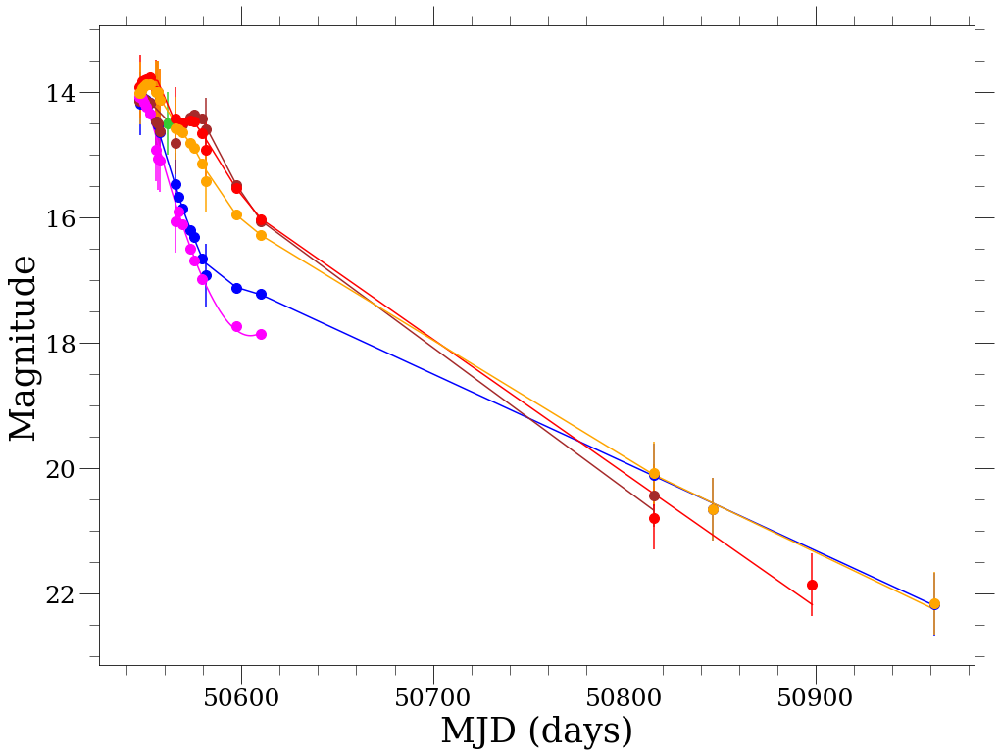

21 1997bp
I
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

B
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

R
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

U
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

V
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13



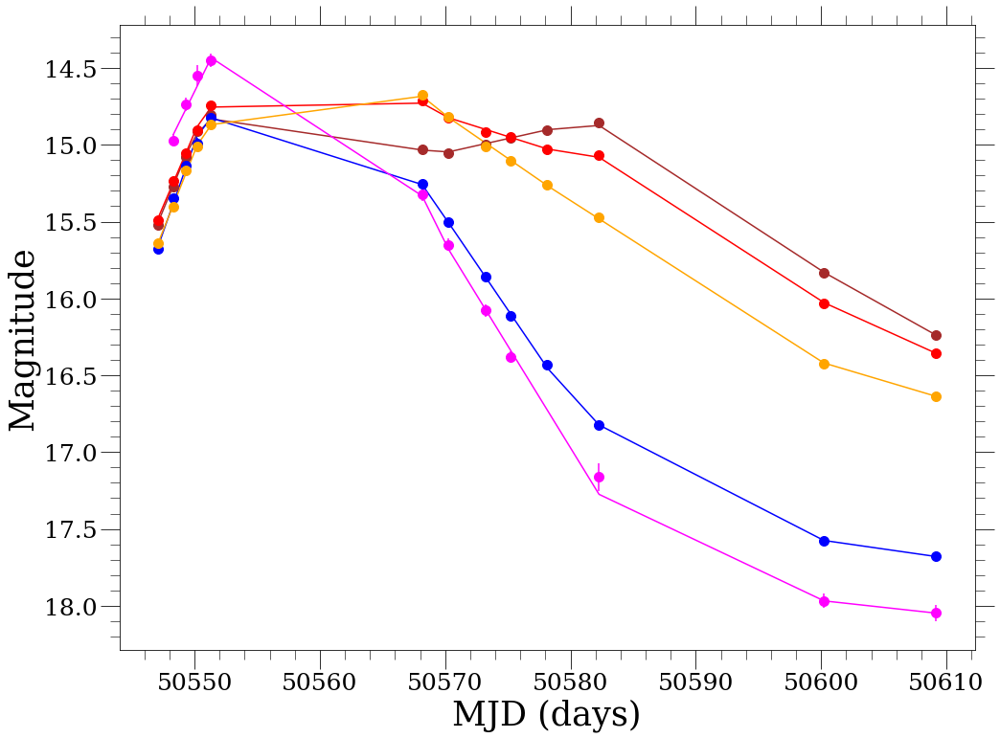

22 1997bq
I
{'None': 32}
{'None': 32}
{'None': 32}
{'None': 32}
None
32

B
{'None': 48}
{'None': 48}
{'None': 48}
{'None': 48}
None
48

R
{'None': 65}
{'None': 65}
{'None': 65}
{'None': 65}
None
65

U
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 66}
{'None': 66}
{'None': 66}
{'None': 66}
None
66



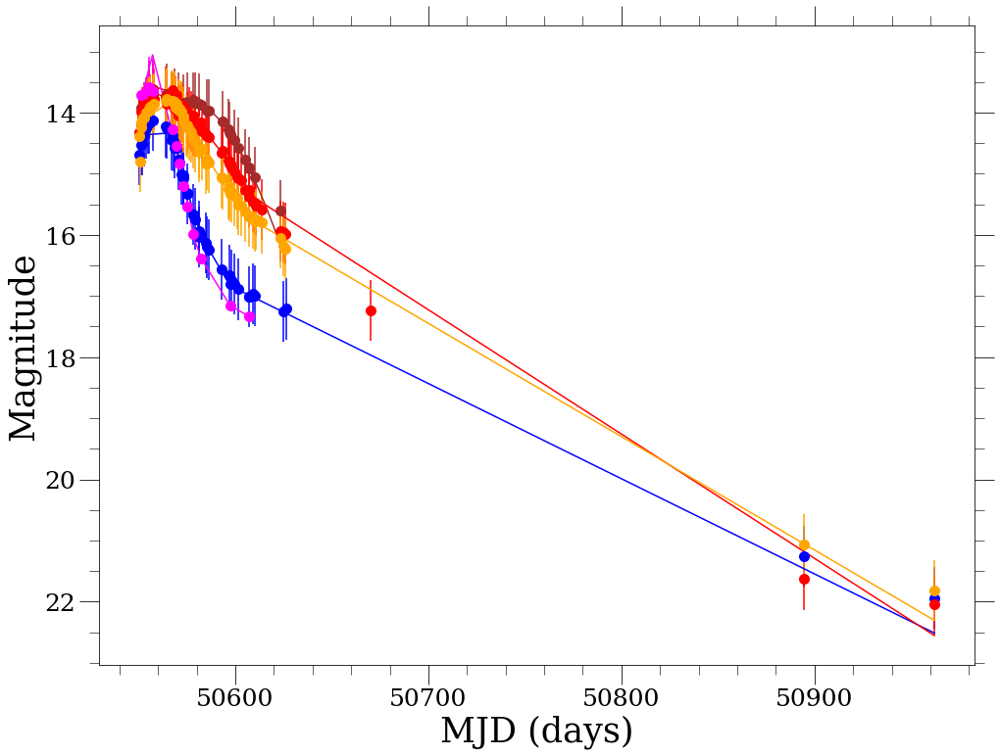

23 1997br
I
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

B
{'None': 22}
{'None': 22}
{'None': 22}
{'None': 22}
None
22

R
{'None': 25}
{'None': 25}
{'None': 25}
{'None': 25}
None
25

U
{'None': 20}
{'None': 20}
{'None': 20}
{'None': 20}
None
20

V
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24



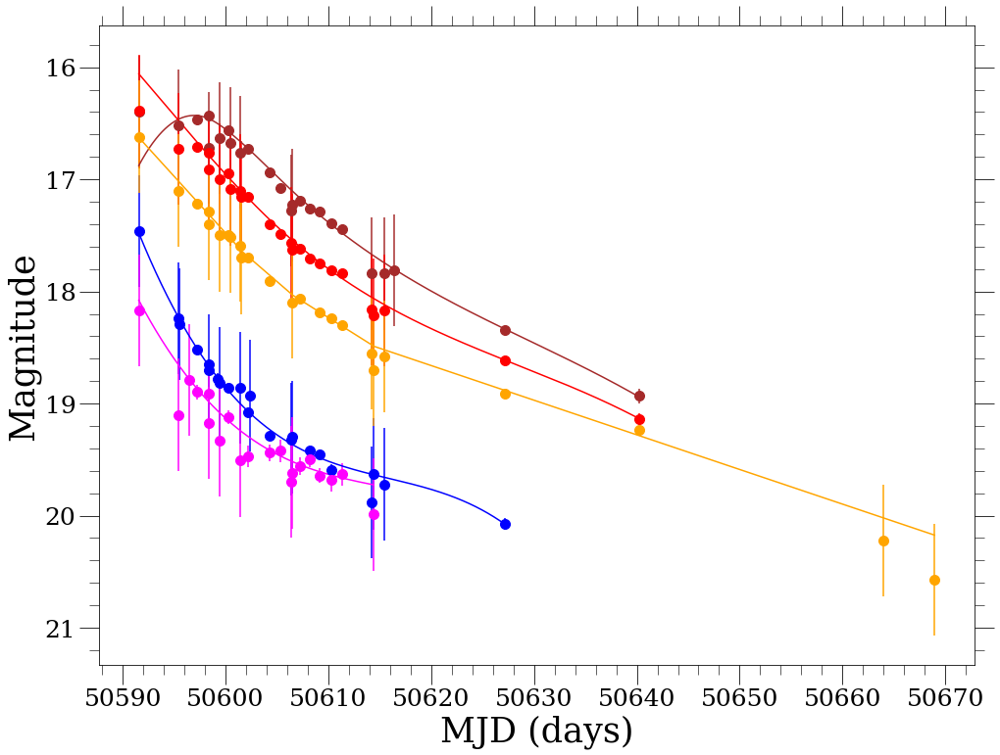

24 1997cn
I
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

B
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

R
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17



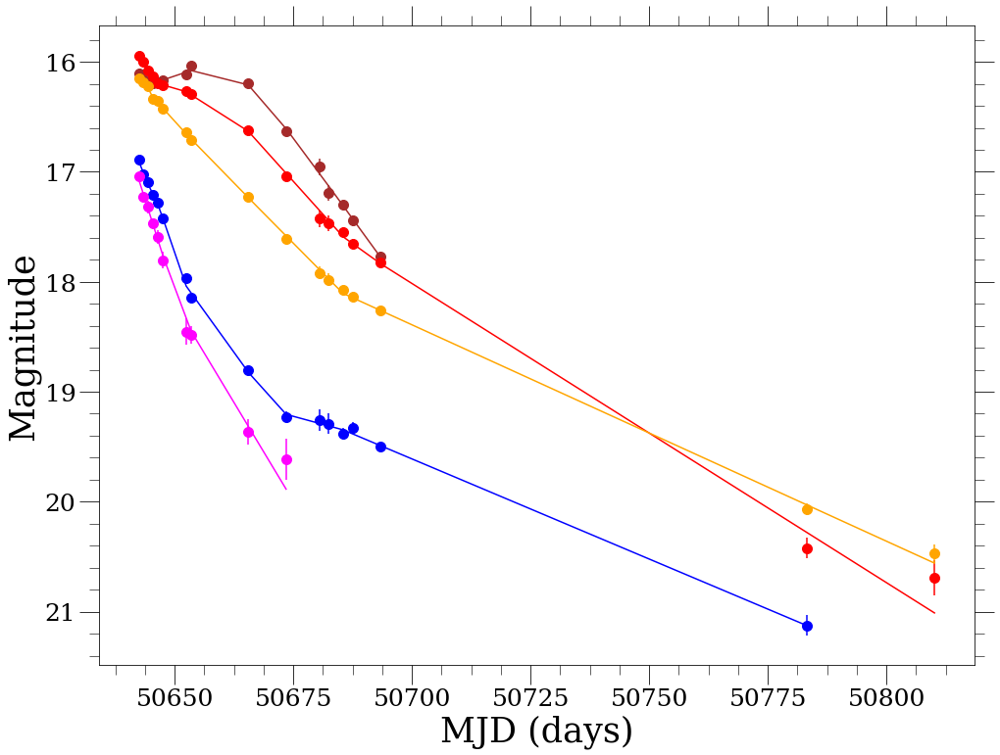

25 1997cw
I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



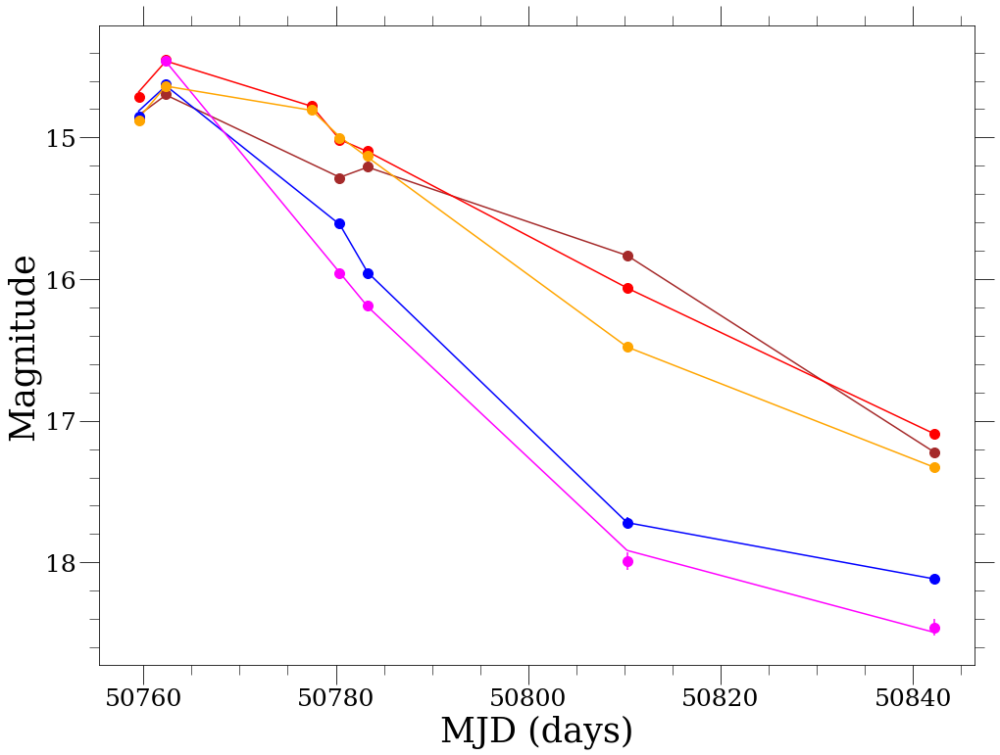

26 1997do
I
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

R
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

U
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4



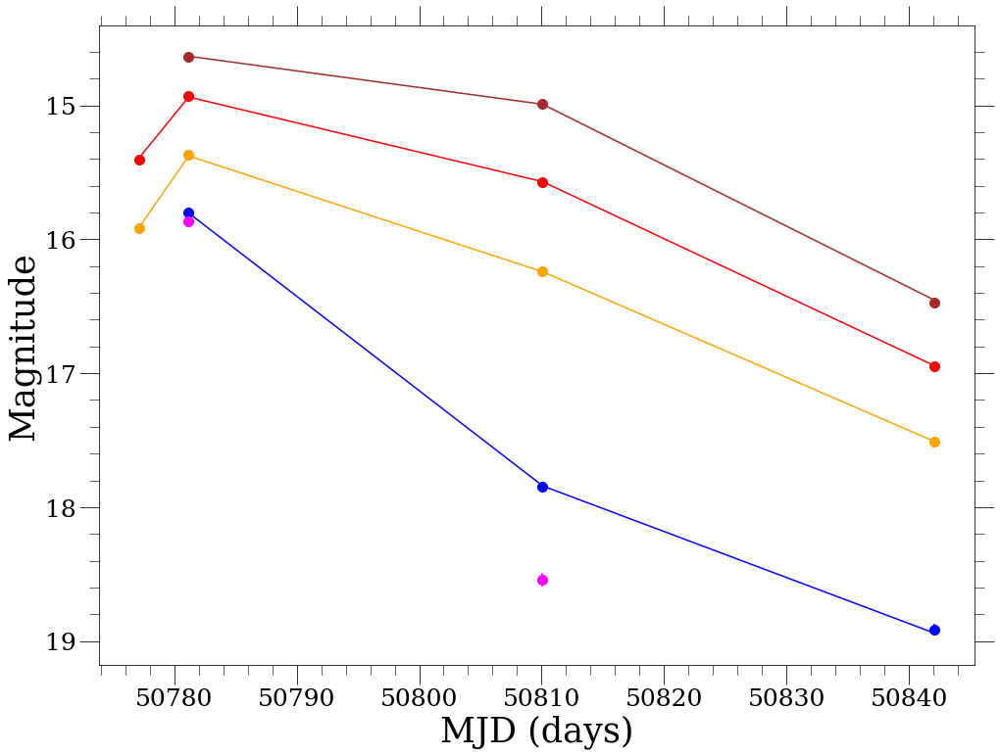

27 1997dt
I
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

B
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

R
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

U
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

V
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13



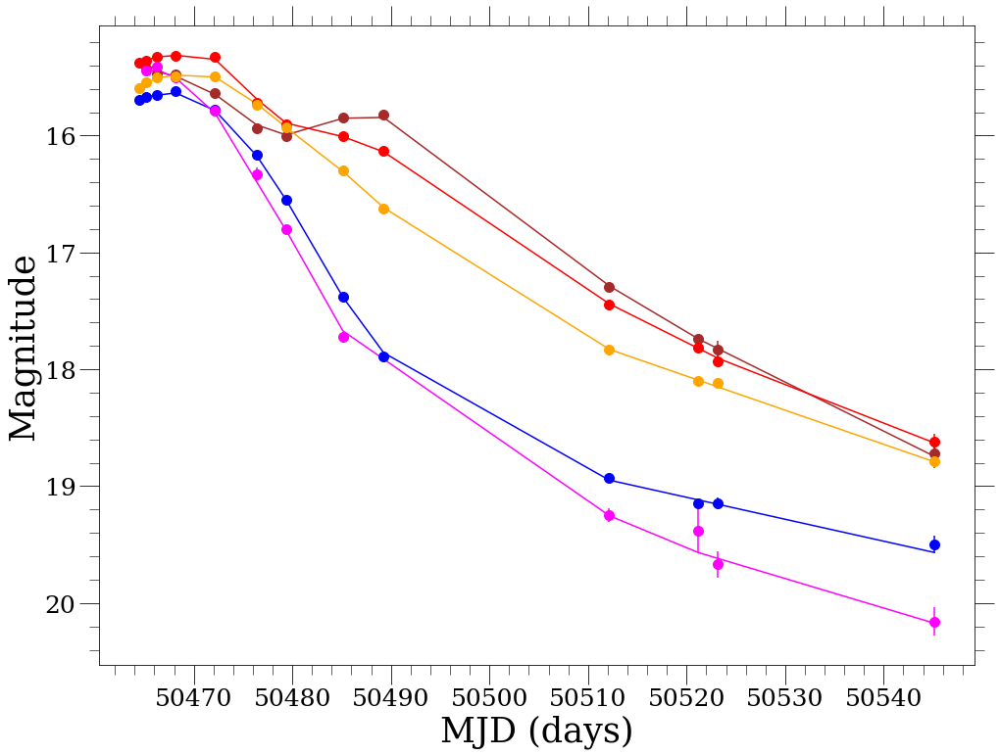

28 1997e
I
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

B
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

R
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



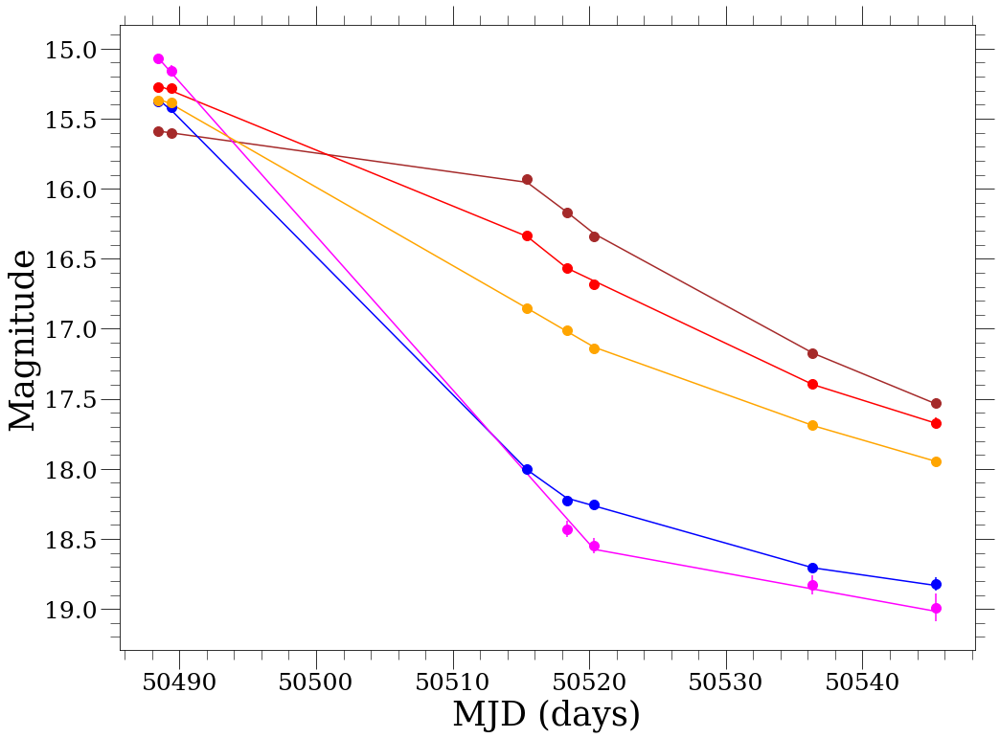

29 1997y
I
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

B
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

R
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

U
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

V
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14



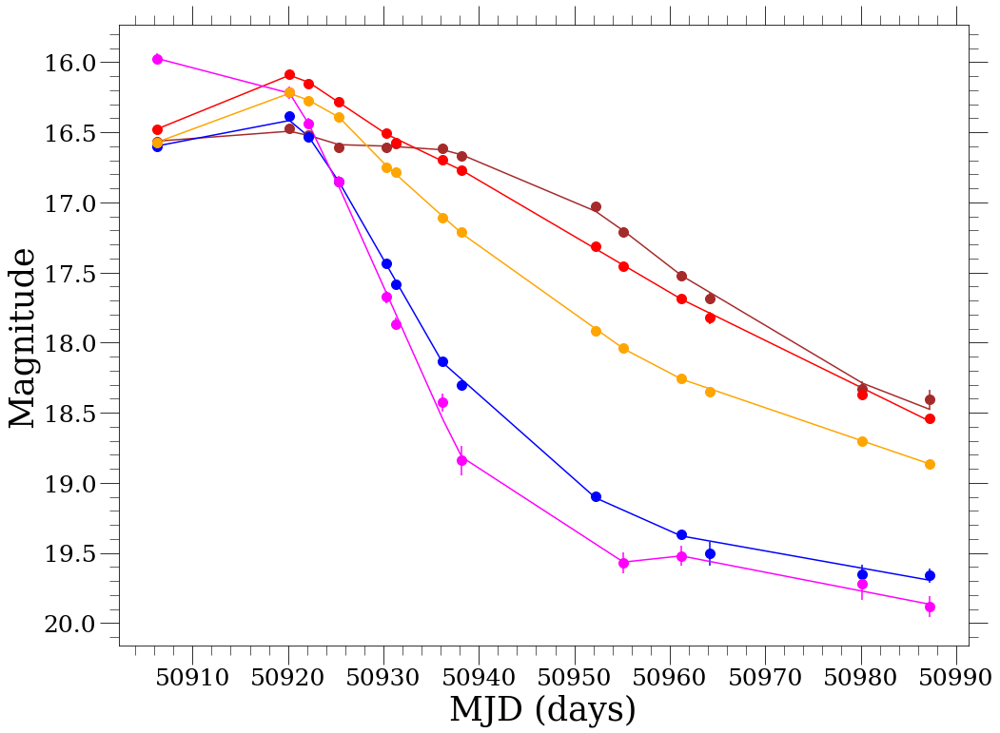

30 1998ab
I
{'None': 49}
{'None': 49}
{'None': 49}
{'None': 49}
None
49

B
{'None': 52}
{'None': 52}
{'None': 52}
{'None': 52}
None
52

R
{'None': 50}
{'None': 50}
{'None': 50}
{'None': 50}
None
50

U
{'None': 48}
{'None': 48}
{'None': 48}
{'None': 48}
None
48

V
{'None': 58}
{'None': 58}
{'None': 58}
{'None': 58}
None
58



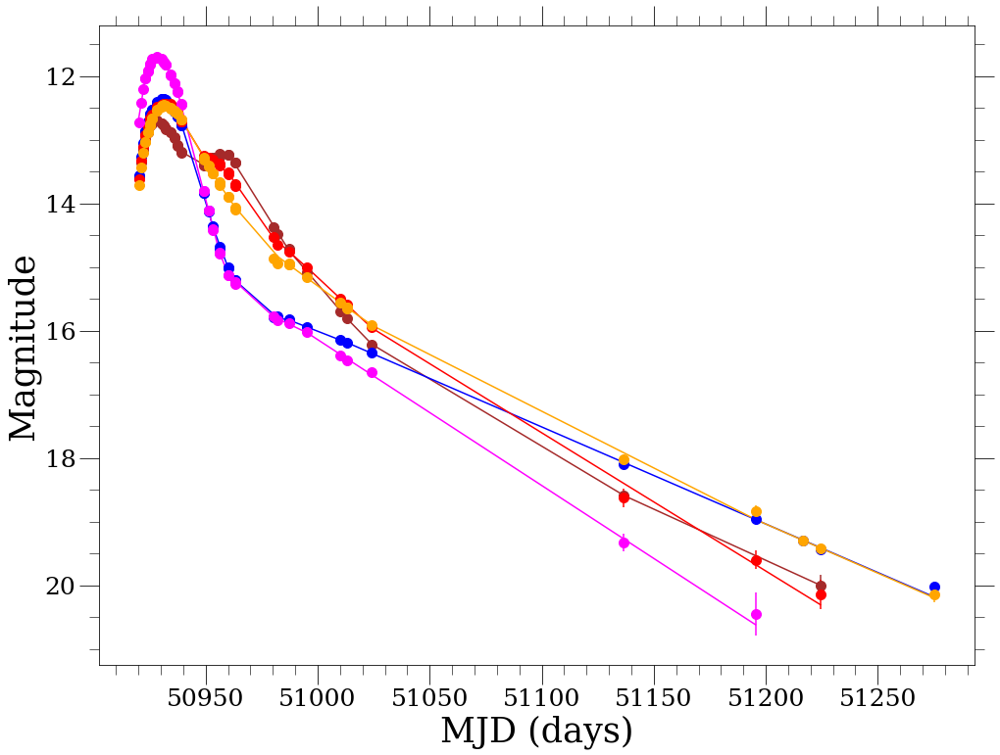

31 1998aq
I
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

B
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

R
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

U
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15



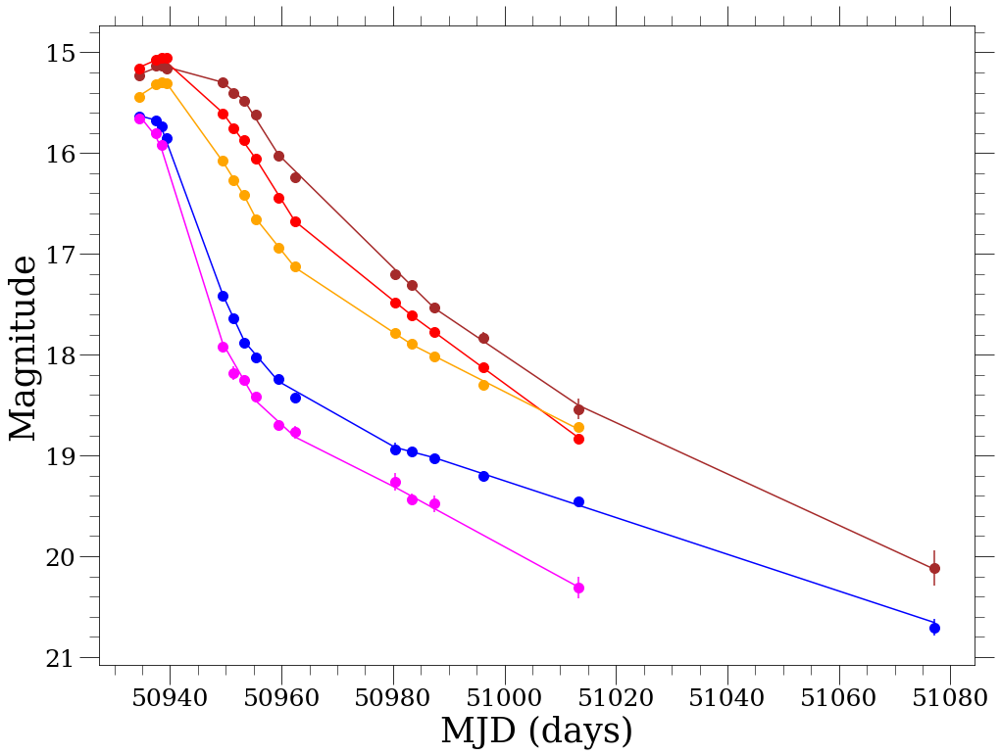

32 1998bp
C
{'None': 154}
{'None': 154}
{'None': 154}
{'None': 154}
None
154

B
{'None': 188}
{'None': 188}
{'None': 188}
{'None': 188}
None
188

I
{'None': 187}
{'None': 187}
{'None': 187}
{'None': 187}
None
187

H
{'WHT': 1, 'UH2.2': 1, 'None': 10, 'TCS': 5, 'UKIRT': 2}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

K
{'WHT': 1, 'UH2.2': 1, 'None': 10, 'TCS': 5, 'UKIRT': 2}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

J
{'UH2.2': 1, 'None': 9, 'TCS': 5, 'UKIRT': 2}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

R
{'None': 187}
{'None': 187}
{'None': 187}
{'None': 187}
None
187

U
{'None': 107}
{'None': 107}
{'None': 107}
{'None': 107}
None
107

V
{'None': 205}
{'None': 205}
{'None': 205}
{'None': 205}
None
205



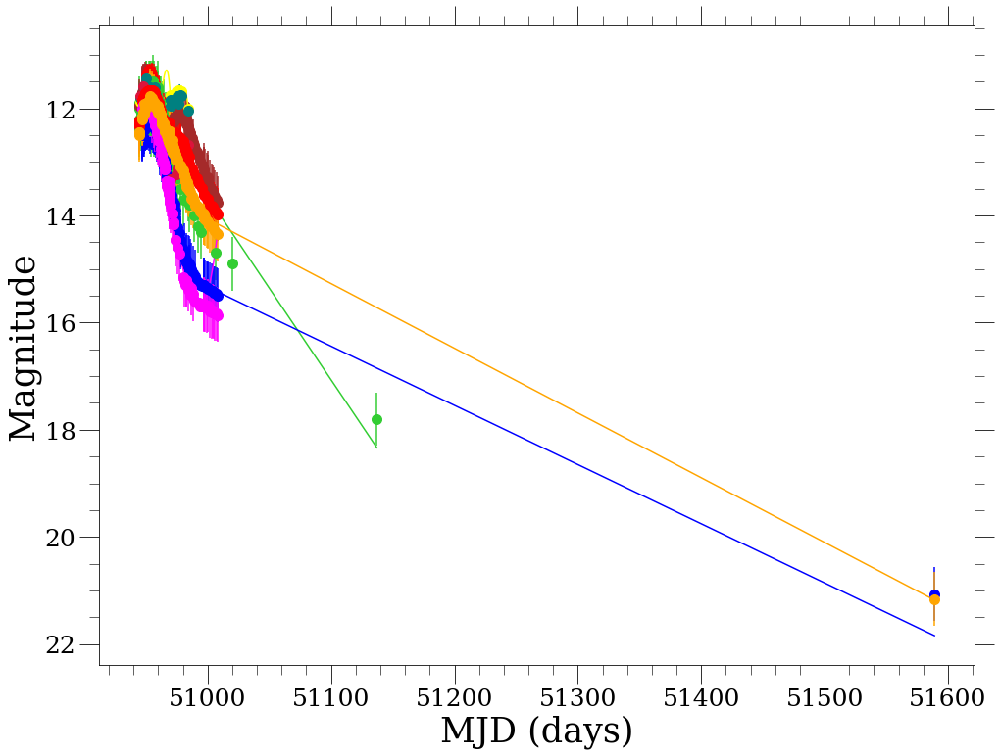

33 1998bu
I
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

U
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

V
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5



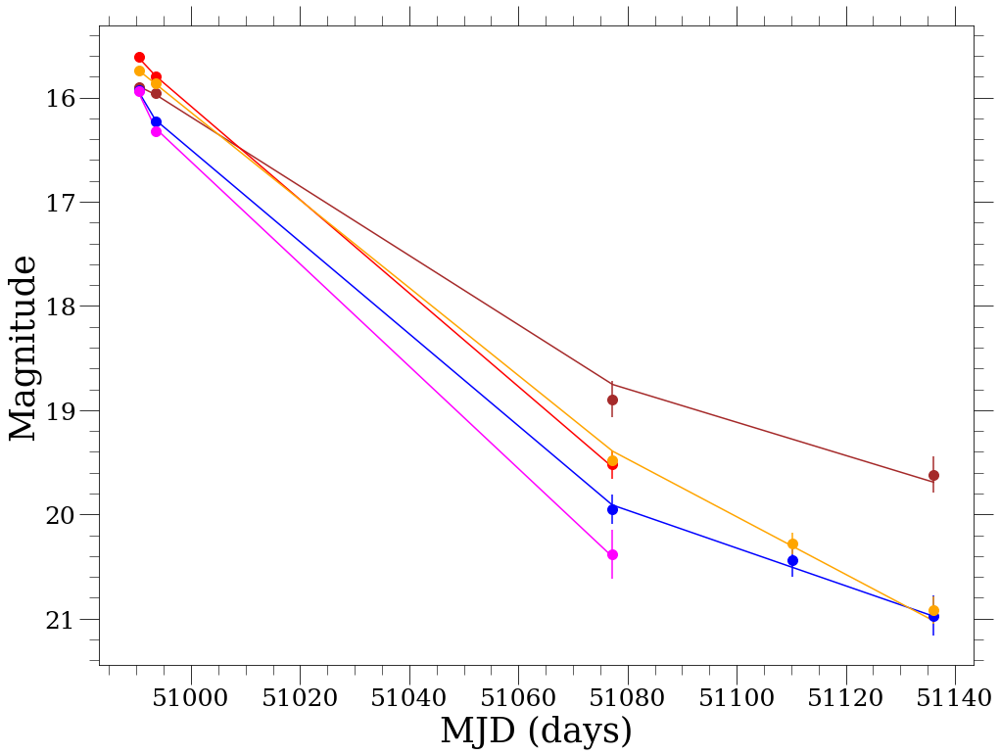

34 1998co
I
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

U
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5



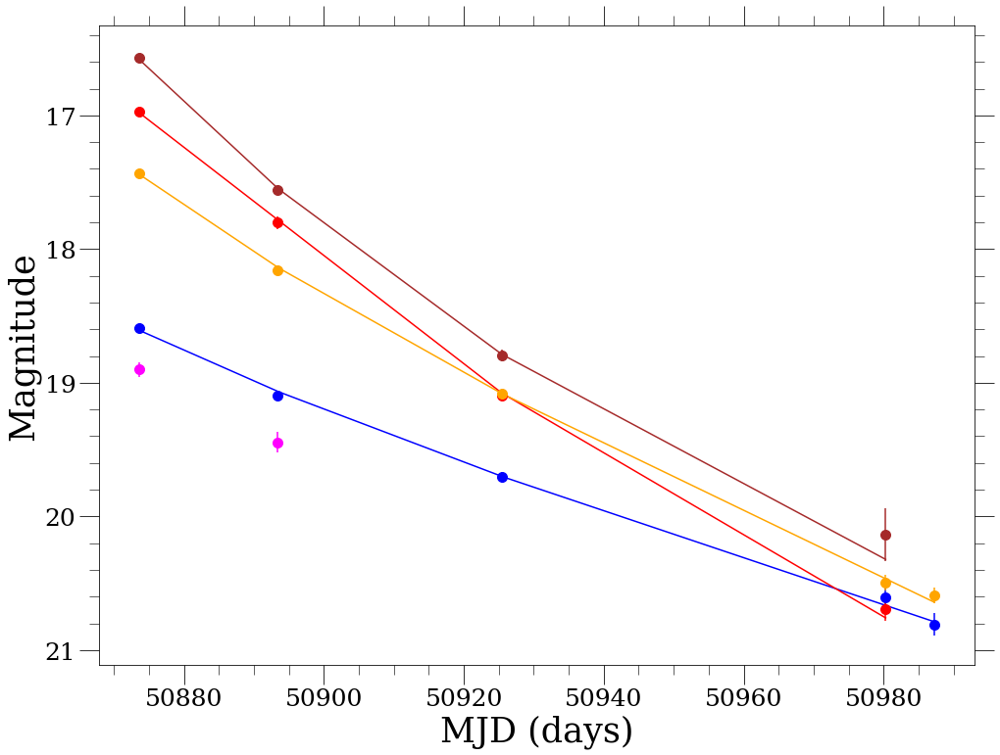

35 1998d
I
{'kait1': 31, 'None': 39}
{'None': 70}
{'None': 70}
{'None': 70}
None
70

R
{'kait1': 33, 'None': 41}
{'None': 74}
{'None': 74}
{'None': 74}
None
74

B
{'kait1': 26, 'None': 32}
{'None': 58}
{'None': 58}
{'None': 58}
None
58

U
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

V
{'kait1': 32, 'None': 43}
{'None': 75}
{'None': 75}
{'None': 75}
None
75



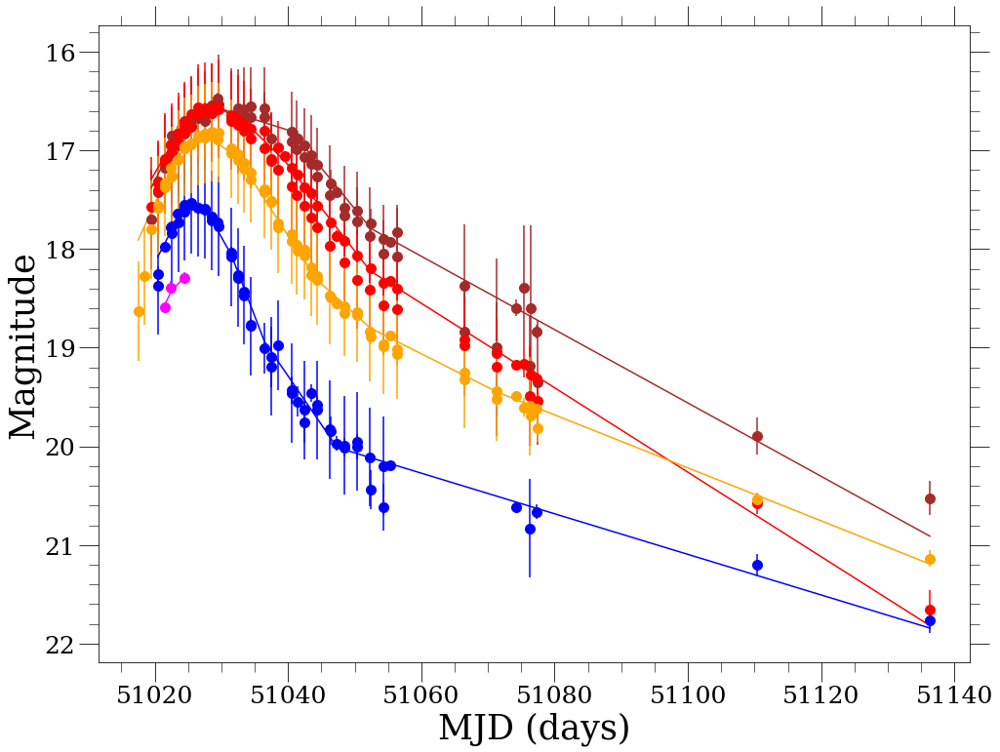

36 1998de
I
{'kait1': 40, 'None': 9}
{'None': 49}
{'None': 49}
{'None': 49}
None
49

B
{'kait1': 40, 'None': 9}
{'None': 49}
{'None': 49}
{'None': 49}
None
49

R
{'kait1': 40, 'None': 8}
{'None': 48}
{'None': 48}
{'None': 48}
None
48

U
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

V
{'kait1': 41, 'None': 9}
{'None': 50}
{'None': 50}
{'None': 50}
None
50



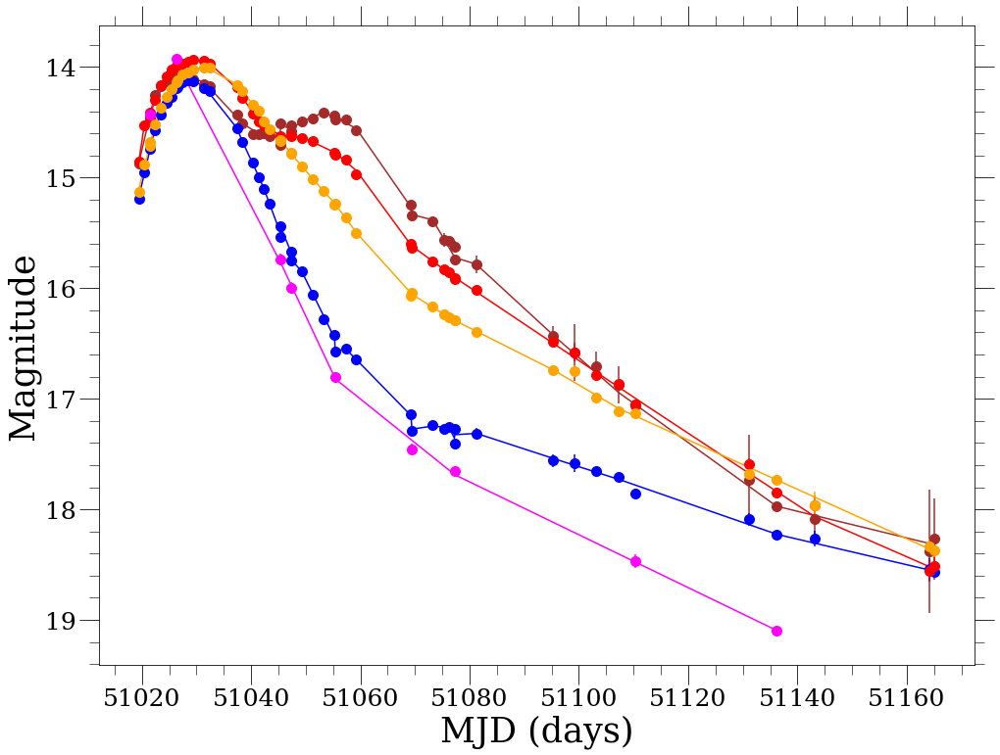

37 1998dh
I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



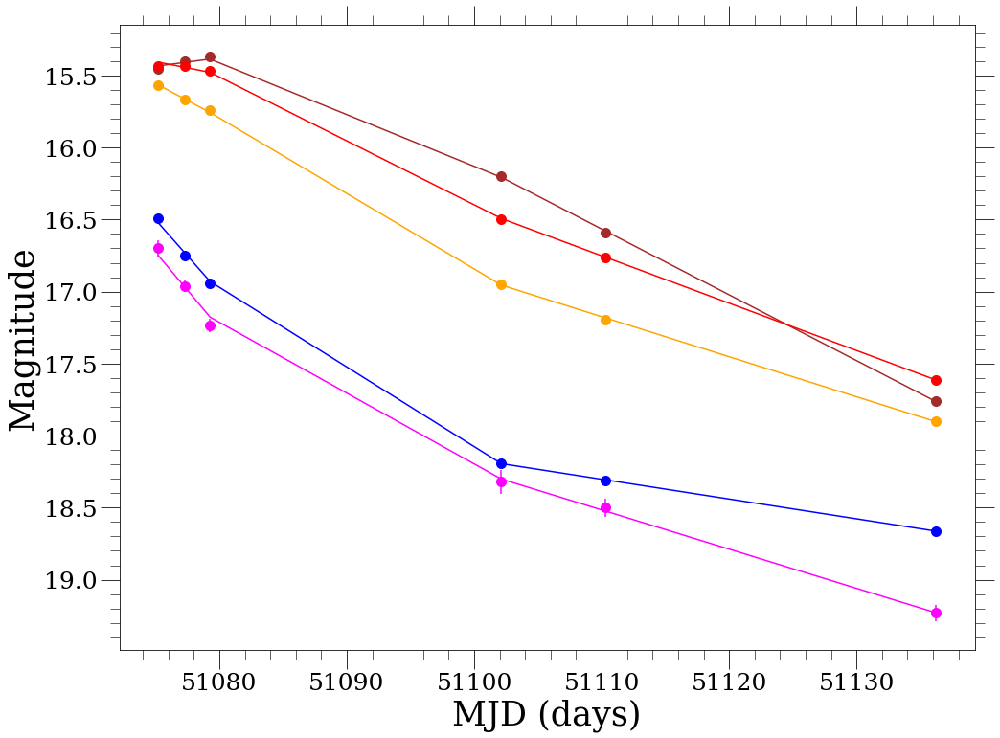

38 1998dk
I
{'kait1': 32, 'None': 7}
{'None': 39}
{'None': 39}
{'None': 39}
None
39

B
{'kait1': 31, 'None': 7}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

R
{'kait1': 33, 'None': 7}
{'None': 40}
{'None': 40}
{'None': 40}
None
40

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'kait1': 33, 'None': 7}
{'None': 40}
{'None': 40}
{'None': 40}
None
40



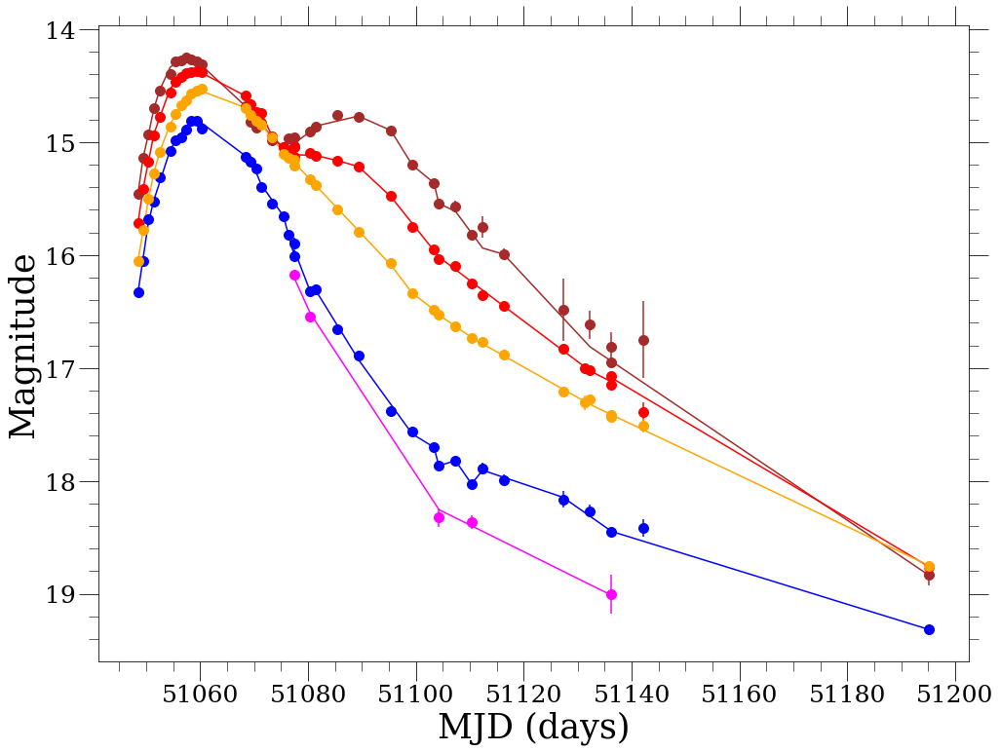

39 1998dm
I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



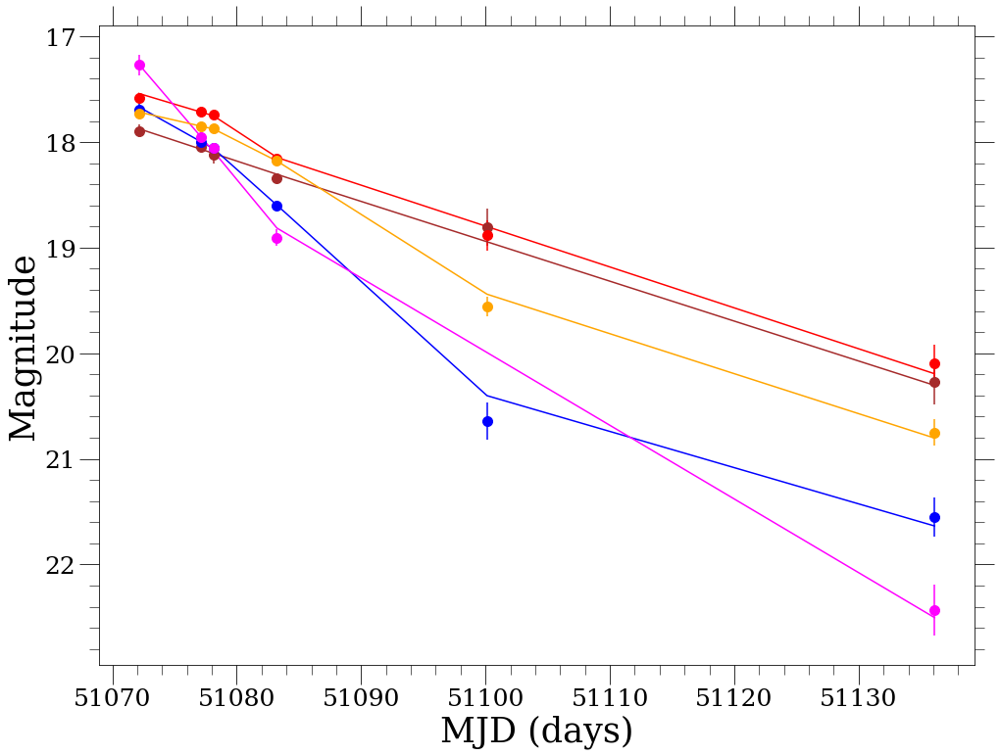

40 1998dx
I
{'kait1': 4, 'None': 7}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

B
{'kait1': 5, 'None': 9}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

R
{'kait1': 4, 'None': 9}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'kait1': 5, 'None': 10}
{'None': 15}
{'None': 15}
{'None': 15}
None
15



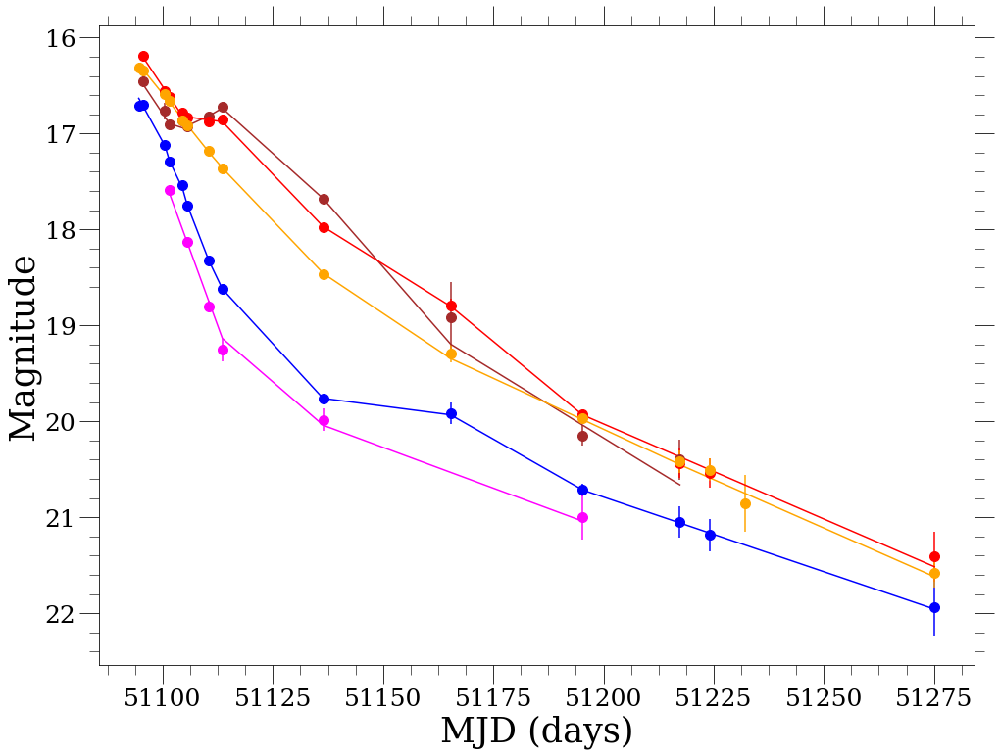

41 1998ec
I
{'kait1': 20, 'None': 7}
{'None': 27}
{'None': 27}
{'None': 27}
None
27

B
{'kait1': 20, 'None': 8}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

R
{'kait1': 20, 'None': 8}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'kait1': 23, 'None': 8}
{'None': 31}
{'None': 31}
{'None': 31}
None
31



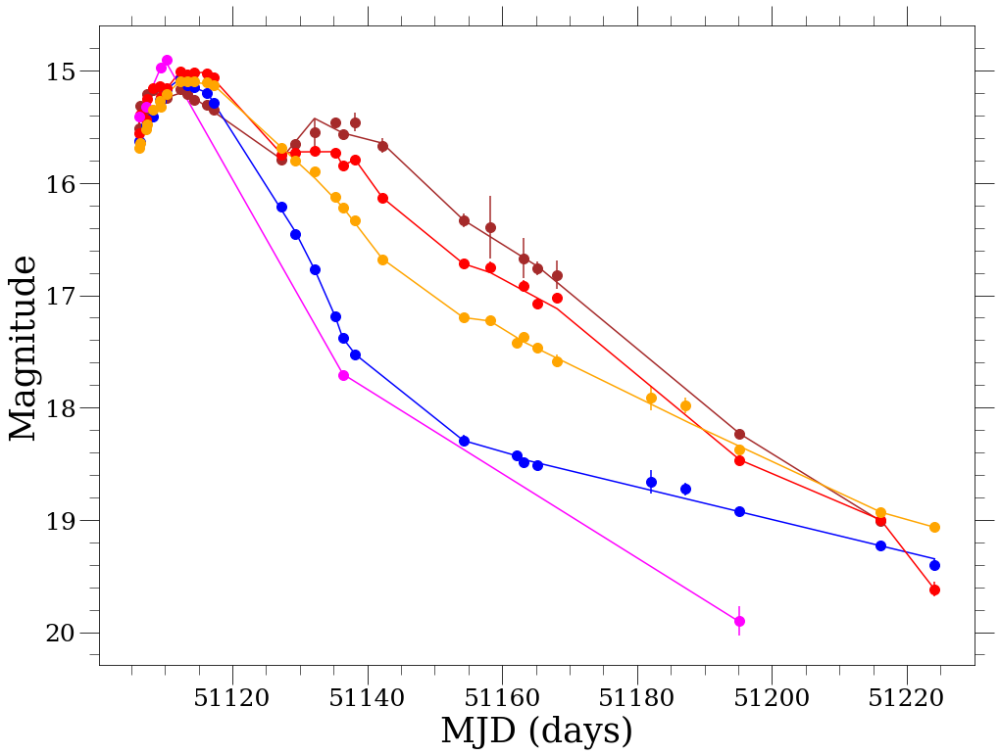

42 1998ef
I
{'kait1': 4, 'None': 4}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

B
{'kait1': 4, 'None': 5}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

R
{'kait1': 4, 'None': 5}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'kait1': 4, 'None': 5}
{'None': 9}
{'None': 9}
{'None': 9}
None
9



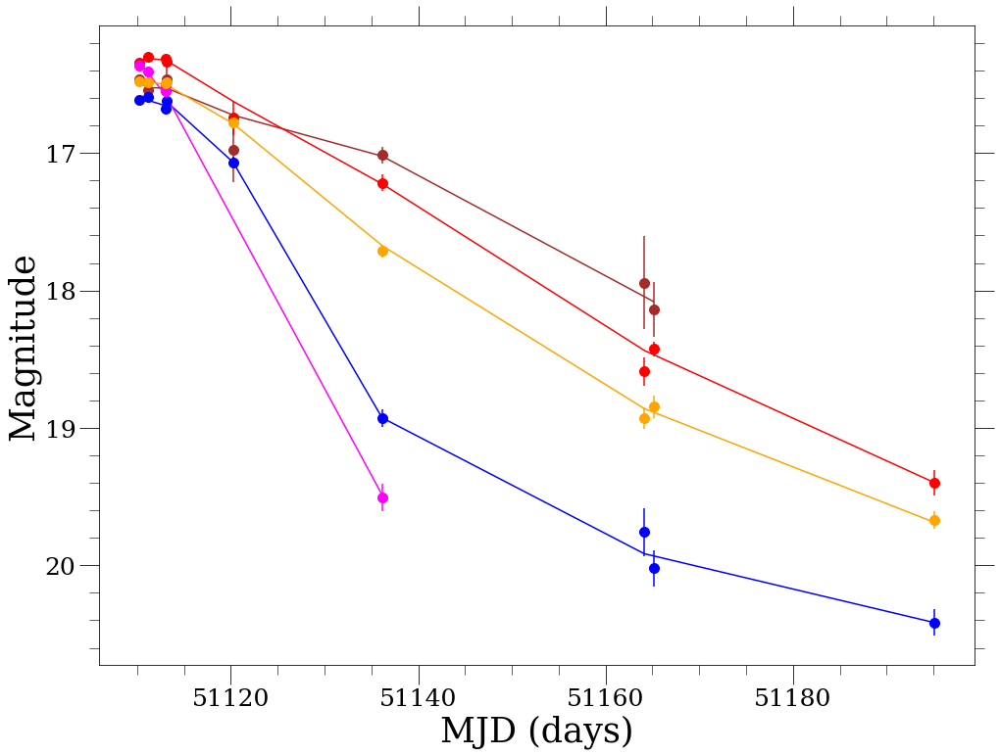

43 1998eg
I
{'kait1': 17, 'None': 16}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

B
{'kait1': 17, 'None': 18}
{'None': 35}
{'None': 35}
{'None': 35}
None
35

R
{'kait1': 18, 'None': 19}
{'None': 37}
{'None': 37}
{'None': 37}
None
37

U
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

V
{'kait1': 18, 'None': 18}
{'None': 36}
{'None': 36}
{'None': 36}
None
36



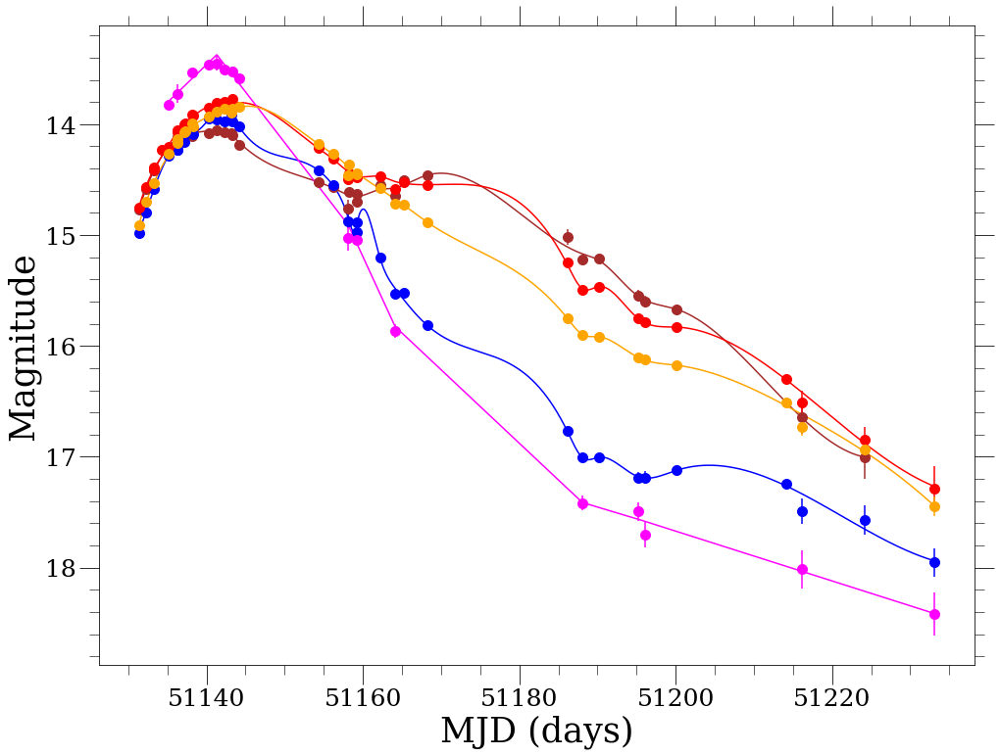

44 1998es
C
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

B
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

I
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

R
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13



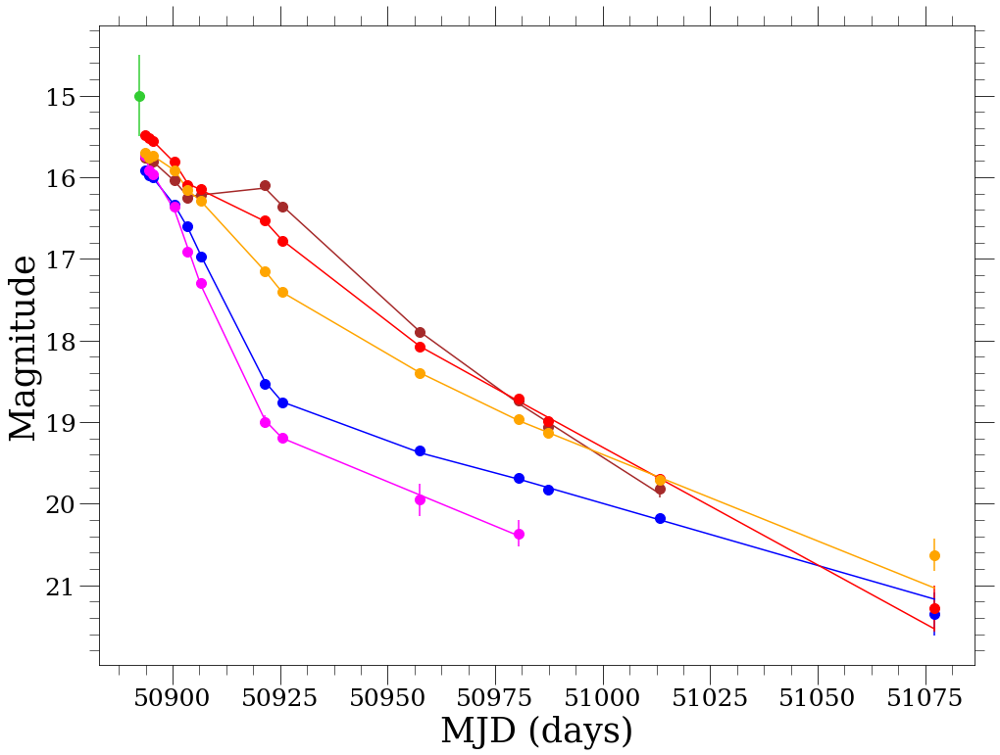

45 1998v
C
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

B
{'None': 28, 'CTIO 1.5m T2K': 2, 'LICK 1m DEWAR2': 7, 'LICK 1m DEWAR5': 4, 'kait2': 19, 'YALO': 13}
{'None': 73}
{'None': 73}
{'None': 73}
None
73

I
{'None': 27, 'CTIO 1.5m T2K': 1, 'LICK 1m DEWAR2': 1, 'LICK 1m DEWAR5': 4, 'YALO': 12, 'kait2': 16, 'JKT 1m': 1}
{'None': 62}
{'None': 62}
{'None': 62}
None
62

K
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

J
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

R
{'None': 25, 'CTIO 1.5m T2K': 1, 'LICK 1m DEWAR2': 5, 'LICK 1m DEWAR5': 4, 'kait2': 16, 'YALO': 13}
{'None': 64}
{'None': 64}
{'None': 64}
None
64

U
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

V
{'None': 26, 'CTIO 1.5m T2K': 2, 'LICK 1m DEWAR2': 6, 'LICK 1m DEWAR5': 2, 'kait2': 18, 'YALO': 12}
{'None': 66}
{'None': 66}
{'None': 66}
None
66



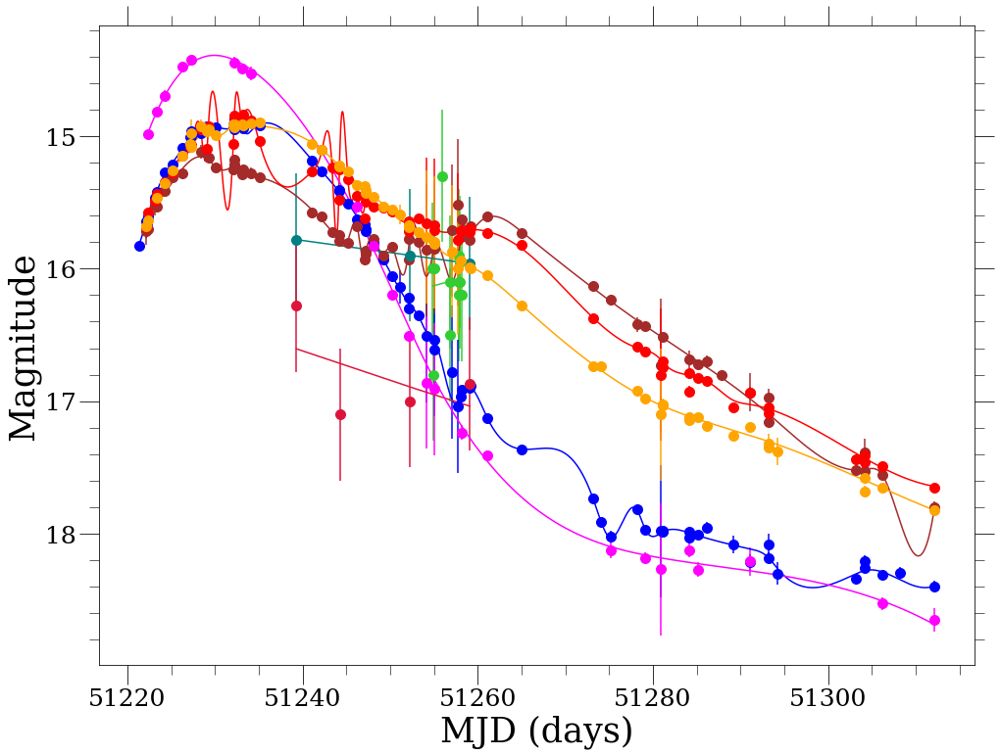

46 1999aa
C
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

B
{'None': 56, 'kait2': 20}
{'None': 76}
{'None': 76}
{'None': 76}
None
76

I
{'None': 52, 'kait2': 20}
{'None': 72}
{'None': 72}
{'None': 72}
None
72

H
{'None': 29}
{'None': 29}
{'None': 29}
{'None': 29}
None
29

Js
{'None': 29}
{'None': 29}
{'None': 29}
{'None': 29}
None
29

Ks
{'None': 28}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

R
{'None': 40, 'kait2': 20}
{'None': 60}
{'None': 60}
{'None': 60}
None
60

U
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

V
{'None': 56, 'kait2': 20}
{'None': 76}
{'None': 76}
{'None': 76}
None
76



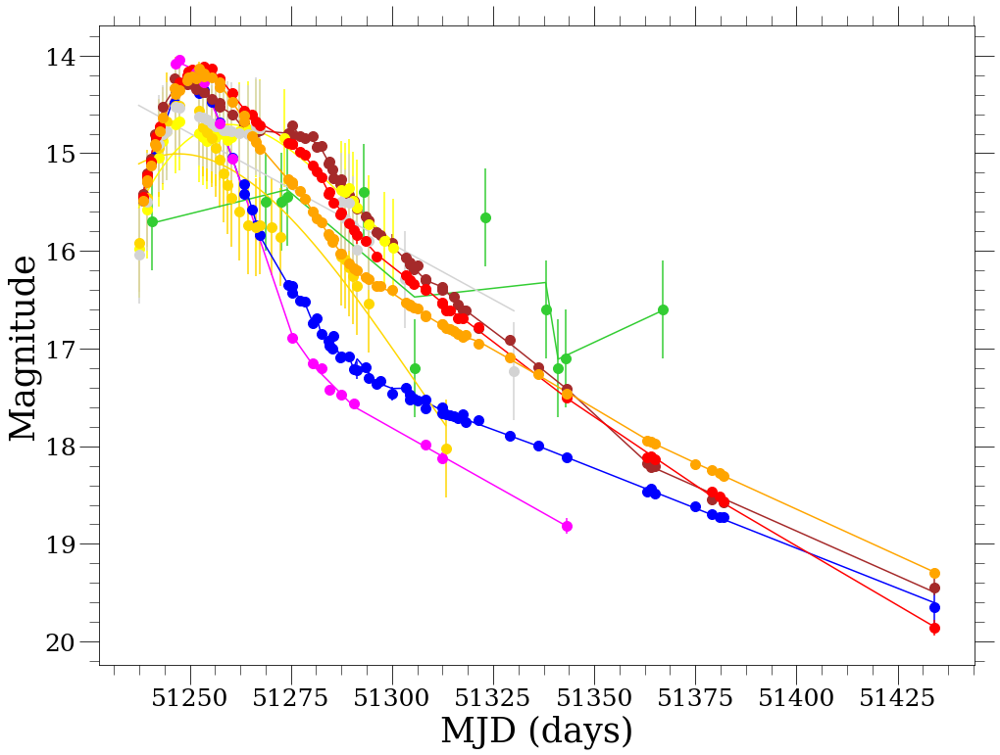

47 1999ac
C
{'None': 175}
{'None': 175}
{'None': 175}
{'None': 175}
None
175

B
{'None': 53, 'kait2': 27}
{'None': 80}
{'None': 80}
{'None': 80}
None
80

I
{'None': 53, 'kait2': 28}
{'None': 81}
{'None': 81}
{'None': 81}
None
81

H
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

K
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

J
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

R
{'None': 53, 'kait2': 28}
{'None': 81}
{'None': 81}
{'None': 81}
None
81

U
{'None': 42}
{'None': 42}
{'None': 42}
{'None': 42}
None
42

V
{'None': 58, 'kait2': 28}
{'None': 86}
{'None': 86}
{'None': 86}
None
86



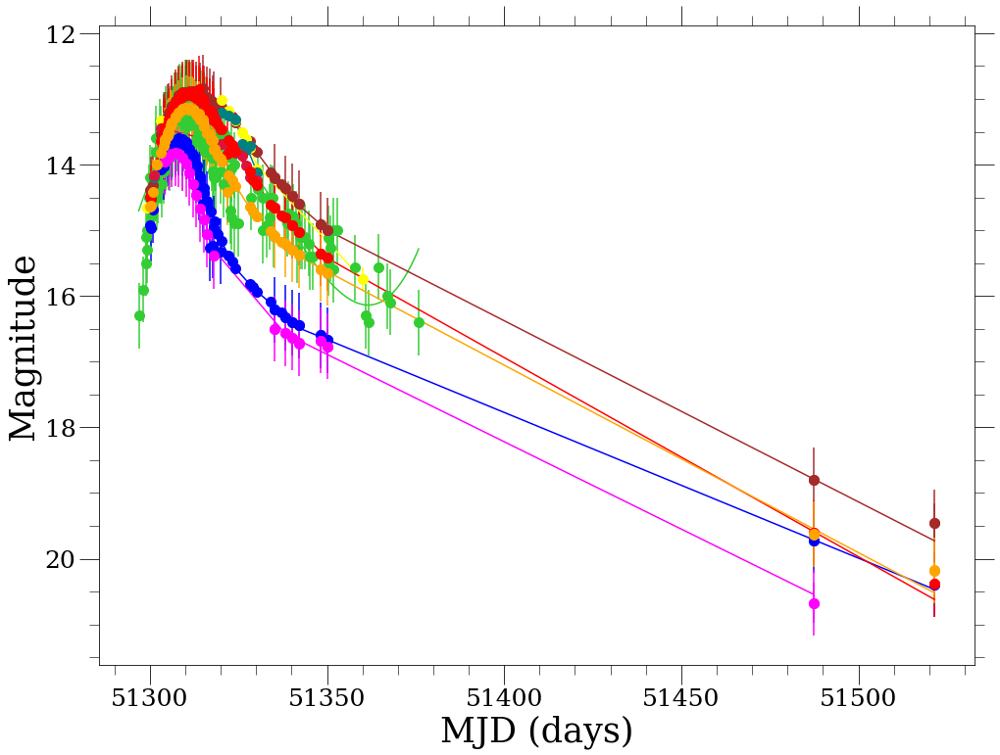

48 1999by
C
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

B
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

I
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

R
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 20}
{'None': 20}
{'None': 20}
{'None': 20}
None
20



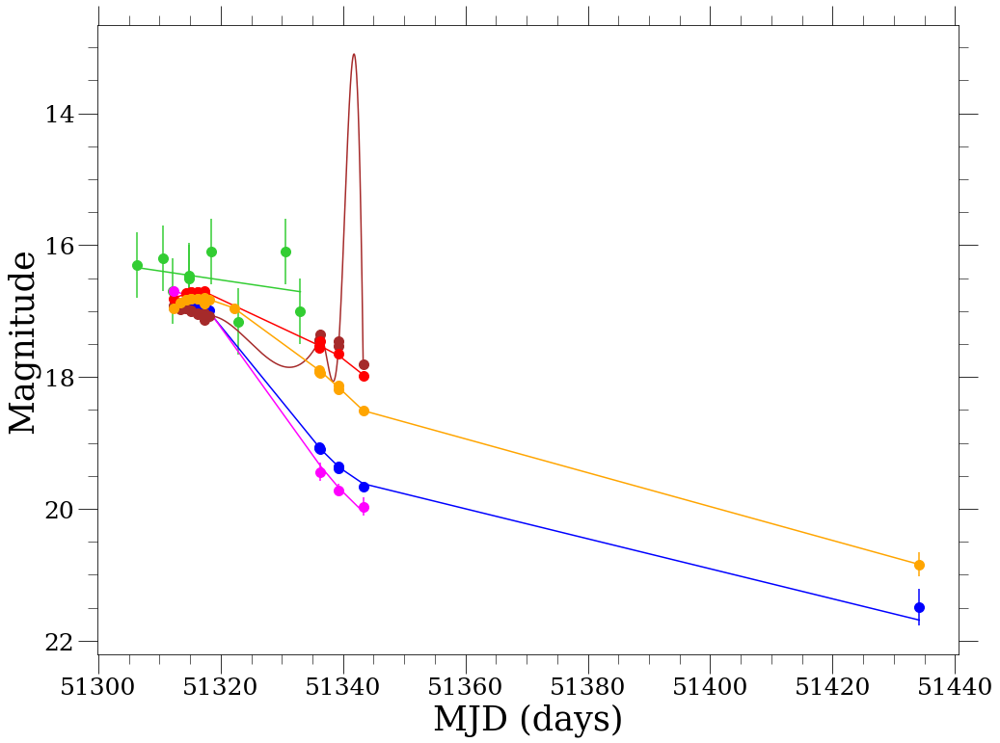

49 1999cc
C
{'None': 45}
{'None': 45}
{'None': 45}
{'None': 45}
None
45

B
{'None': 0, 'kait2': 27}
{'None': 27}
{'None': 27}
{'None': 27}
None
27

I
{'None': 0, 'kait2': 27}
{'None': 27}
{'None': 27}
{'None': 27}
None
27

H
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

K
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

J
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

R
{'None': 0, 'kait2': 28}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

V
{'None': 1, 'kait2': 29}
{'None': 30}
{'None': 30}
{'None': 30}
None
30



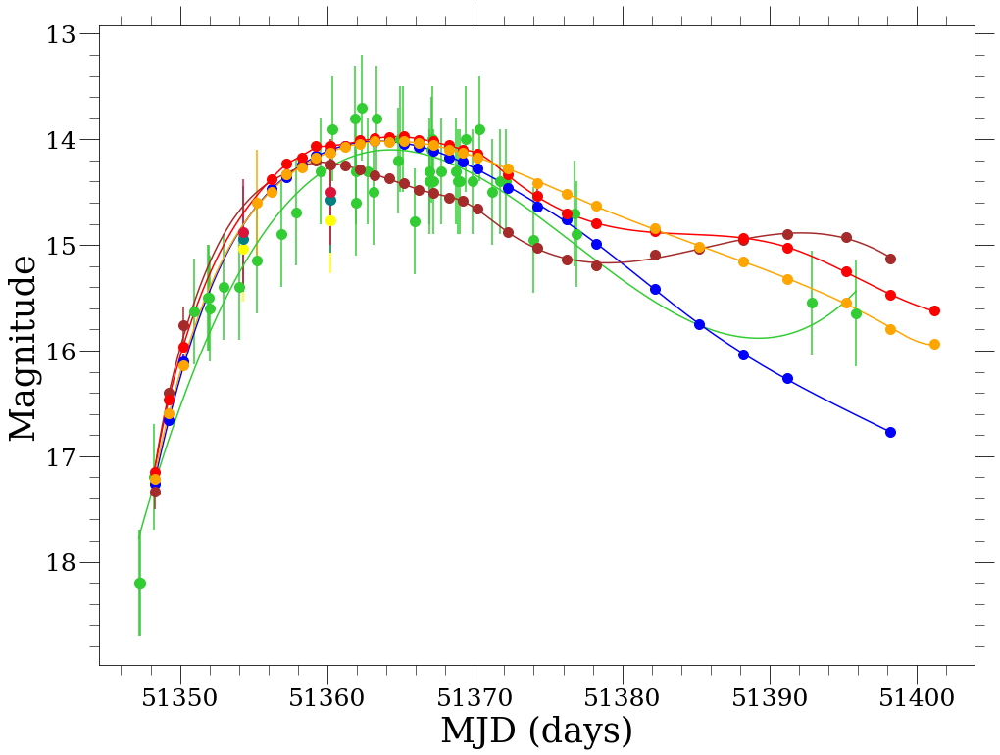

50 1999cp
C
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

I
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



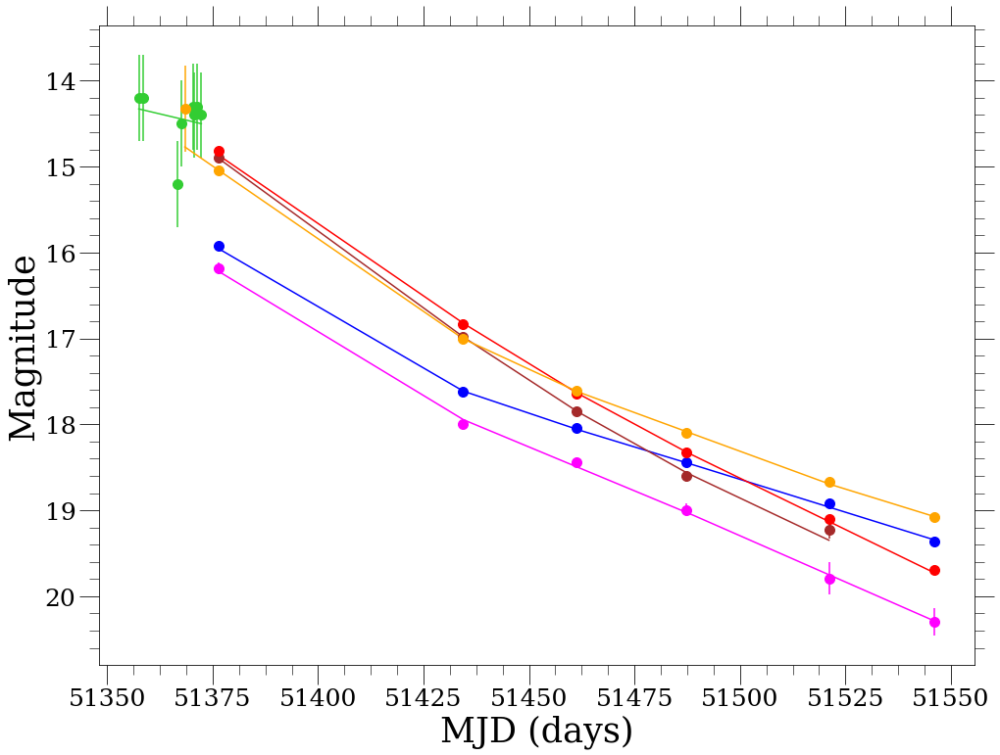

51 1999cw
I
{'None': 8, 'kait2': 26}
{'None': 34}
{'None': 34}
{'None': 34}
None
34

B
{'None': 6, 'kait2': 25}
{'None': 31}
{'None': 31}
{'None': 31}
None
31

R
{'None': 8, 'kait2': 25}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

C
{'None': 38}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

V
{'None': 9, 'kait2': 25}
{'None': 34}
{'None': 34}
{'None': 34}
None
34



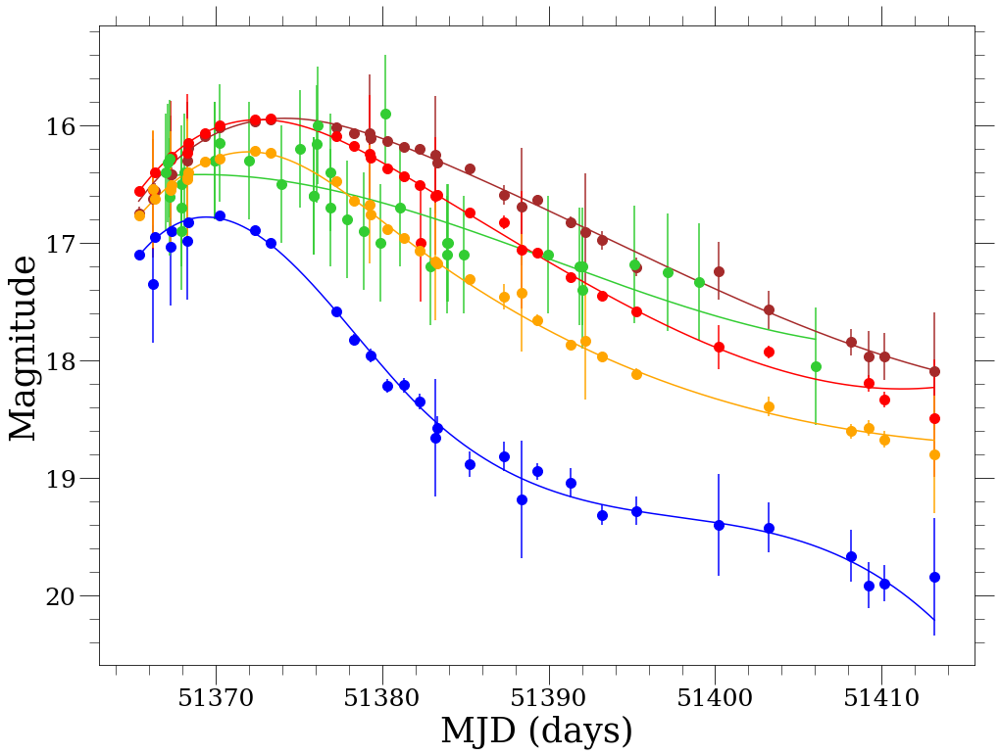

52 1999da
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 25, 'kait2': 30}
{'None': 55}
{'None': 55}
{'None': 55}
None
55

I
{'None': 27, 'kait2': 27}
{'None': 54}
{'None': 54}
{'None': 54}
None
54

R
{'None': 28, 'kait2': 30}
{'None': 58}
{'None': 58}
{'None': 58}
None
58

U
{'None': 22}
{'None': 22}
{'None': 22}
{'None': 22}
None
22

V
{'None': 28, 'kait2': 30}
{'None': 58}
{'None': 58}
{'None': 58}
None
58



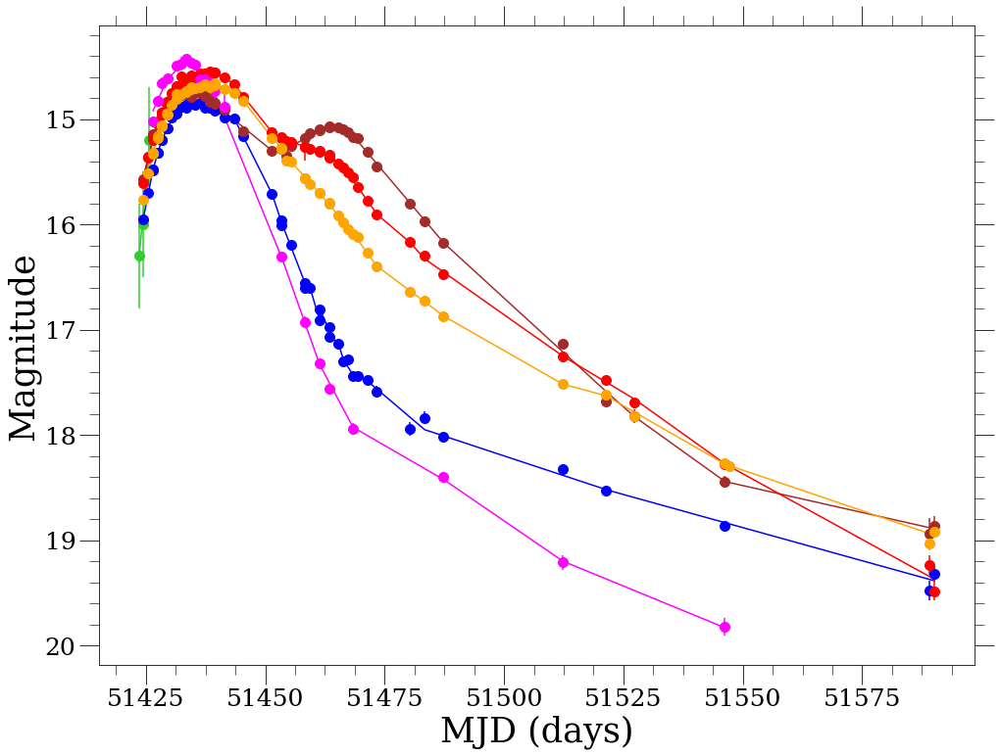

53 1999dq
I
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

B
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



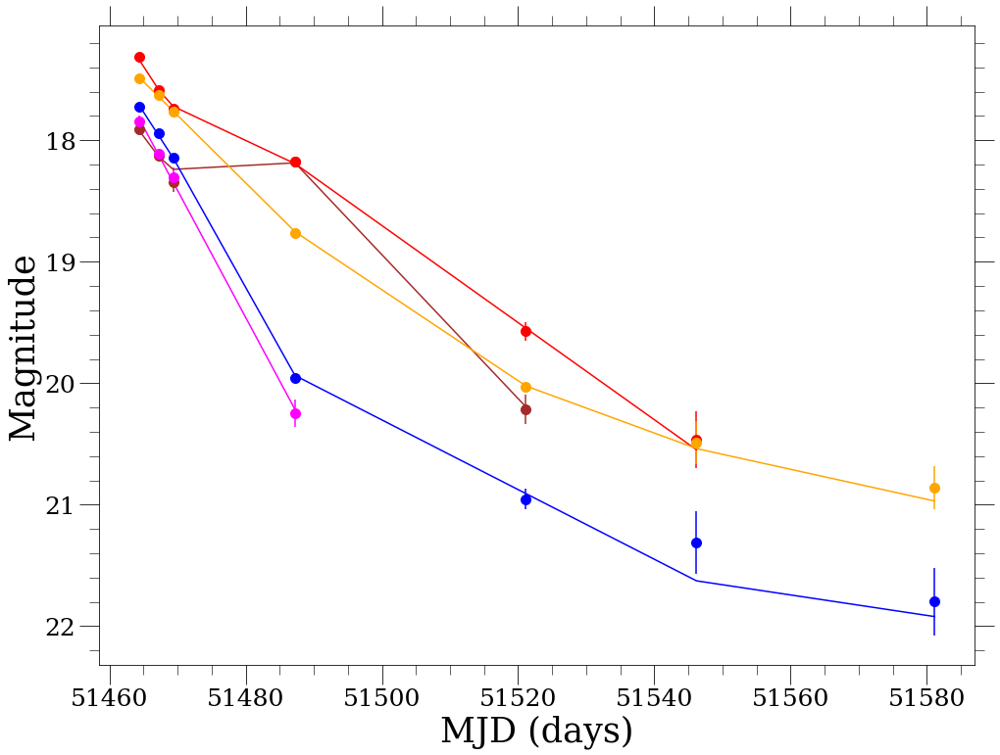

54 1999ef
I
{'None': 5, 'kait2': 24}
{'None': 29}
{'None': 29}
{'None': 29}
None
29

B
{'None': 6, 'kait2': 25}
{'None': 31}
{'None': 31}
{'None': 31}
None
31

R
{'None': 6, 'kait2': 25}
{'None': 31}
{'None': 31}
{'None': 31}
None
31

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 5, 'kait2': 25}
{'None': 30}
{'None': 30}
{'None': 30}
None
30



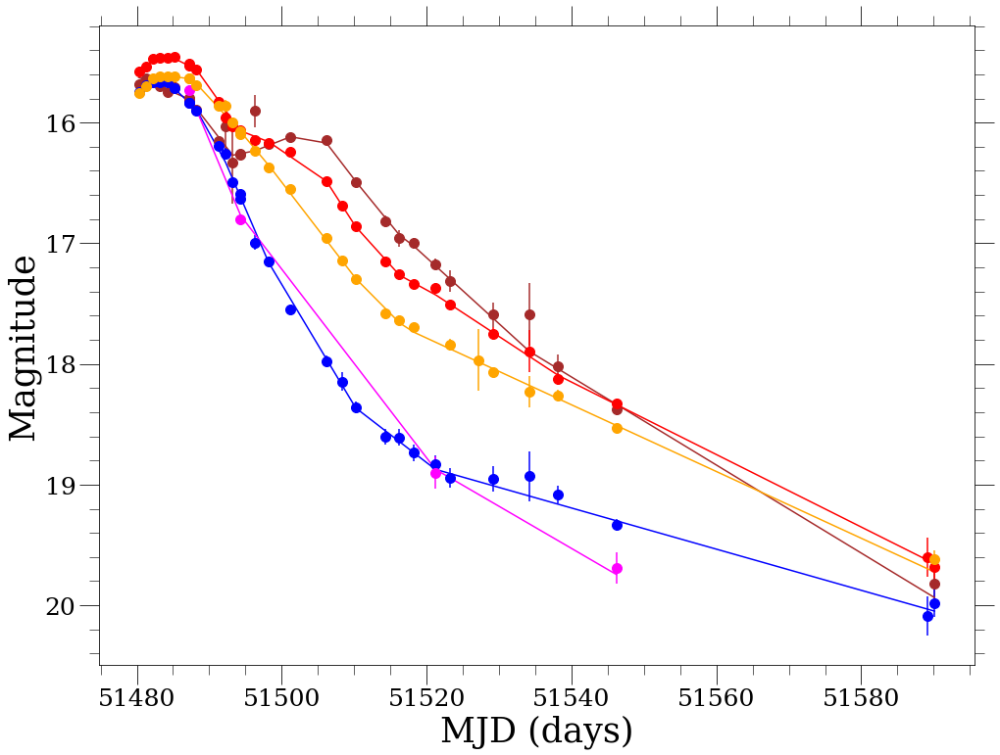

55 1999ej
B
{'None': 38}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

I
{'None': 34}
{'None': 34}
{'None': 34}
{'None': 34}
None
34

H
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

K
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

J
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

R
{'None': 35}
{'None': 35}
{'None': 35}
{'None': 35}
None
35

U
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 38}
{'None': 38}
{'None': 38}
{'None': 38}
None
38



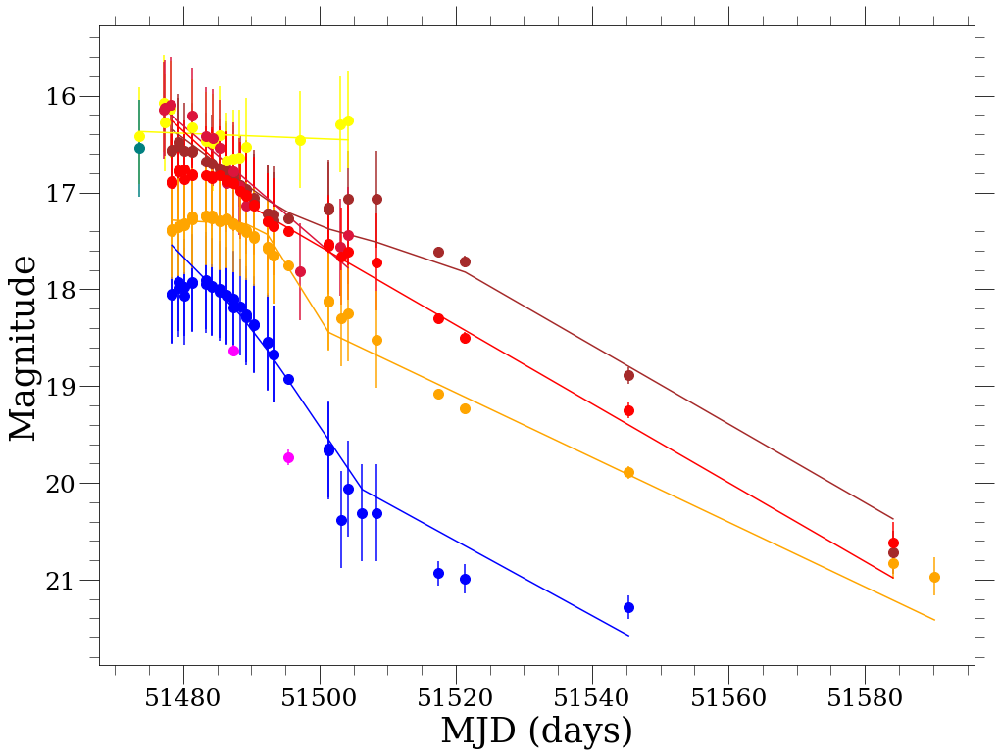

56 1999ek
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

I
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

R
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9



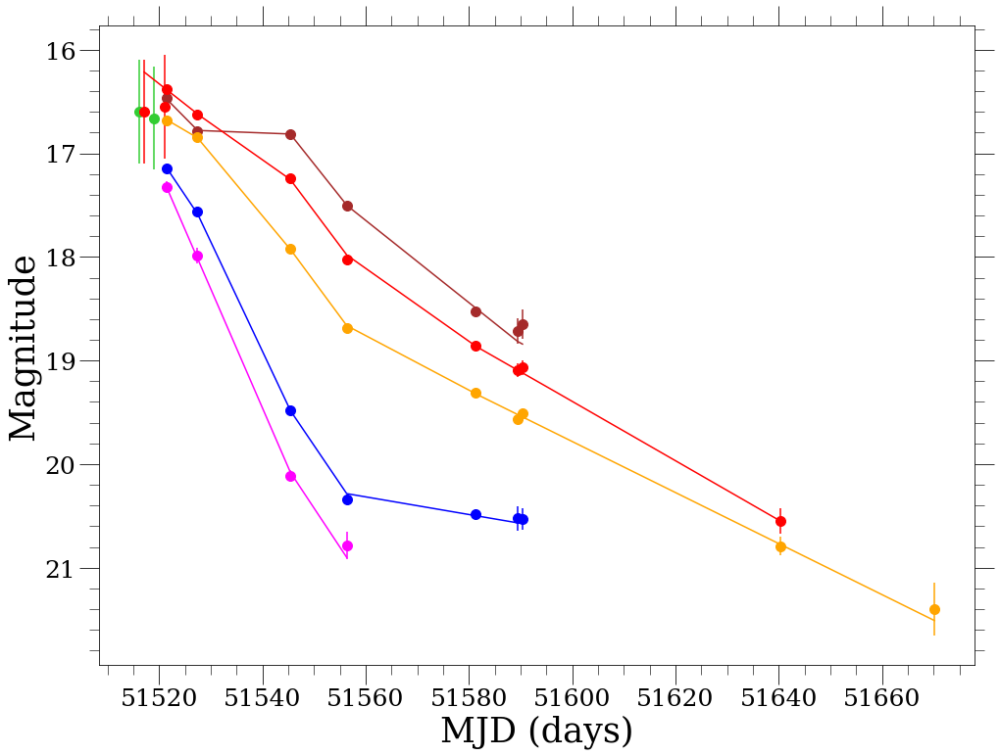

57 1999gd
I
{'None': 18, 'kait2': 6}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

B
{'None': 17, 'kait2': 8}
{'None': 25}
{'None': 25}
{'None': 25}
None
25

R
{'None': 18, 'kait2': 8}
{'None': 26}
{'None': 26}
{'None': 26}
None
26

U
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

V
{'None': 18, 'kait2': 9}
{'None': 27}
{'None': 27}
{'None': 27}
None
27



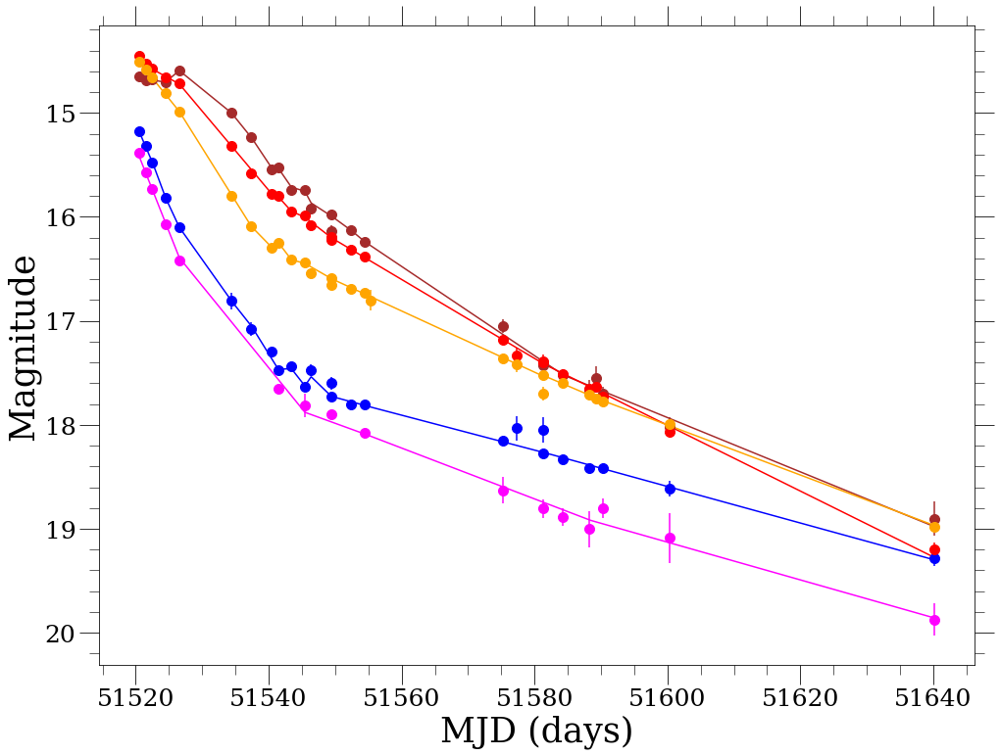

58 1999gh
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 27, 'kait2': 23}
{'None': 50}
{'None': 50}
{'None': 50}
None
50

I
{'None': 27, 'kait2': 20}
{'None': 47}
{'None': 47}
{'None': 47}
None
47

H
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

K
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

J
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

R
{'None': 30, 'kait2': 21}
{'None': 51}
{'None': 51}
{'None': 51}
None
51

U
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

V
{'None': 29, 'kait2': 23}
{'None': 52}
{'None': 52}
{'None': 52}
None
52



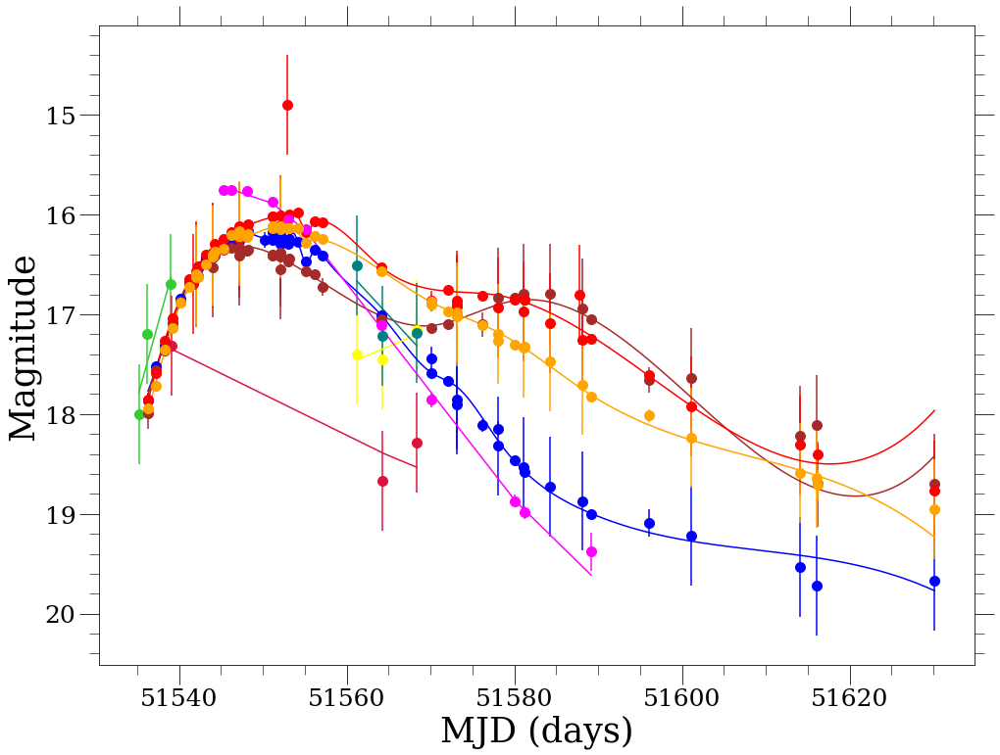

59 1999gp
C
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

I
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



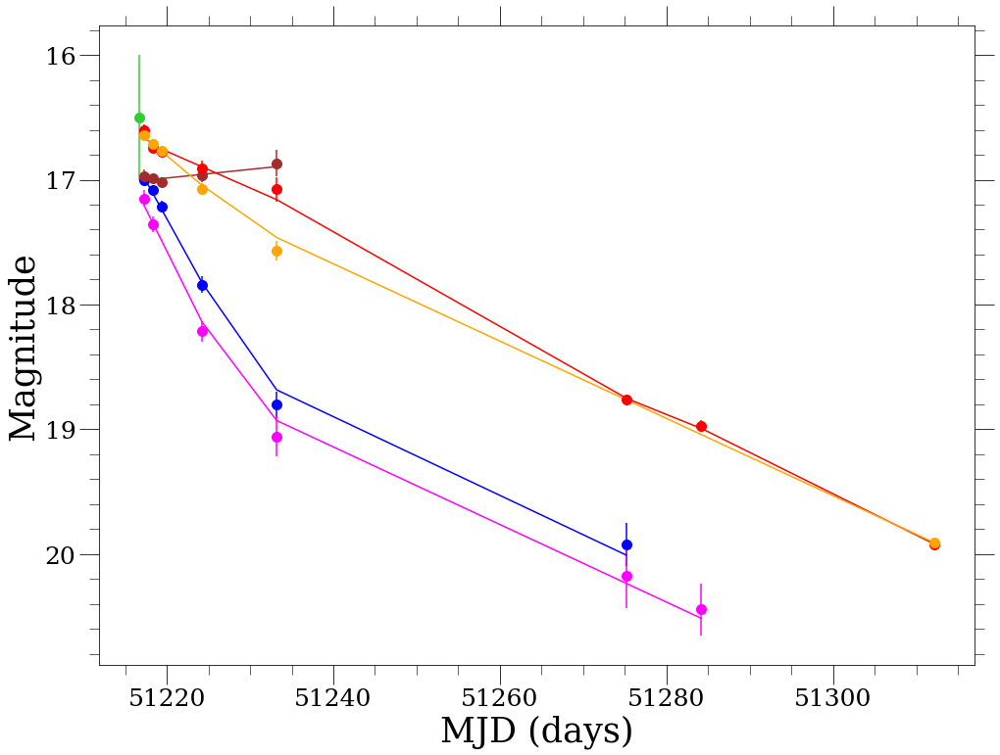

60 1999x
I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



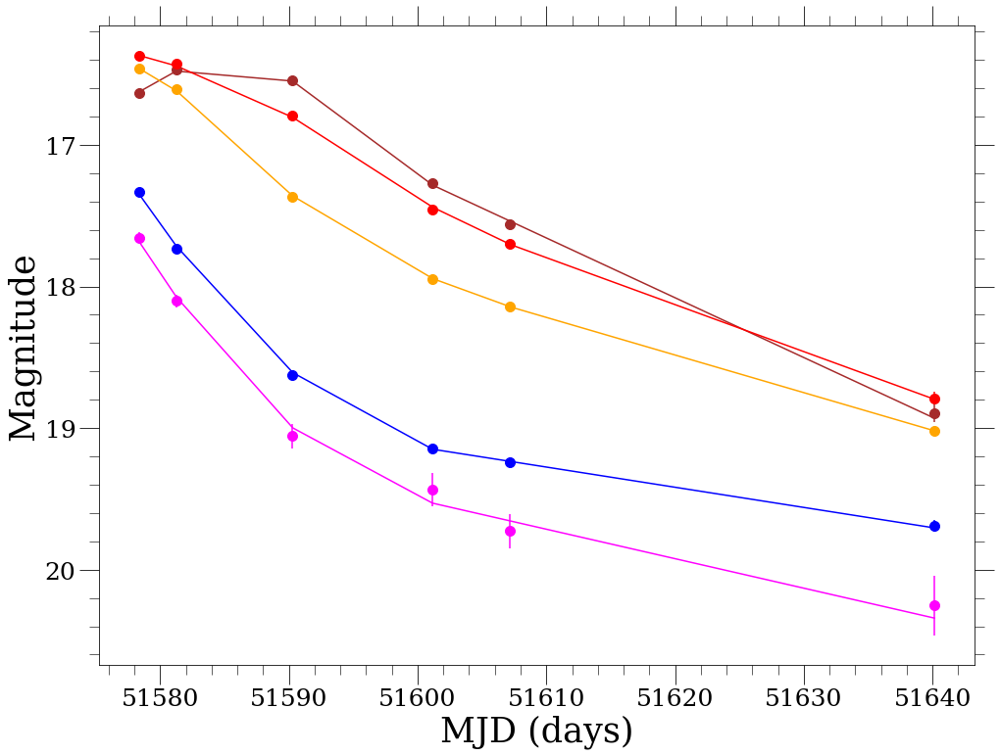

61 2000b
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

I
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

H
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

Js
{'None': 20}
{'None': 20}
{'None': 20}
{'None': 20}
None
20

Ks
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

U
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

V
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

Y
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



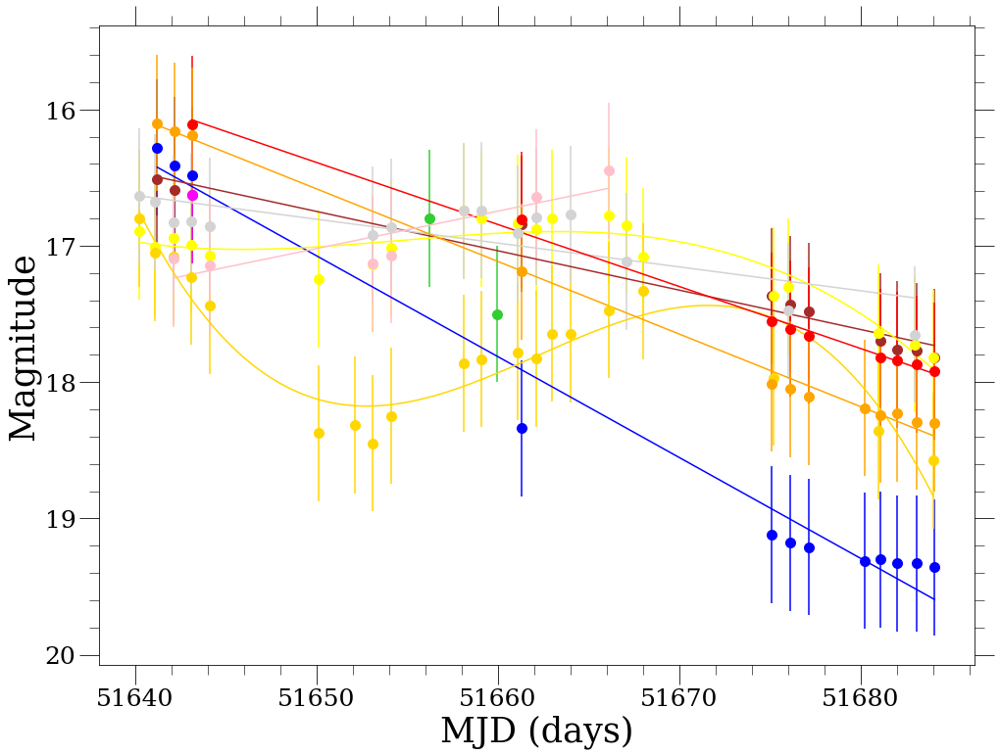

62 2000bh
C
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

B
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

I
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

H
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

J
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

R
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11



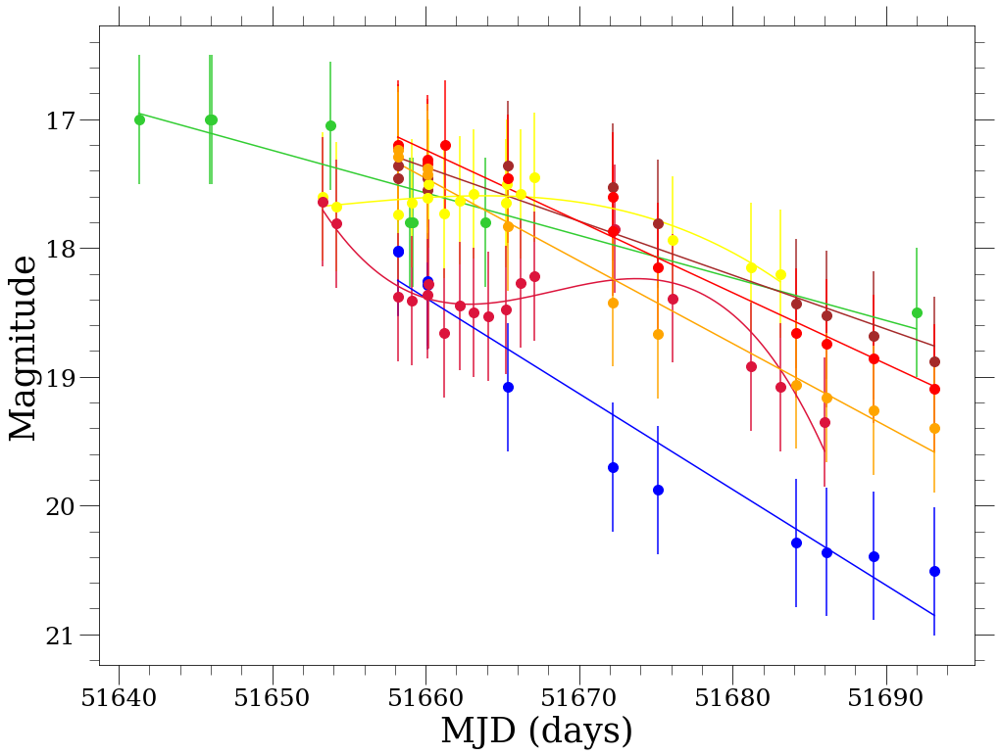

63 2000bk
C
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

B
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

I
{'None': 17}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

H
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

K
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

J
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

R
{'None': 24}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19



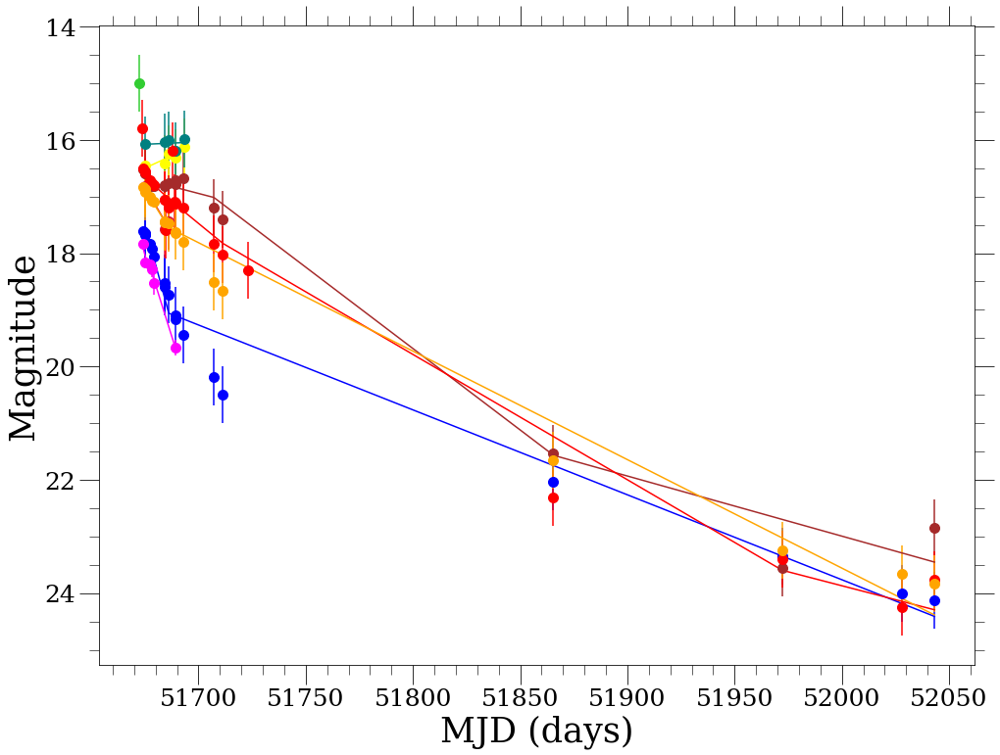

64 2000ce
C
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

B
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

I
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

R
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

U
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

V
{'None': 20}
{'None': 20}
{'None': 20}
{'None': 20}
None
20



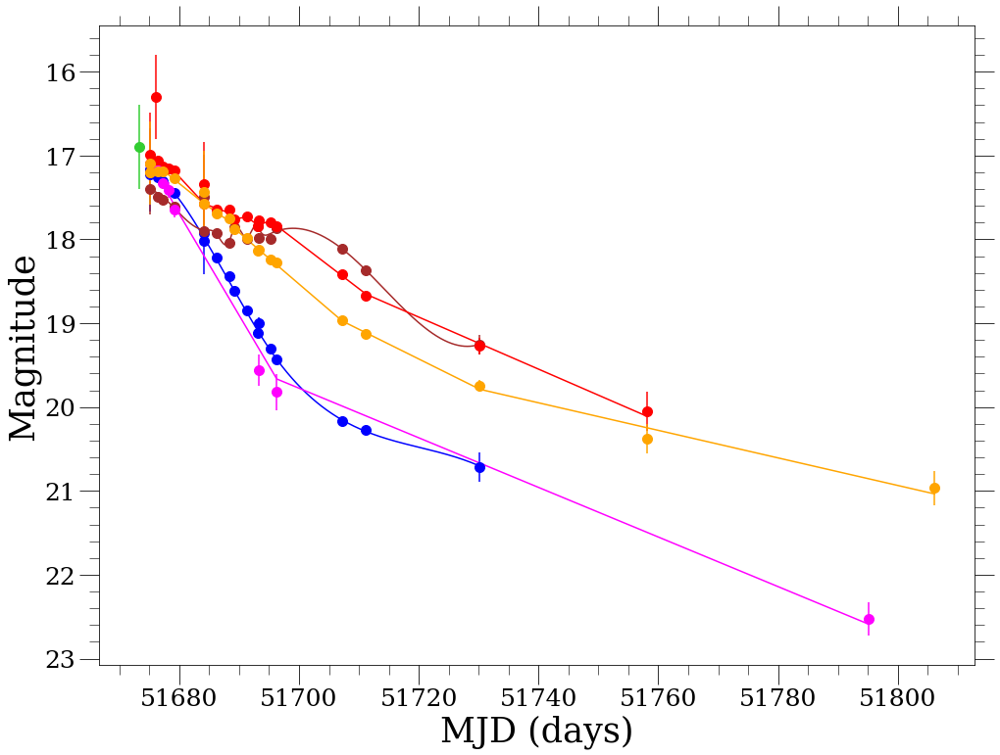

65 2000cf
I
{'None': 12, 'kait2': 26}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

B
{'None': 15, 'kait2': 26}
{'None': 41}
{'None': 41}
{'None': 41}
None
41

R
{'None': 16, 'kait2': 26}
{'None': 42}
{'None': 42}
{'None': 42}
None
42

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 19, 'kait2': 26}
{'None': 45}
{'None': 45}
{'None': 45}
None
45



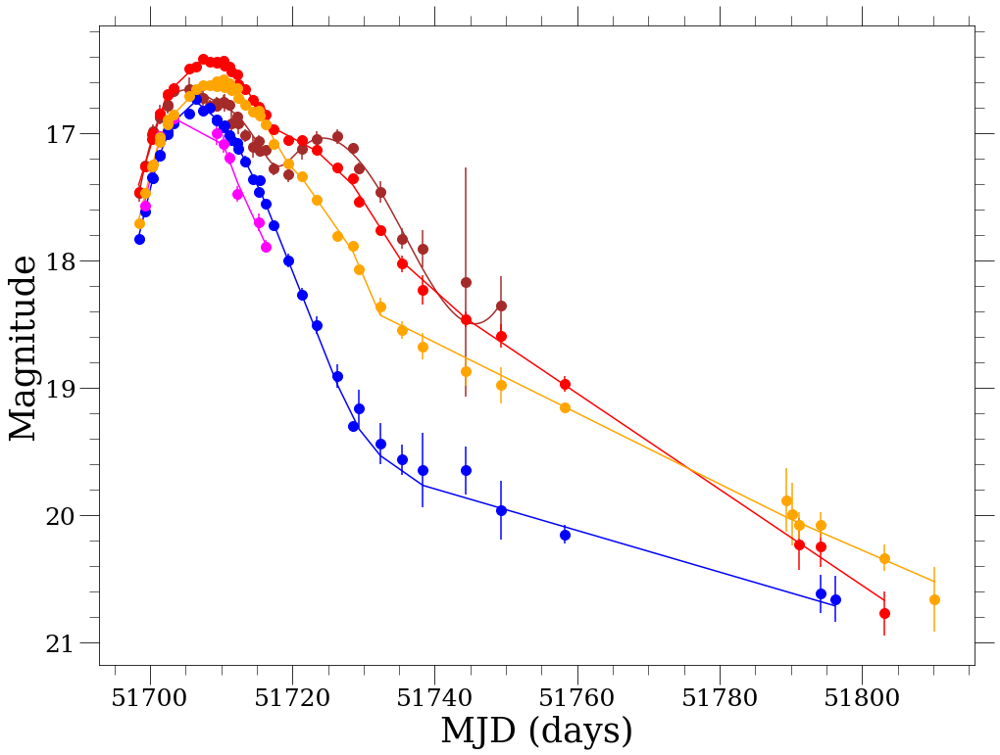

66 2000cn
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 13, 'kait2': 23}
{'None': 36}
{'None': 36}
{'None': 36}
None
36

I
{'None': 12, 'kait2': 19}
{'None': 31}
{'None': 31}
{'None': 31}
None
31

R
{'None': 13, 'kait2': 23}
{'None': 36}
{'None': 36}
{'None': 36}
None
36

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 13, 'kait2': 23}
{'None': 36}
{'None': 36}
{'None': 36}
None
36



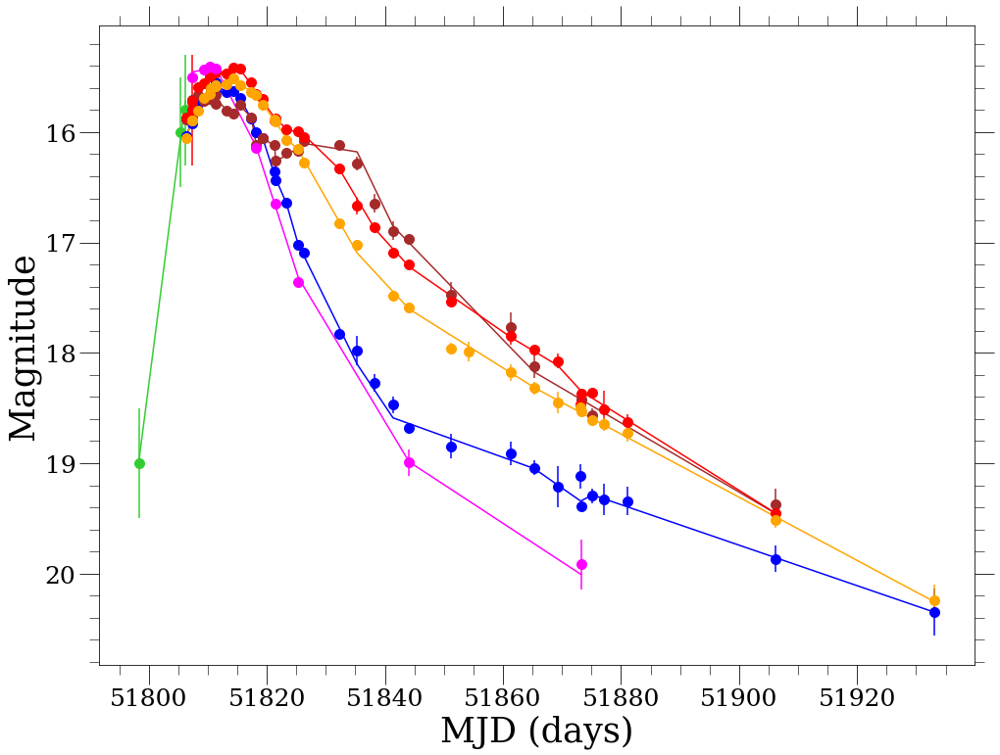

67 2000dk
C
{'None': 18}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

B
{'None': 33}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

I
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

H
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

K
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

J
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

R
{'None': 53}
{'None': 53}
{'None': 53}
{'None': 53}
None
53

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 33}
{'None': 33}
{'None': 33}
{'None': 33}
None
33



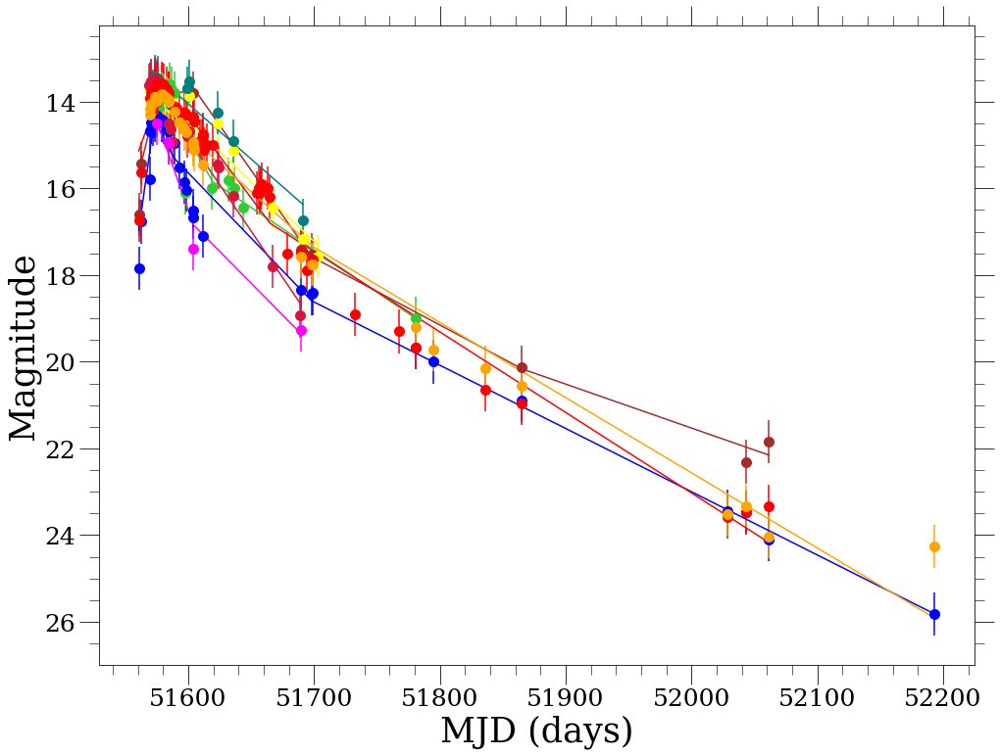

68 2000e
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 12, 'kait2': 25}
{'None': 37}
{'None': 37}
{'None': 37}
None
37

I
{'None': 11, 'kait2': 27}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

R
{'None': 12, 'kait2': 27}
{'None': 39}
{'None': 39}
{'None': 39}
None
39

U
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

V
{'None': 12, 'kait2': 28}
{'None': 40}
{'None': 40}
{'None': 40}
None
40



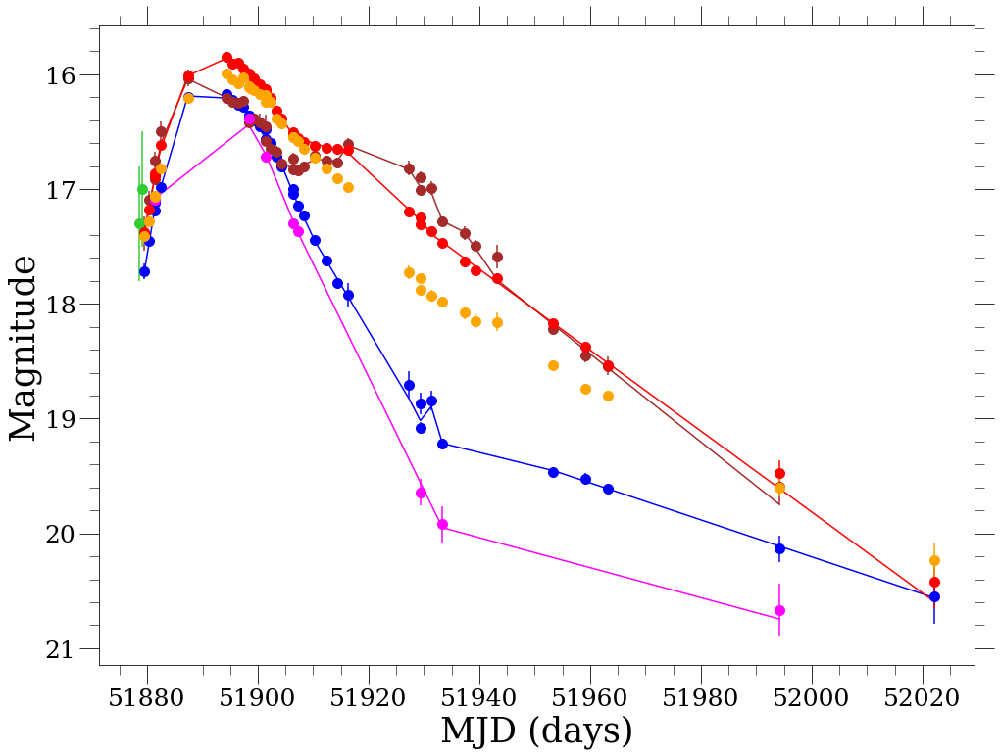

69 2000fa
I
{'None': 9, 'kait2': 10}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

B
{'None': 7, 'kait2': 8}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

R
{'None': 10, 'kait2': 18}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

C
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 7, 'kait2': 14}
{'None': 21}
{'None': 21}
{'None': 21}
None
21



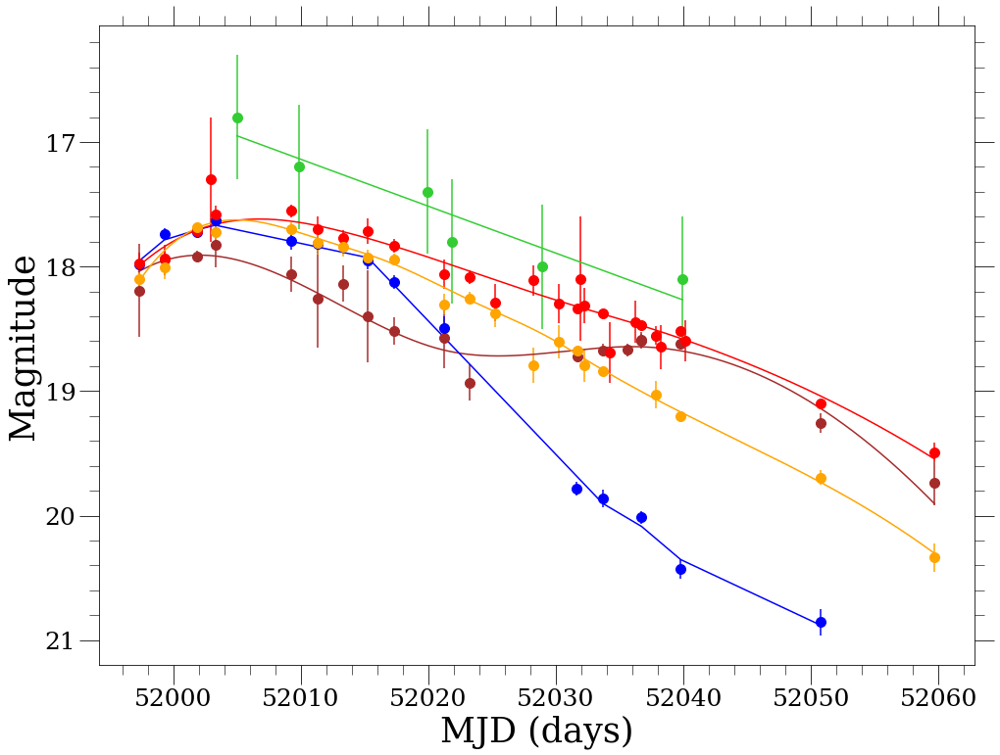

70 2001ah
C
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

B
{'None': 16, 'kait2': 20}
{'None': 36}
{'None': 36}
{'None': 36}
None
36

I
{'None': 19, 'kait2': 19}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

R
{'None': 45, 'kait2': 21}
{'None': 66}
{'None': 66}
{'None': 66}
None
66

U
{'None': 15}
{'None': 15}
{'None': 15}
{'None': 15}
None
15

V
{'None': 21, 'kait2': 21}
{'None': 42}
{'None': 42}
{'None': 42}
None
42



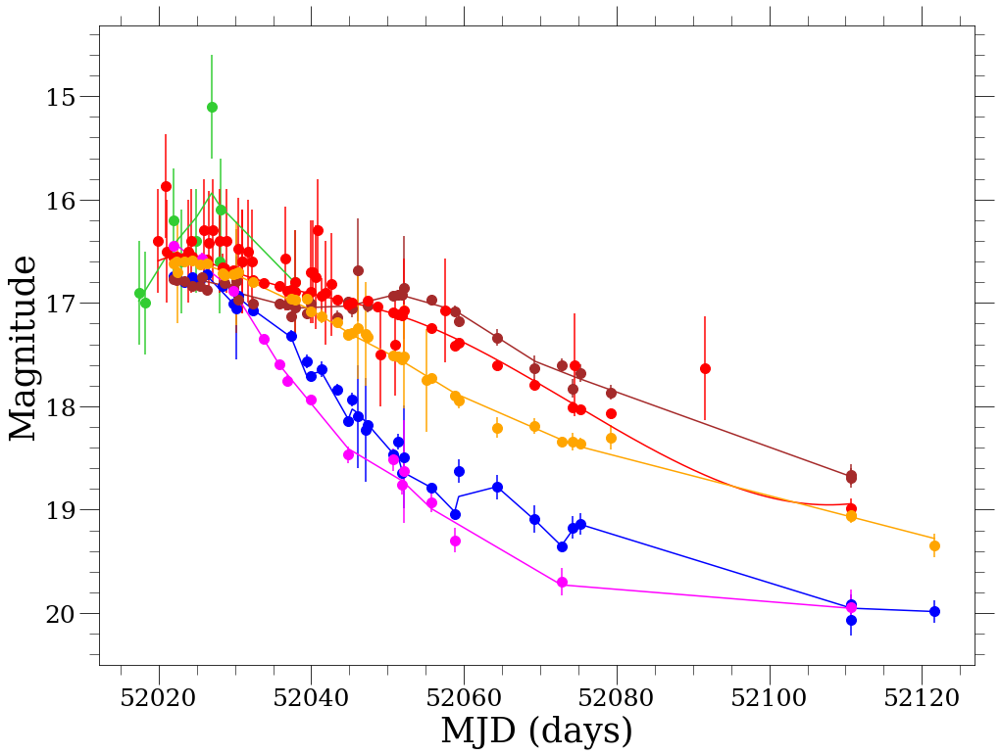

71 2001ay
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

U
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5



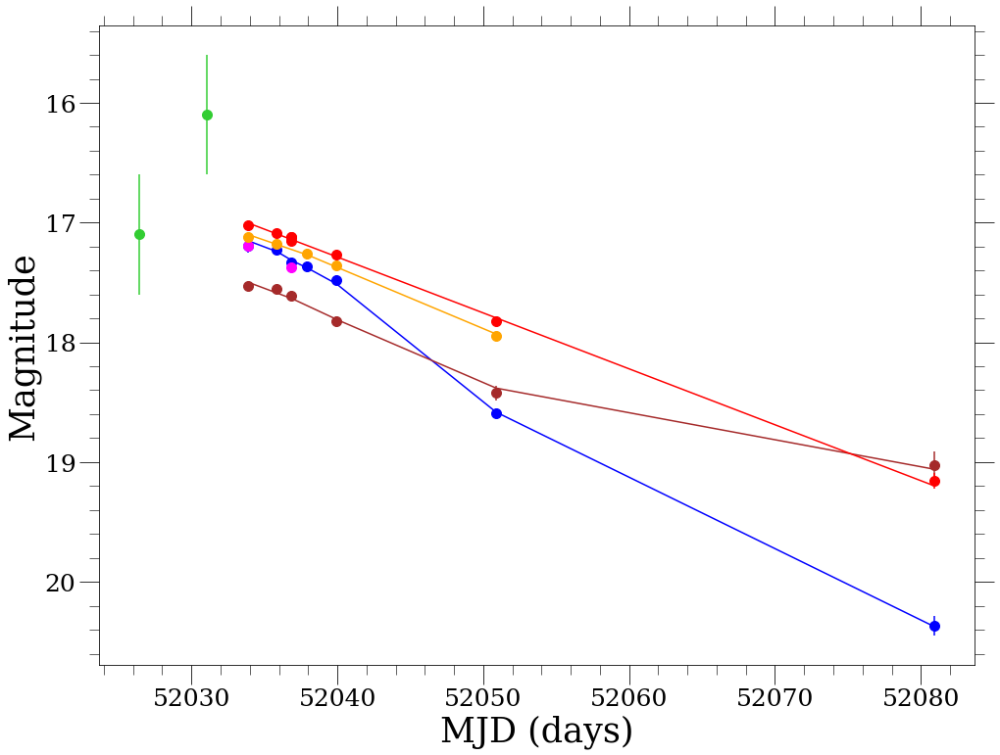

72 2001az
C
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

B
{'None': 12, 'kait2': 33}
{'None': 45}
{'None': 45}
{'None': 45}
None
45

I
{'None': 11, 'kait2': 33}
{'None': 44}
{'None': 44}
{'None': 44}
None
44

R
{'None': 46, 'kait2': 33}
{'None': 79}
{'None': 79}
{'None': 79}
None
79

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 14, 'kait2': 33}
{'None': 47}
{'None': 47}
{'None': 47}
None
47



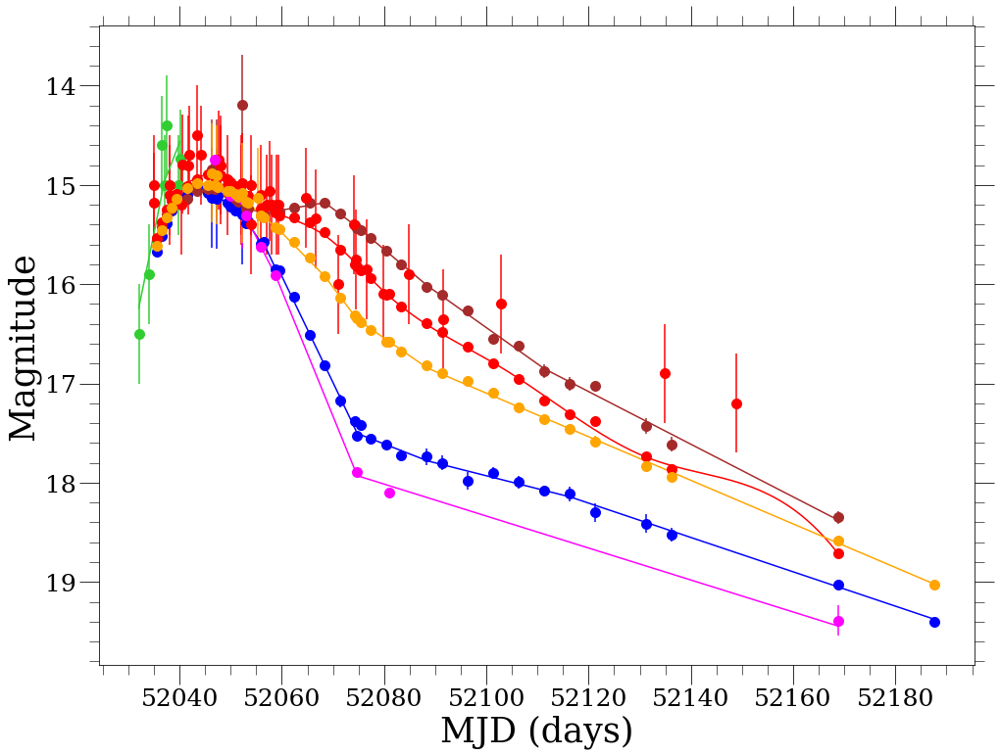

73 2001bf
C
{'None': 23}
{'None': 23}
{'None': 23}
{'None': 23}
None
23

B
{'None': 16, 'kait2': 2}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

I
{'None': 16, 'kait2': 2}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

R
{'None': 45, 'kait2': 2}
{'None': 47}
{'None': 47}
{'None': 47}
None
47

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 21, 'kait2': 2}
{'None': 23}
{'None': 23}
{'None': 23}
None
23



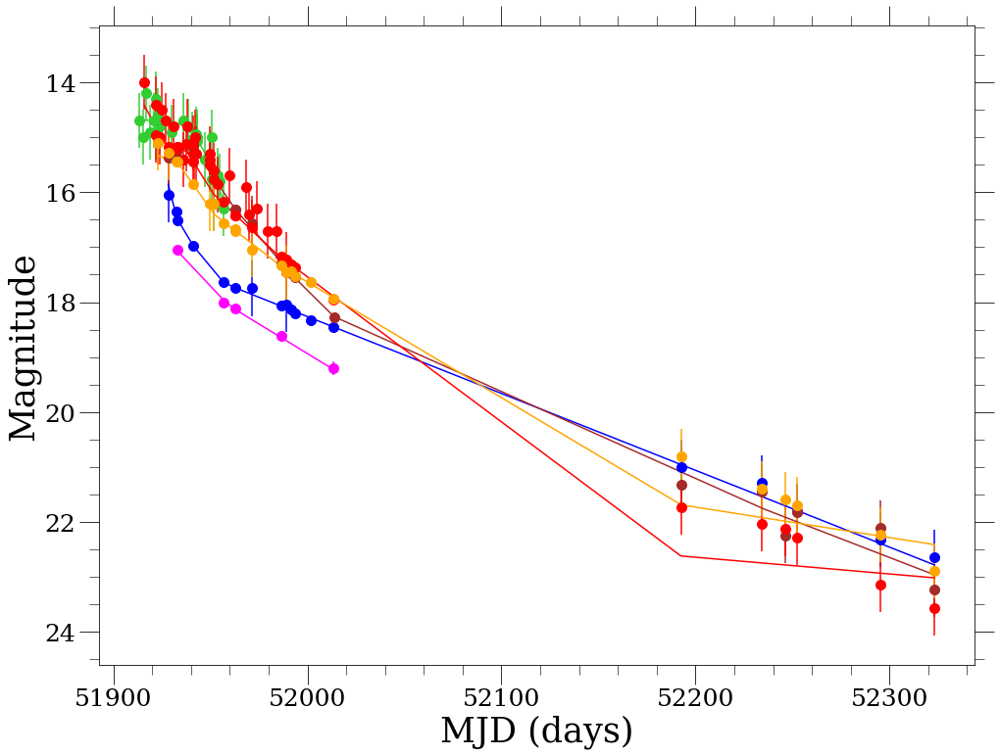

74 2001c
I
{'None': 2, 'kait2': 25}
{'None': 27}
{'None': 27}
{'None': 27}
None
27

C
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

R
{'None': 22, 'kait2': 26}
{'None': 48}
{'None': 48}
{'None': 48}
None
48

B
{'None': 1, 'kait2': 25}
{'None': 26}
{'None': 26}
{'None': 26}
None
26

V
{'None': 4, 'kait2': 26}
{'None': 30}
{'None': 30}
{'None': 30}
None
30



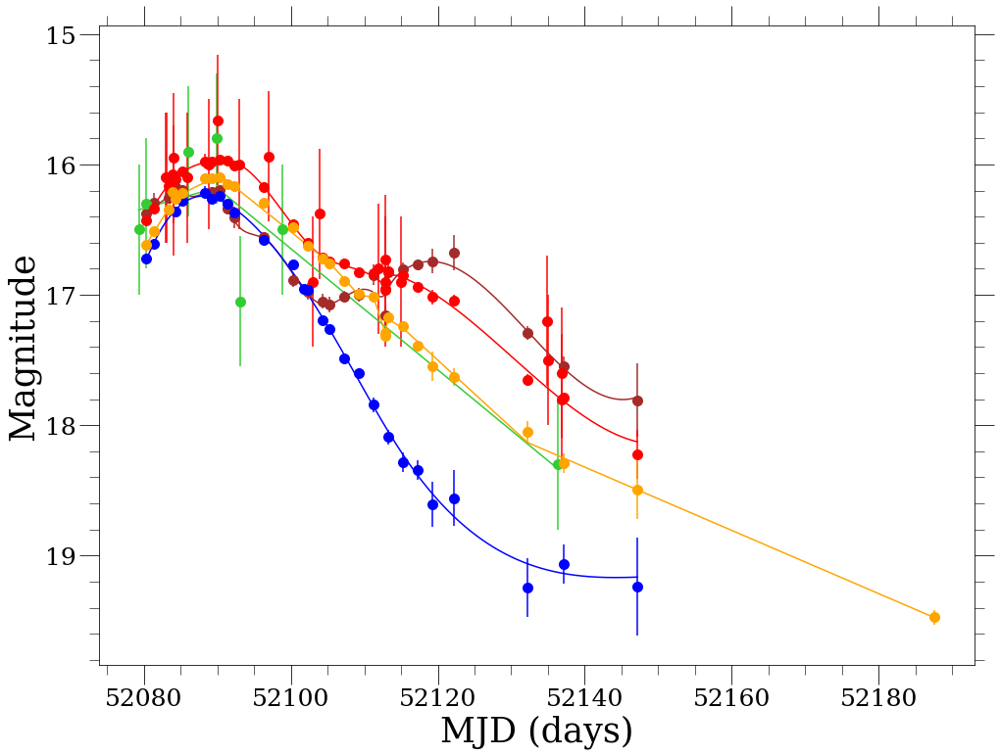

75 2001cp
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 5, 'kait3': 5, 'kait2': 24}
{'None': 34}
{'None': 34}
{'None': 34}
None
34

I
{'None': 5, 'kait3': 5, 'kait2': 23}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

R
{'None': 14, 'kait3': 5, 'kait2': 24}
{'None': 43}
{'None': 43}
{'None': 43}
None
43

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 7, 'kait3': 5, 'kait2': 24}
{'None': 36}
{'None': 36}
{'None': 36}
None
36



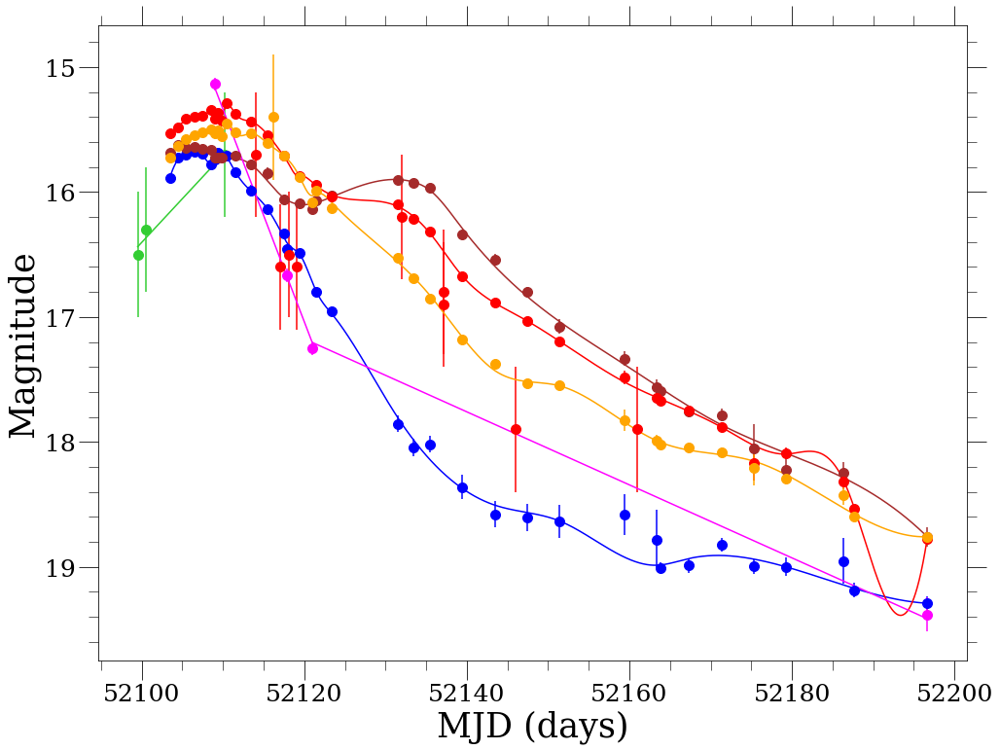

76 2001da
C
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

B
{'None': 20, 'kait3': 27, 'kait2': 1}
{'None': 48}
{'None': 48}
{'None': 48}
None
48

I
{'None': 18, 'kait3': 29}
{'None': 47}
{'None': 47}
{'None': 47}
None
47

R
{'None': 26, 'kait3': 30}
{'None': 56}
{'None': 56}
{'None': 56}
None
56

U
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 21, 'kait3': 29}
{'None': 50}
{'None': 50}
{'None': 50}
None
50



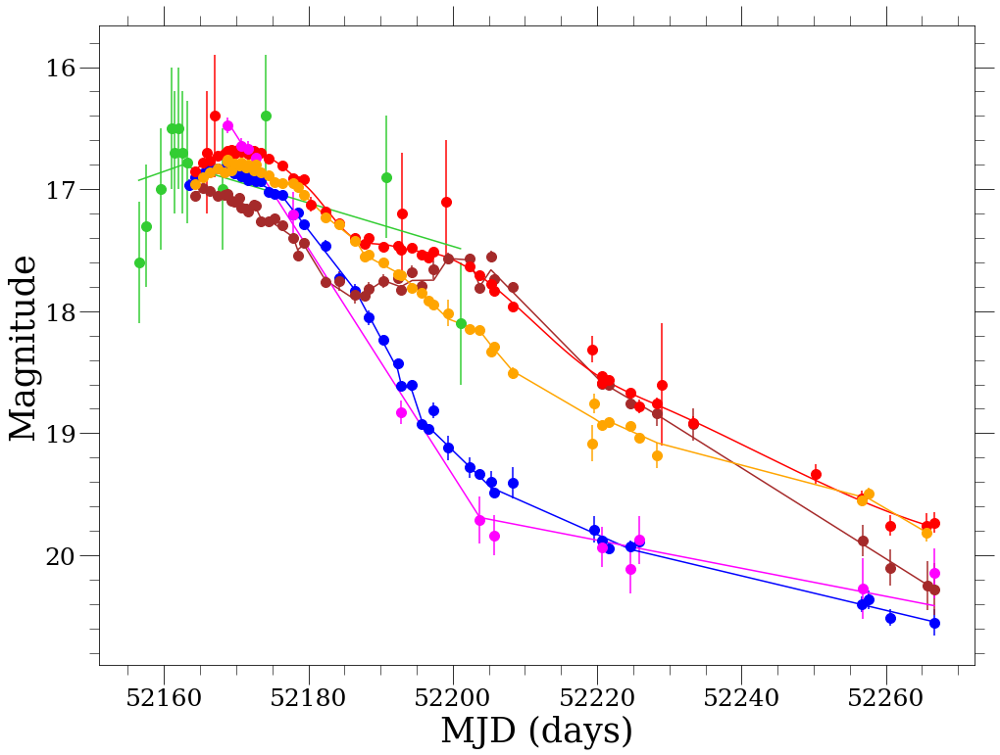

77 2001eh
C
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

B
{'None': 10, 'kait3': 27}
{'None': 37}
{'None': 37}
{'None': 37}
None
37

I
{'None': 12, 'kait3': 26}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

R
{'None': 18, 'kait3': 27}
{'None': 45}
{'None': 45}
{'None': 45}
None
45

U
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

V
{'None': 10, 'kait3': 27}
{'None': 37}
{'None': 37}
{'None': 37}
None
37



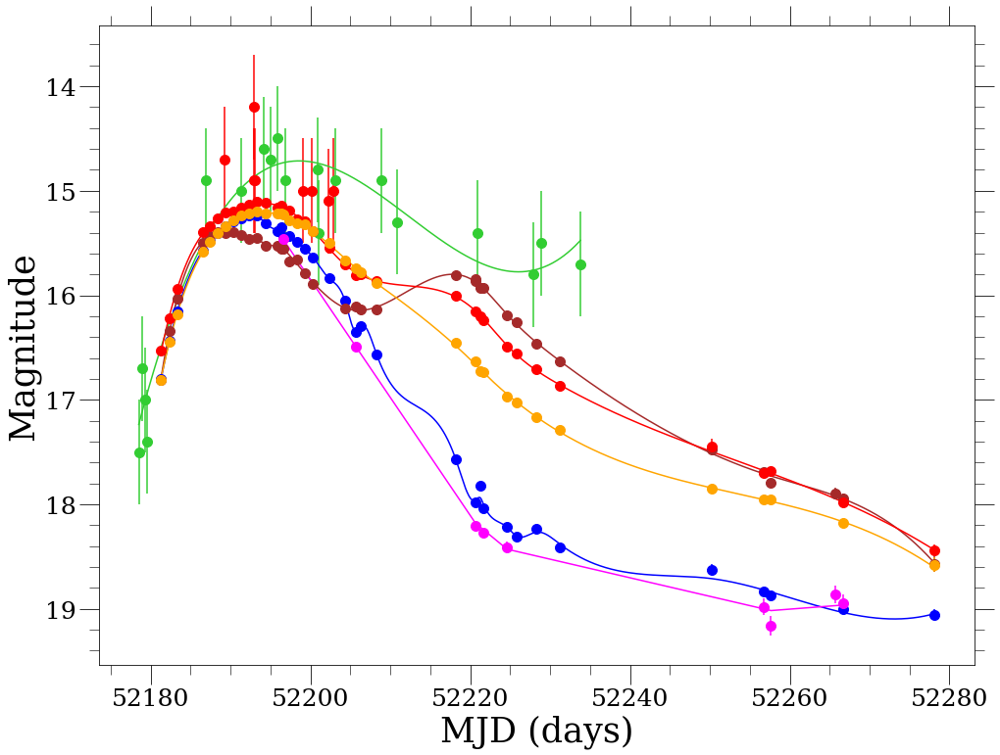

78 2001en
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 9, 'kait3': 32}
{'None': 41}
{'None': 41}
{'None': 41}
None
41

I
{'None': 16, 'kait3': 33}
{'None': 49}
{'None': 49}
{'None': 49}
None
49

R
{'None': 32, 'kait3': 33}
{'None': 65}
{'None': 65}
{'None': 65}
None
65

U
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

V
{'None': 16, 'kait3': 35}
{'None': 51}
{'None': 51}
{'None': 51}
None
51



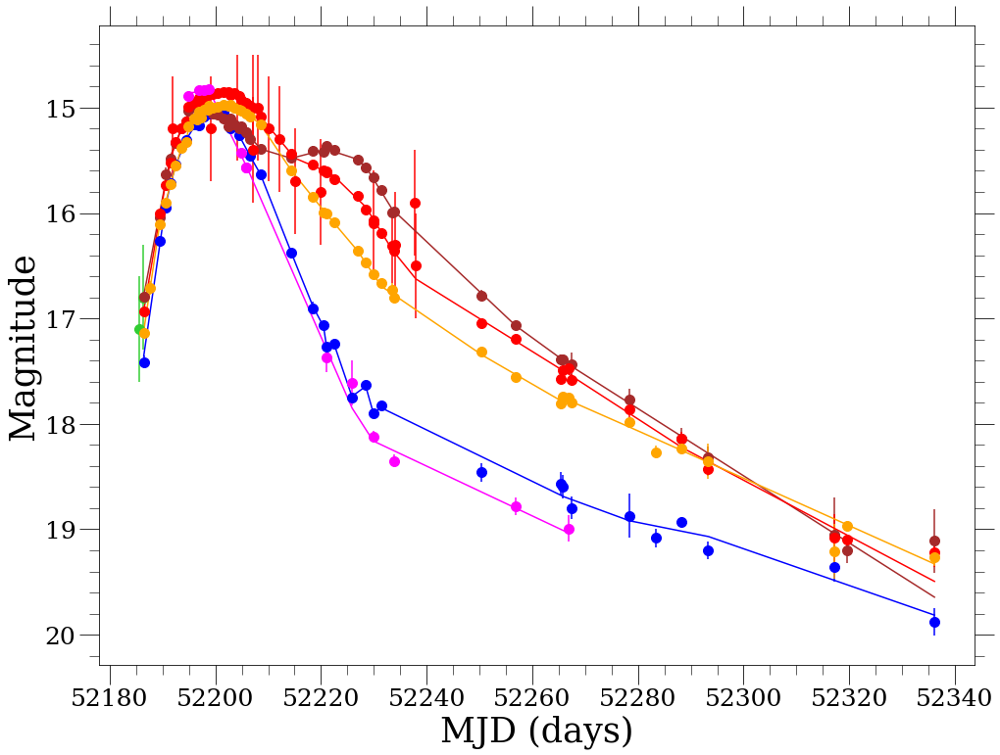

79 2001ep
C
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

B
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 27}
{'None': 27}
{'None': 27}
{'None': 27}
None
27

U
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

V
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12



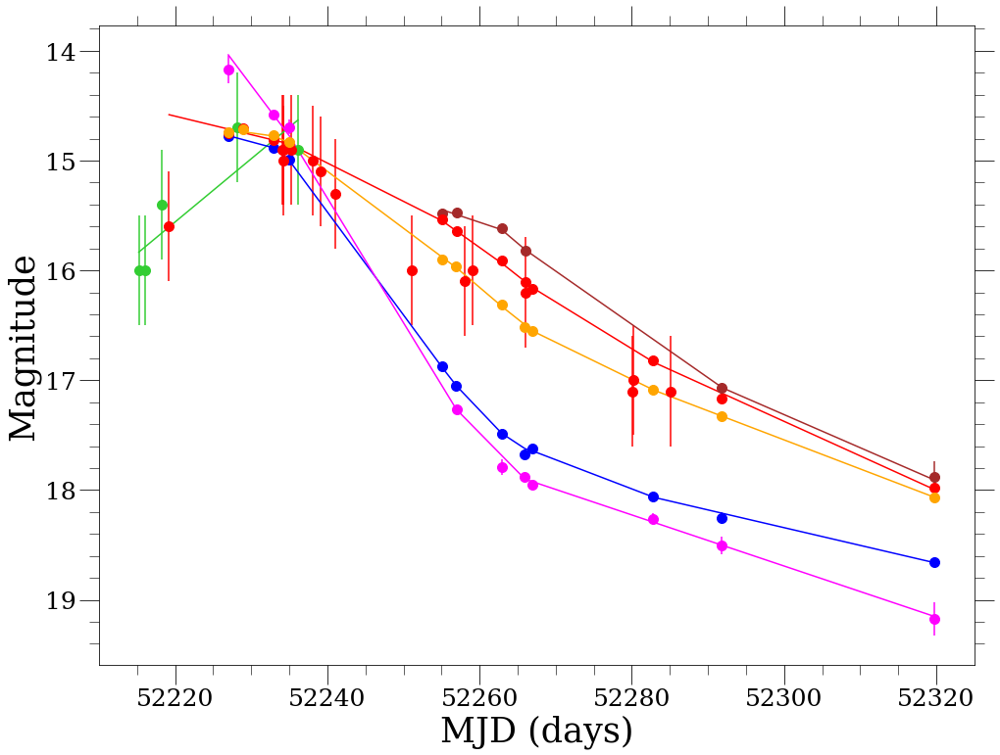

80 2001fe
C
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

B
{'None': 10, 'kait3': 10}
{'None': 20}
{'None': 20}
{'None': 20}
None
20

I
{'None': 10, 'kait3': 10}
{'None': 20}
{'None': 20}
{'None': 20}
None
20

R
{'None': 10, 'kait3': 11}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

U
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

V
{'None': 11, 'kait3': 11}
{'None': 22}
{'None': 22}
{'None': 22}
None
22



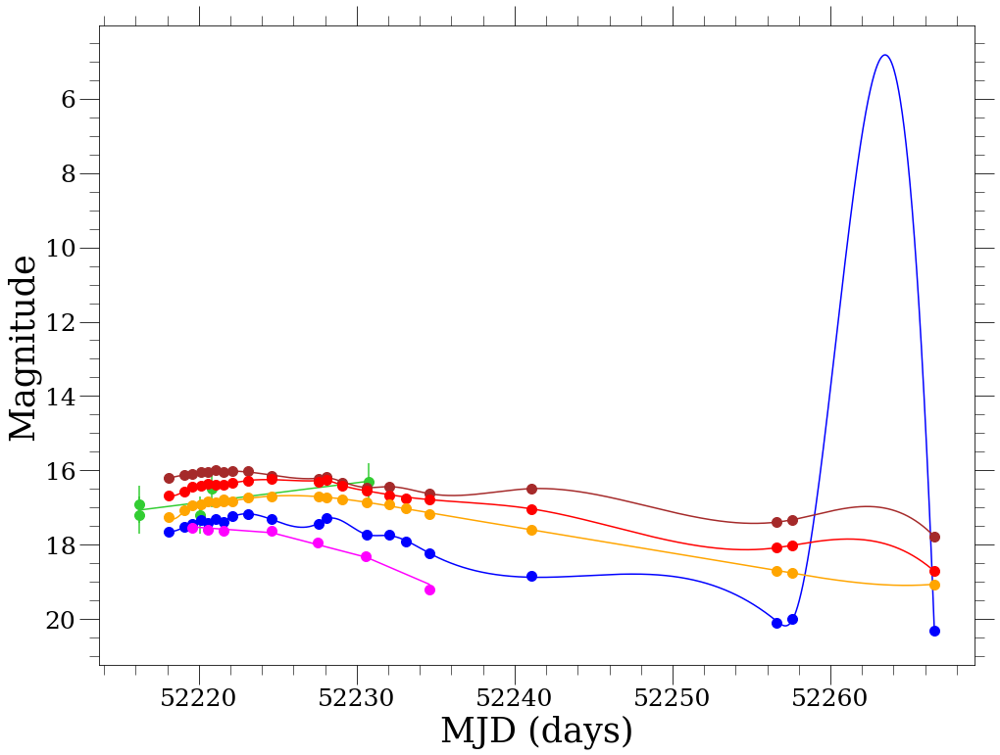

81 2001fh
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 11}
{'None': 11}
{'None': 11}
{'None': 11}
None
11

I
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

R
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 16}
{'None': 16}
{'None': 16}
{'None': 16}
None
16



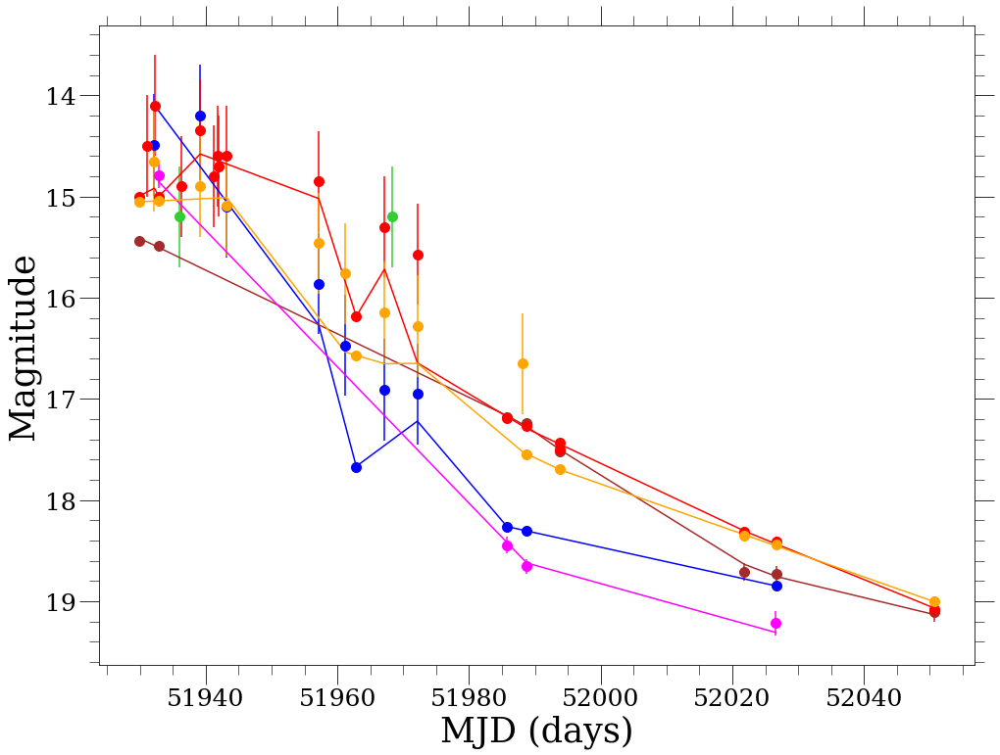

82 2001g
I
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

R
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

B
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

V
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4



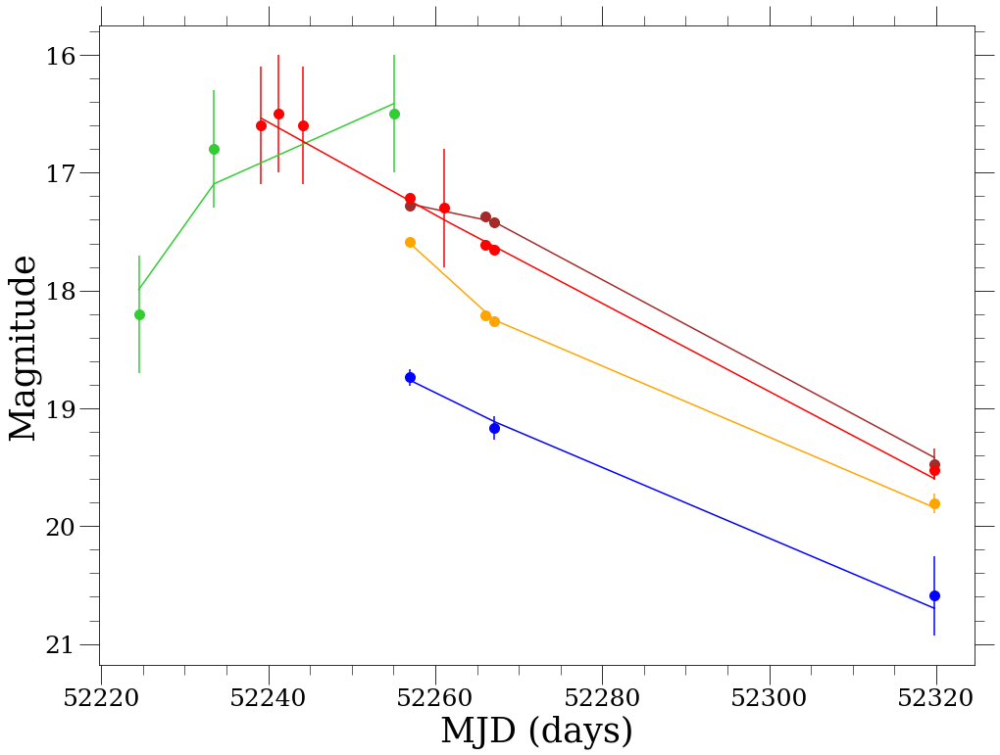

83 2001gb
C
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 10}
{'None': 10}
{'None': 10}
{'None': 10}
None
10

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6



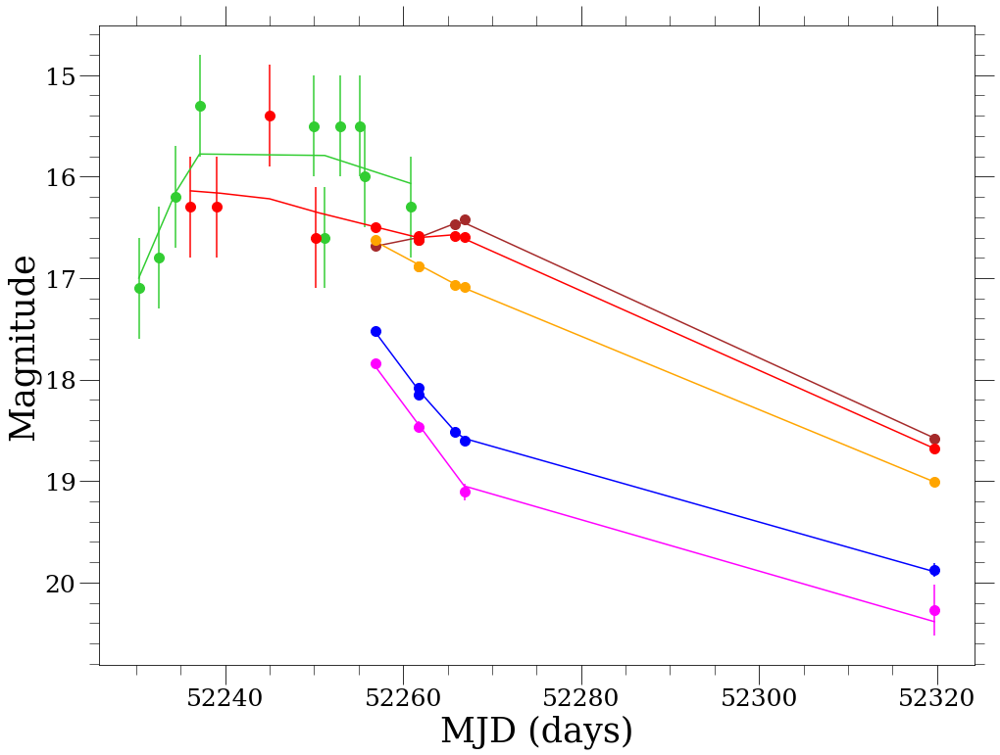

84 2001gc
I
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

R
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

V
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3



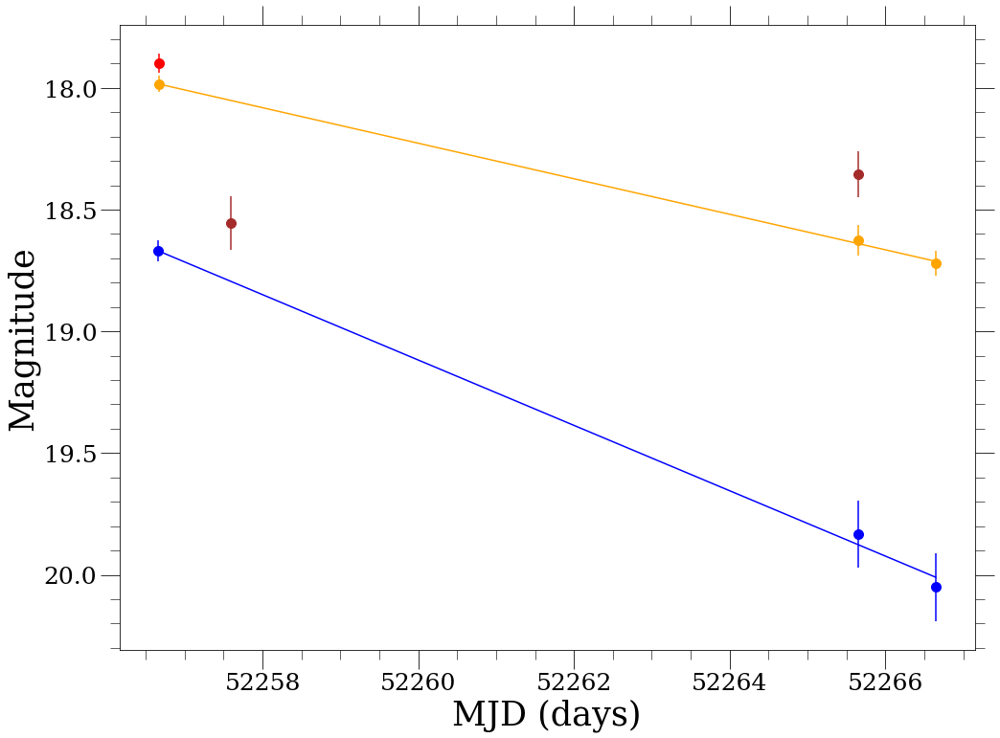

85 2001ic
C
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

I
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

R
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7



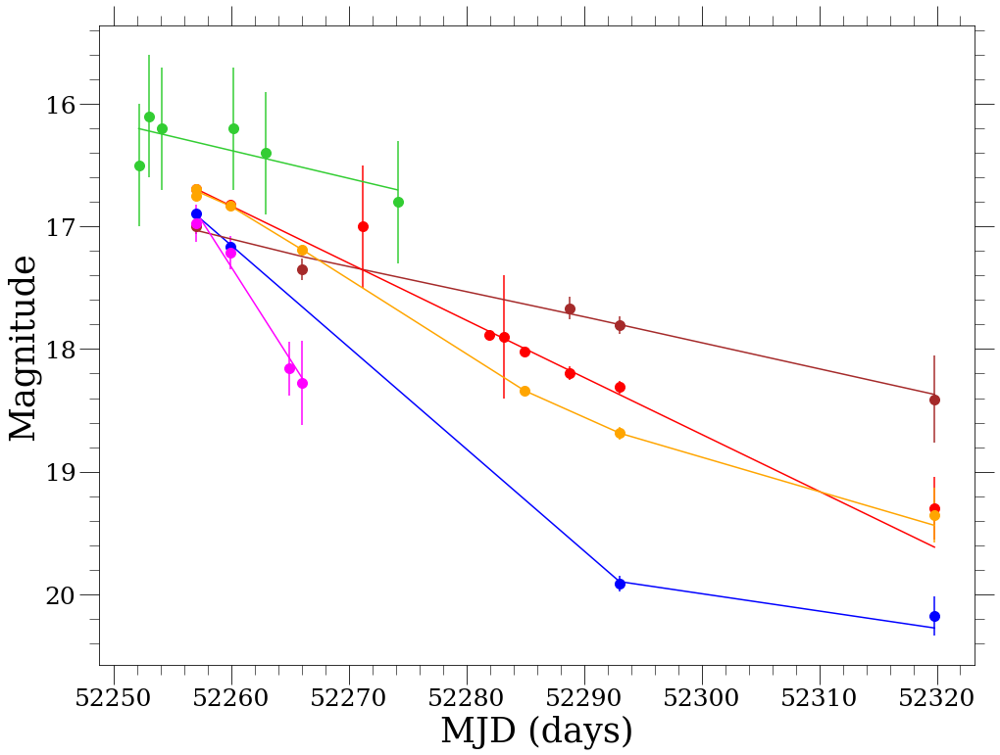

86 2001ie
I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

R
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4



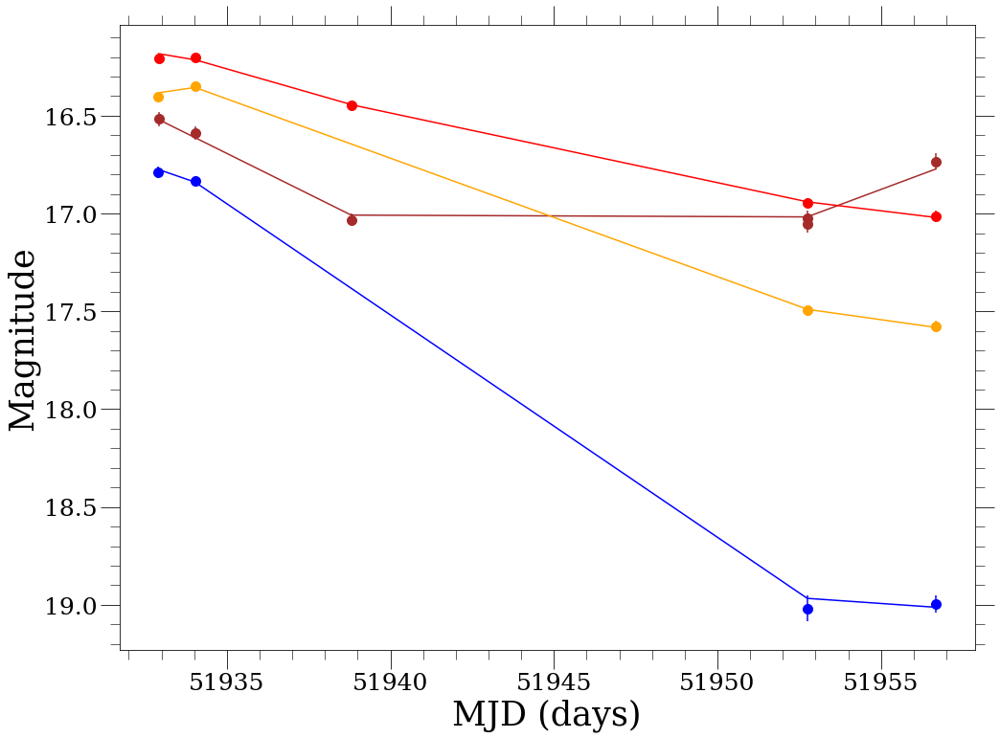

87 2001n
C
{'None': 47}
{'None': 47}
{'None': 47}
{'None': 47}
None
47

B
{'None': 66, 'kait2': 16}
{'None': 82}
{'None': 82}
{'None': 82}
None
82

I
{'None': 64, 'kait2': 16}
{'None': 80}
{'None': 80}
{'None': 80}
None
80

R
{'None': 176, 'kait2': 17}
{'None': 193}
{'None': 193}
{'None': 193}
None
193

U
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

V
{'None': 87, 'kait2': 16}
{'None': 103}
{'None': 103}
{'None': 103}
None
103



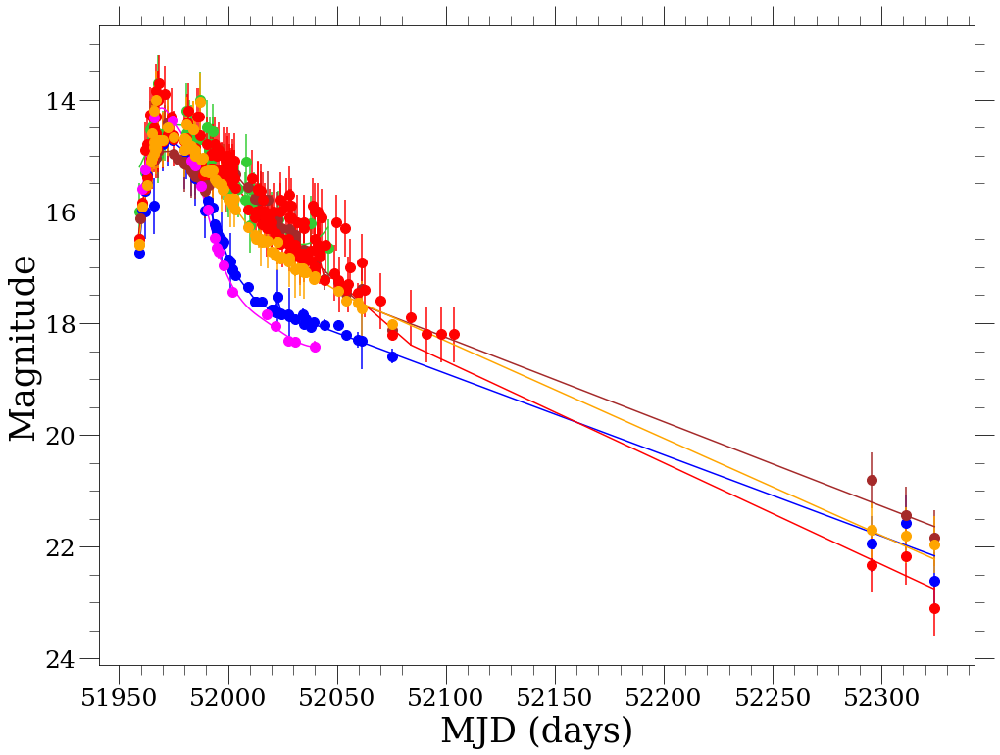

88 2001v
I
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

R
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3



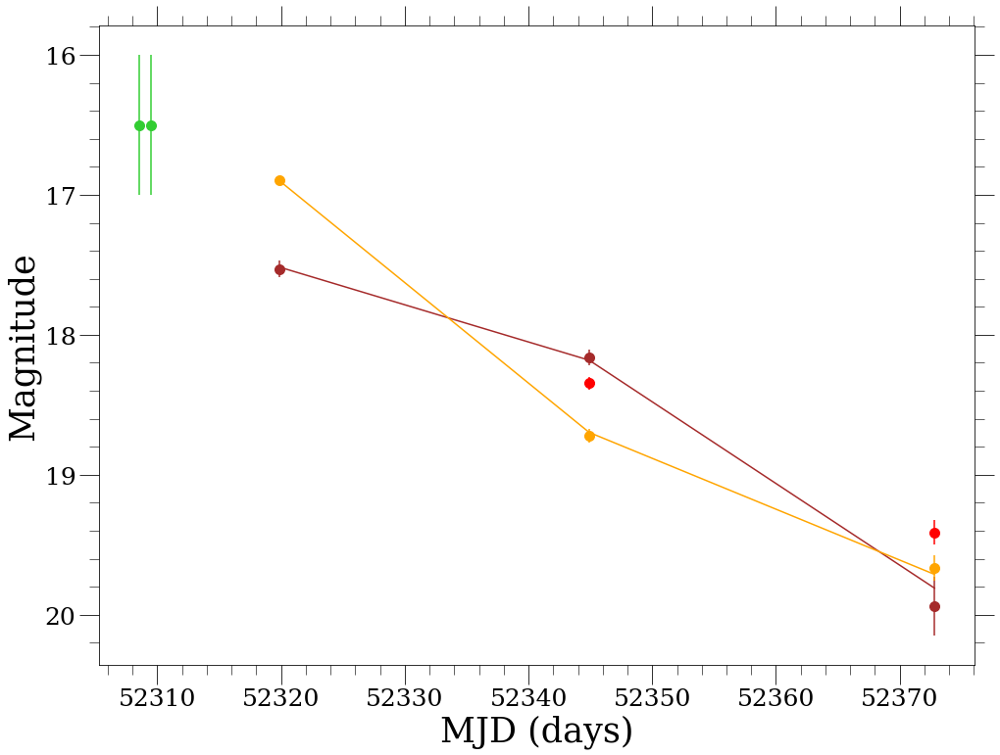

89 2002ar
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 1, 'kait3': 13, 'nickel': 2}
{'None': 16}
{'None': 16}
{'None': 16}
None
16

I
{'None': 6, 'kait3': 12, 'nickel': 1}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

R
{'None': 4, 'kait3': 13, 'nickel': 1}
{'None': 18}
{'None': 18}
{'None': 18}
None
18

U
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

V
{'None': 2, 'kait3': 12, 'nickel': 1}
{'None': 15}
{'None': 15}
{'None': 15}
None
15



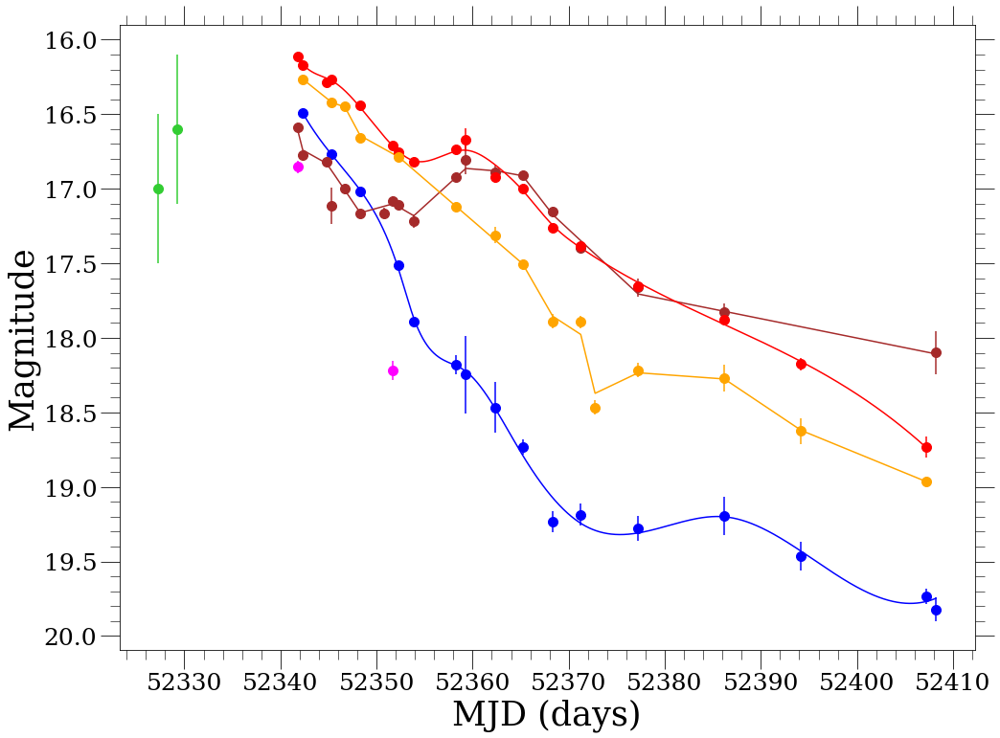

90 2002bf
C
{'None': 62}
{'None': 62}
{'None': 62}
{'None': 62}
None
62

B
{'None': 105, 'kait3': 33}
{'None': 138}
{'None': 138}
{'None': 138}
None
138

I
{'None': 113, 'kait3': 31}
{'None': 144}
{'None': 144}
{'None': 144}
None
144

H
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

K
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

J
{'None': 14}
{'None': 14}
{'None': 14}
{'None': 14}
None
14

R
{'None': 145, 'kait3': 34}
{'None': 179}
{'None': 179}
{'None': 179}
None
179

U
{'None': 28}
{'None': 28}
{'None': 28}
{'None': 28}
None
28

V
{'None': 124, 'kait3': 33}
{'None': 157}
{'None': 157}
{'None': 157}
None
157



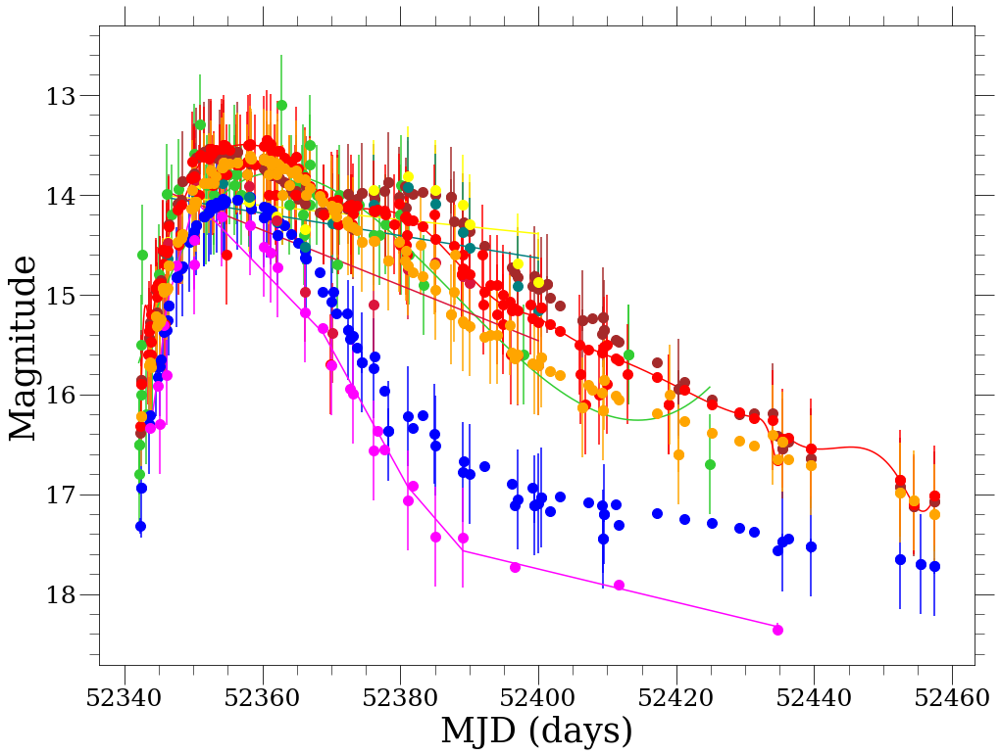

91 2002bo
C
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

B
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

I
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

R
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

U
{'None': 1}
{'None': 1}
{'None': 1}
{'None': 1}
None
1

V
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4



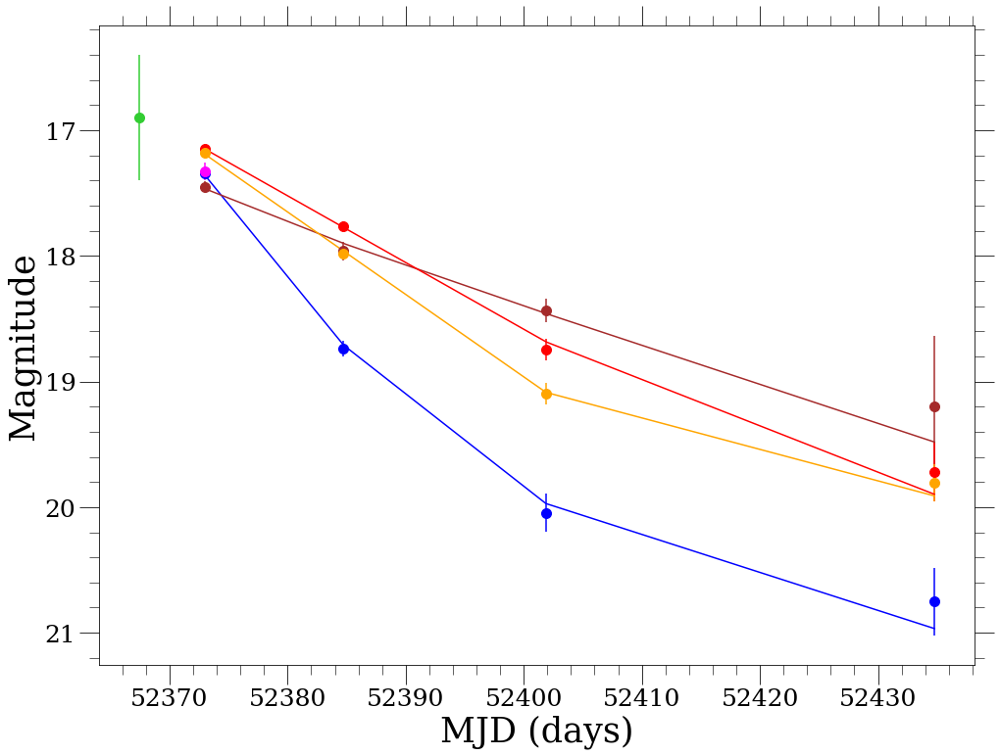

92 2002bz
C
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 7, 'kait3': 21, 'nickel': 5}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

I
{'None': 7, 'kait3': 21, 'nickel': 5}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

R
{'None': 9, 'kait3': 22, 'nickel': 5}
{'None': 36}
{'None': 36}
{'None': 36}
None
36

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 7, 'kait3': 21, 'nickel': 5}
{'None': 33}
{'None': 33}
{'None': 33}
None
33



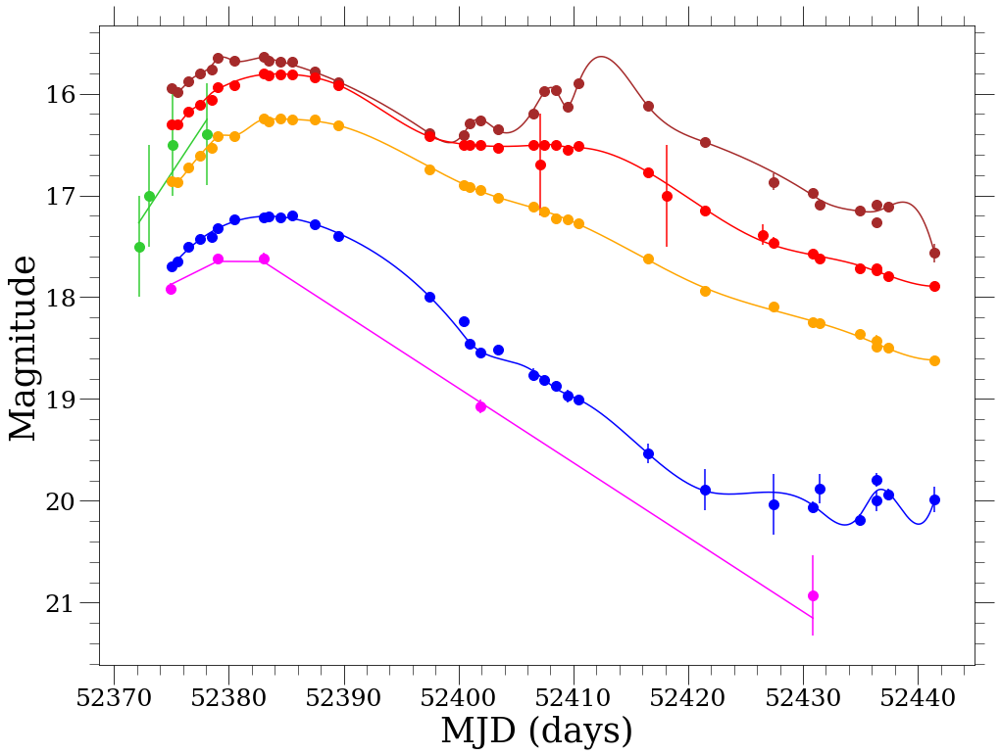

93 2002cd
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

I
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

R
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9

U
{'None': 5}
{'None': 5}
{'None': 5}
{'None': 5}
None
5

V
{'None': 9}
{'None': 9}
{'None': 9}
{'None': 9}
None
9



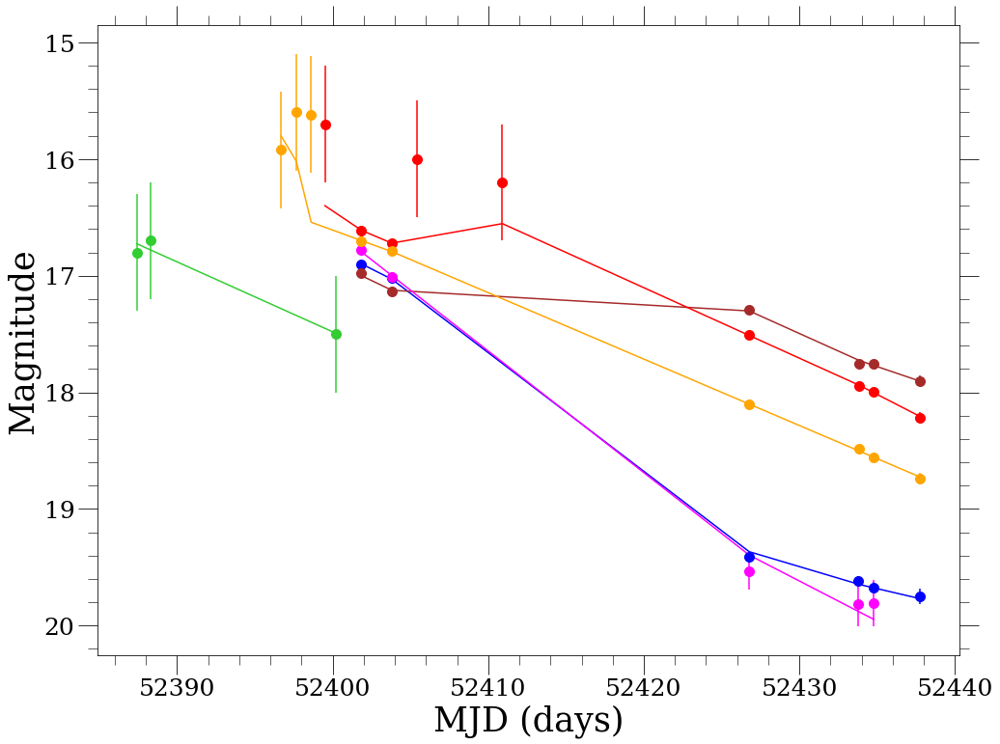

94 2002ck
C
{'None': 13}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

B
{'None': 10, 'kait3': 26, 'nickel': 6}
{'None': 42}
{'None': 42}
{'None': 42}
None
42

I
{'None': 9, 'kait3': 26, 'nickel': 6}
{'None': 41}
{'None': 41}
{'None': 41}
None
41

R
{'None': 85, 'kait3': 25, 'nickel': 6}
{'None': 116}
{'None': 116}
{'None': 116}
None
116

U
{'None': 8}
{'None': 8}
{'None': 8}
{'None': 8}
None
8

V
{'None': 13, 'kait3': 26, 'nickel': 6}
{'None': 45}
{'None': 45}
{'None': 45}
None
45



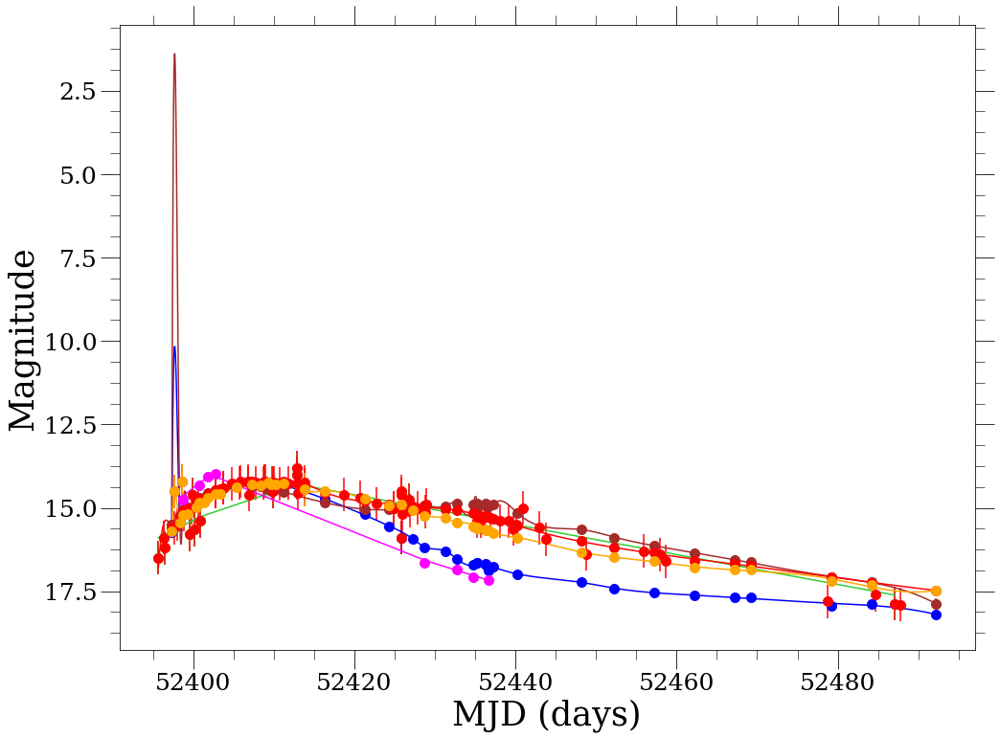

95 2002cr
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 5, 'kait3': 24, 'nickel': 3}
{'None': 32}
{'None': 32}
{'None': 32}
None
32

I
{'None': 6, 'kait3': 24, 'nickel': 3}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

R
{'None': 6, 'kait3': 24, 'nickel': 3}
{'None': 33}
{'None': 33}
{'None': 33}
None
33

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 6, 'kait3': 24, 'nickel': 3}
{'None': 33}
{'None': 33}
{'None': 33}
None
33



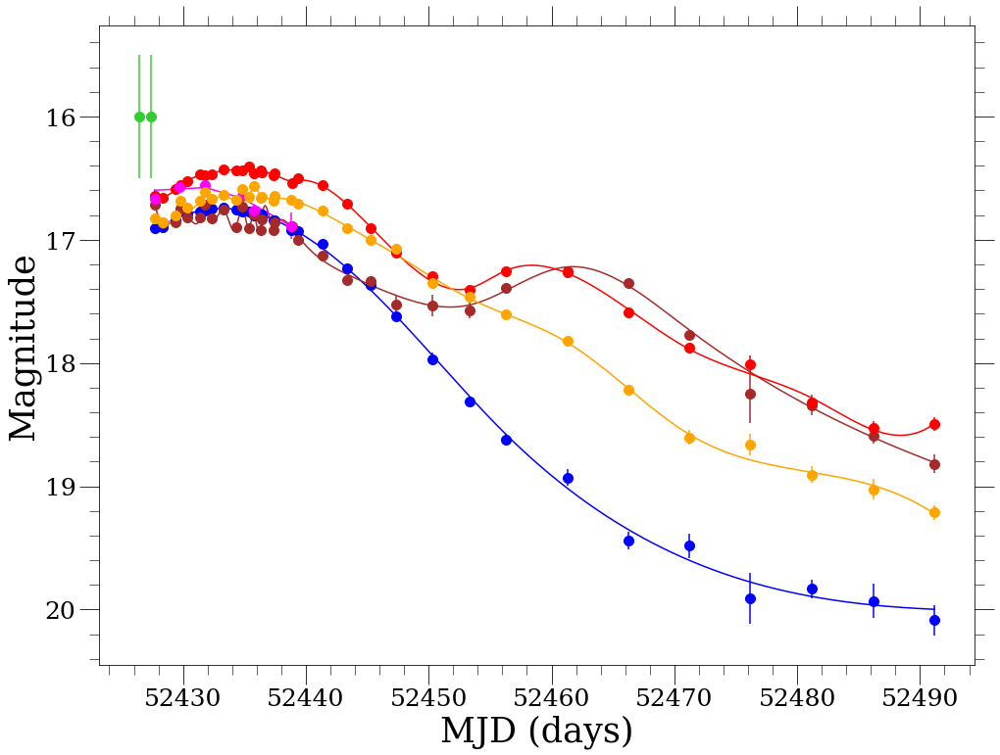

96 2002de
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 12, 'kait3': 14}
{'None': 26}
{'None': 26}
{'None': 26}
None
26

I
{'None': 12, 'kait3': 13}
{'None': 25}
{'None': 25}
{'None': 25}
None
25

H
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

K
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

J
{'None': 21}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

R
{'None': 11, 'kait3': 13}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 10, 'kait3': 14}
{'None': 24}
{'None': 24}
{'None': 24}
None
24



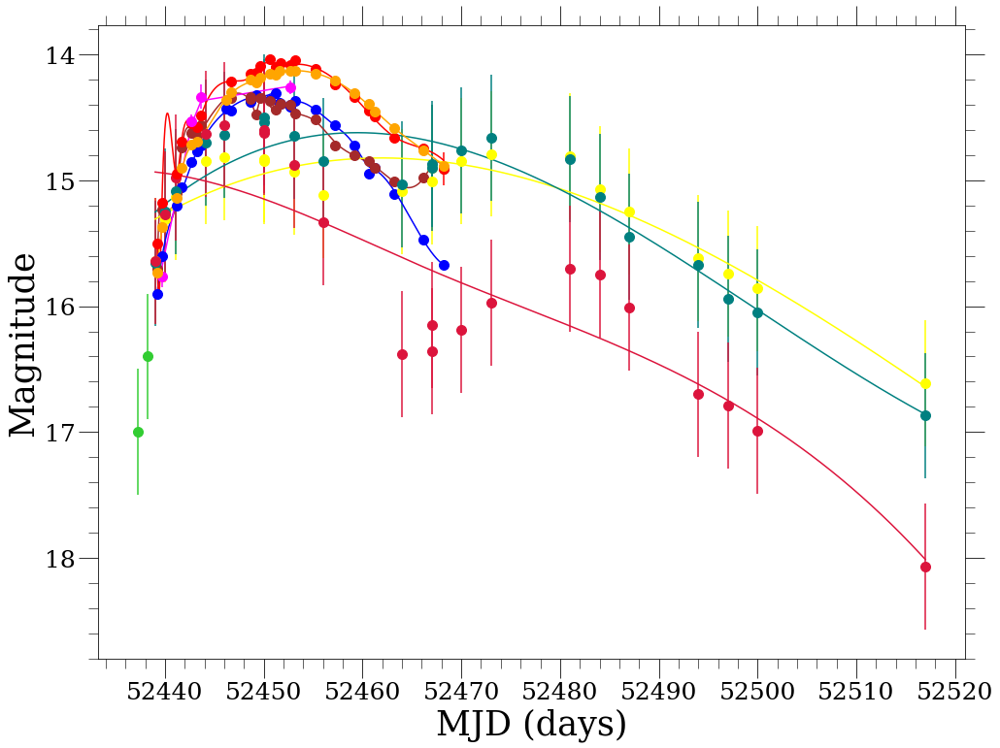

97 2002dj
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 6, 'kait3': 14, 'nickel': 1}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

I
{'None': 9, 'kait3': 14, 'nickel': 1}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

R
{'None': 8, 'kait3': 15, 'nickel': 1}
{'None': 24}
{'None': 24}
{'None': 24}
None
24

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 6, 'kait3': 15, 'nickel': 1}
{'None': 22}
{'None': 22}
{'None': 22}
None
22



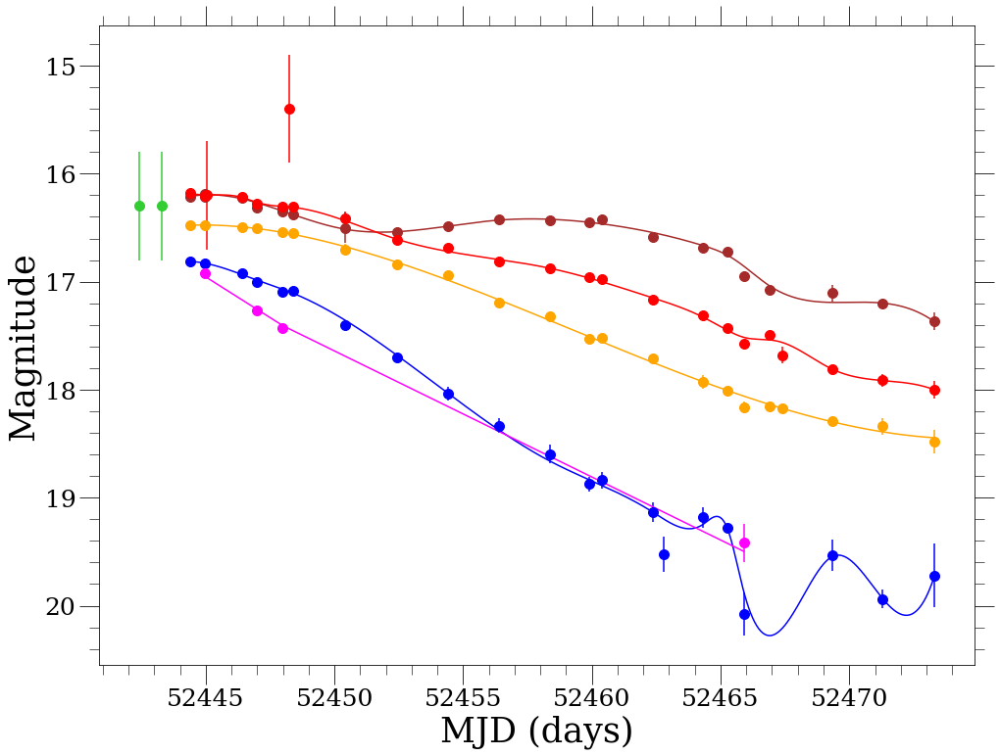

98 2002do
C
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

B
{'None': 10, 'kait3': 31, 'nickel': 3}
{'None': 44}
{'None': 44}
{'None': 44}
None
44

I
{'None': 13, 'kait3': 30, 'nickel': 3}
{'None': 46}
{'None': 46}
{'None': 46}
None
46

R
{'None': 55, 'kait3': 31, 'nickel': 3}
{'None': 89}
{'None': 89}
{'None': 89}
None
89

U
{'None': 7}
{'None': 7}
{'None': 7}
{'None': 7}
None
7

V
{'None': 14, 'kait3': 31, 'nickel': 3}
{'None': 48}
{'None': 48}
{'None': 48}
None
48



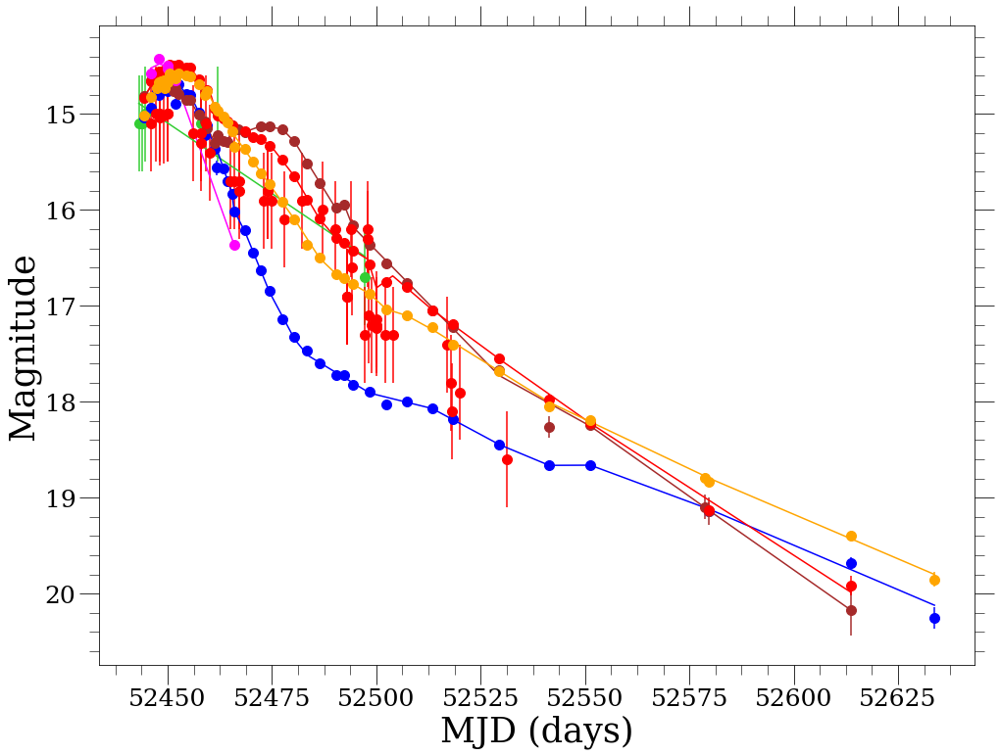

99 2002dp
C
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 40, 'kait3': 31, 'nickel': 6}
{'None': 77}
{'None': 77}
{'None': 77}
None
77

I
{'None': 44, 'kait3': 31, 'nickel': 6}
{'None': 81}
{'None': 81}
{'None': 81}
None
81

R
{'None': 58, 'kait3': 31, 'nickel': 6}
{'None': 95}
{'None': 95}
{'None': 95}
None
95

U
{'None': 19}
{'None': 19}
{'None': 19}
{'None': 19}
None
19

V
{'None': 45, 'kait3': 30, 'nickel': 6}
{'None': 81}
{'None': 81}
{'None': 81}
None
81



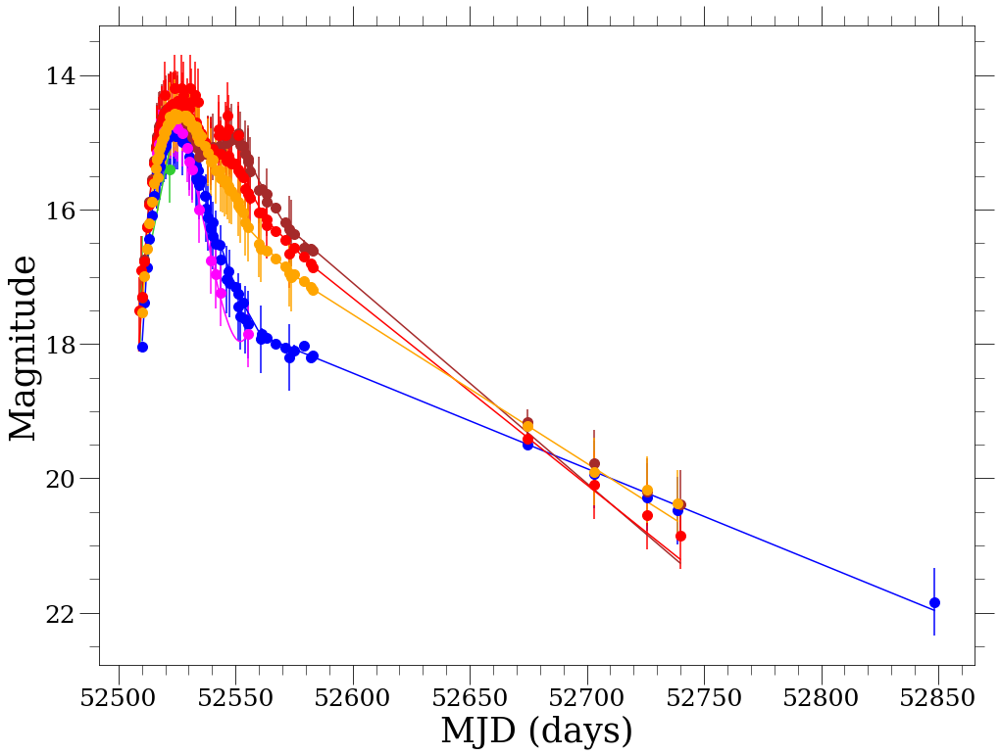

100 2002er
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 38}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

I
{'None': 41}
{'None': 41}
{'None': 41}
{'None': 41}
None
41

R
{'None': 50}
{'None': 50}
{'None': 50}
{'None': 50}
None
50

U
{'None': 6}
{'None': 6}
{'None': 6}
{'None': 6}
None
6

V
{'None': 42}
{'None': 42}
{'None': 42}
{'None': 42}
None
42



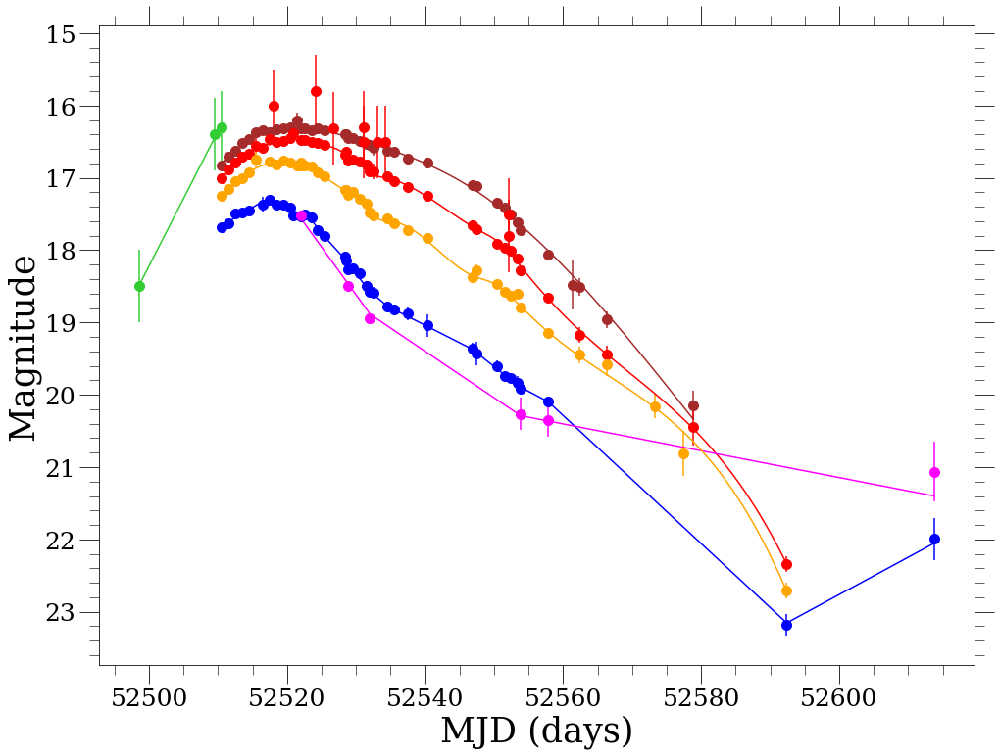

101 2002es
C
{'None': 2}
{'None': 2}
{'None': 2}
{'None': 2}
None
2

B
{'None': 3, 'kait3': 6, 'nickel': 4}
{'None': 13}
{'None': 13}
{'None': 13}
None
13

I
{'None': 2, 'kait3': 11, 'nickel': 4}
{'None': 17}
{'None': 17}
{'None': 17}
None
17

R
{'None': 4, 'kait3': 13, 'nickel': 4}
{'None': 21}
{'None': 21}
{'None': 21}
None
21

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 3, 'kait3': 12, 'nickel': 4}
{'None': 19}
{'None': 19}
{'None': 19}
None
19



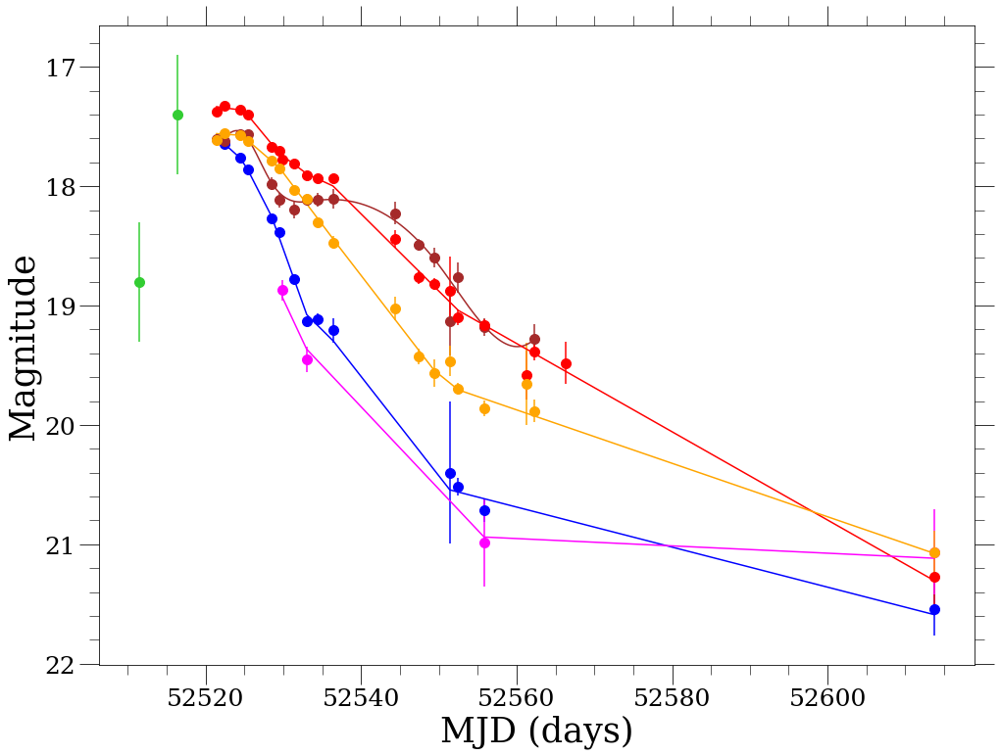

102 2002eu
C
{'None': 3}
{'None': 3}
{'None': 3}
{'None': 3}
None
3

B
{'None': 10, 'kait3': 19, 'nickel': 9}
{'None': 38}
{'None': 38}
{'None': 38}
None
38

I
{'None': 12, 'kait3': 23, 'nickel': 8}
{'None': 43}
{'None': 43}
{'None': 43}
None
43

R
{'None': 12, 'kait3': 24, 'nickel': 9}
{'None': 45}
{'None': 45}
{'None': 45}
None
45

U
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

V
{'None': 12, 'kait3': 26, 'nickel': 9}
{'None': 47}
{'None': 47}
{'None': 47}
None
47



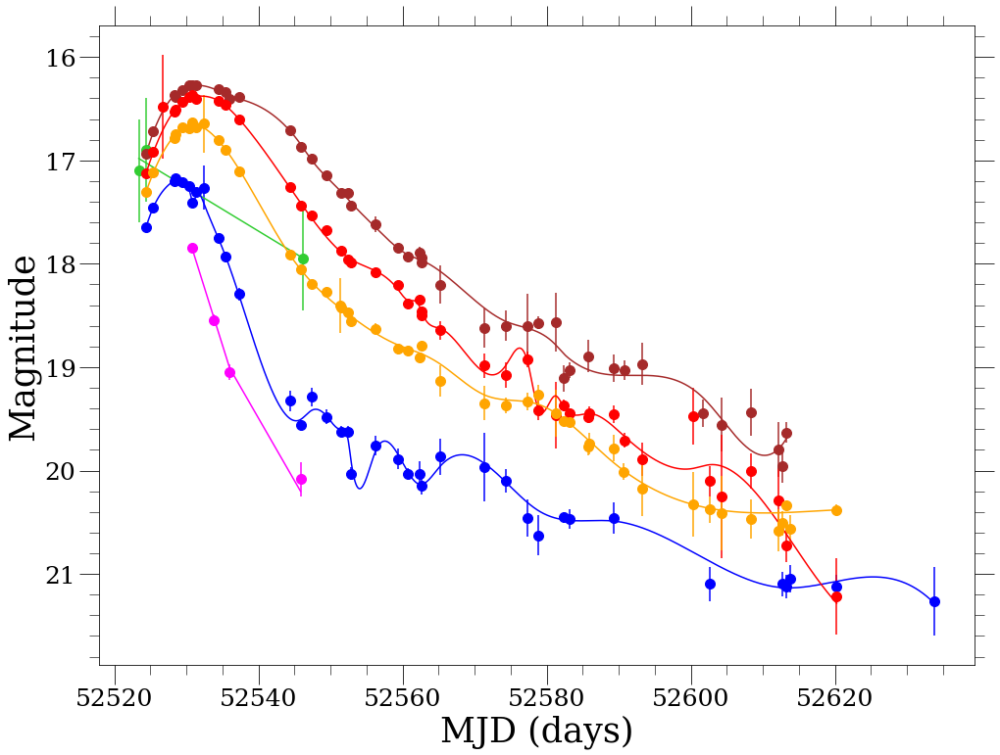

103 2002fb
C
{'None': 4}
{'None': 4}
{'None': 4}
{'None': 4}
None
4

B
{'None': 21, 'kait3': 32, 'nickel': 7}
{'None': 60}
{'None': 60}
{'None': 60}
None
60

I
{'None': 33, 'kait3': 36, 'nickel': 7}
{'None': 76}
{'None': 76}
{'None': 76}
None
76

R
{'None': 73, 'kait3': 36, 'nickel': 7}
{'None': 116}
{'None': 116}
{'None': 116}
None
116

U
{'None': 12}
{'None': 12}
{'None': 12}
{'None': 12}
None
12

V
{'None': 36, 'kait3': 32, 'nickel': 7}
{'None': 75}
{'None': 75}
{'None': 75}
None
75



KeyboardInterrupt: 

In [5]:
for i, spec in enumerate(spec_array_dered):
    phot = spec.light_curves
    if phot is not None:
        fc.plot_light_curves(phot, fit=True)
        print i, spec.name
    else:
        print i, spec.name, "No light curve info!"

In [12]:
query_08r = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN = '1994d'"
spec_array_08r = kpora.grab(query_08r, multi_epoch = True, make_corr = True, verbose=True, db_file = '../data/kaepora_v1.db')
spec_array_dered_08r = kpora.host_dereddening(spec_array_08r, verbose=False, cutoff=2.)

77 Total Spectra found
0 flagged spectra removed 77 spectra left
0 spectra of peculiar Ias removed 77 spectra left
77 spectra of SNe that have host reddening corrections
Arrays cleaned
1994d sn1994d-19940309.flm bsnip 252.730235939 -12.5601512088 1.37 8.0 3242.0 7306.0
1994d sn1994d-19940310.flm bsnip 131.445584377 -11.5622049821 1.37 8.0 3366.0 7514.0
1994d sn1994d-19940312.flm bsnip 316.005334616 -9.56631252882 1.37 8.0 3366.0 7694.0
1994d sn1994d-19940313.flm bsnip 351.023730365 -7.92568893218 1.37 8.0 3286.0 8730.0
1994d sn1994d-19940315.flm bsnip 232.348501349 -6.57247384882 1.37 8.0 3286.0 7214.0
1994d sn1994d-19940316.flm bsnip 203.909156574 -5.57452762216 1.37 8.0 3286.0 7214.0
1994d sn1994d-19940317.flm bsnip 279.037585961 -4.11852407745 1.37 8.0 3166.0 9828.0
1994d sn1994d-19940318.flm bsnip 285.580868047 -3.57863516883 1.37 8.0 3166.0 9828.0
1994d sn1994d-19940404.flm bsnip 239.224437271 13.780639444 1.37 8.0 3166.0 9828.0
1994d sn1994d-19940411.flm bsnip 241.695722514 20.37

In [13]:
for spec in spec_array_dered_08r:
    vbs = fc.valid_bands(spec)
    scale, mags_from_phot = fc.scale_flux_to_photometry(spec, vbs)
    spec.scale_to_phot = scale

B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

nan mjd of spectrum outside photometric coverage
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

3.30000000000001e-14 {'V': 13.729545855759444} {'B': nan, 'V': 13.73234389356687}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

6.250000000000024e-14 {'V': 13.023352112730326} {'B': nan, 'V': 13.029675126320974}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.0950000000000047e-13 {'V': 12.574631874452418} {'B': nan, 'V': 12.572824515055077}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.5150000000000067e-

1.8450000000000083e-13 {'R': 11.967911266772049, 'V': 12.020971398271737} {'I': nan, 'R': 12.003684670427731, 'B': nan, 'V': 11.989555202277113}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

6.350000000000023e-14 {'R': 12.665734492065823, 'V': 12.663398417148809} {'I': nan, 'R': 12.691608954044563, 'B': nan, 'V': 12.62279736206544}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

3.5500000000000114e-14 {'V': 13.054904629761271} {'B': nan, 'V': 13.061238205283221}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}

2.0500000000000045e-14 {'R': 13.407325044529642, 'V': 13.696597596749275} {'I': nan, 'R': 13.409539349788796, 'B': nan, 'V': 13.688864440229409}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

1.025e-14 {'R': 14.049867494269535, 'V': 14.302157167934613} {'I': nan, 'R': 14.12421792634013, 'B': nan, 'V': 14.21677572924256}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

9.75e-15 {'V': 14.378984813344328} {'B': nan, 'V': 14.373233928035965}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.0500000000000001e-14 {'V': 14.410458515413946} {'B': nan, 'V': 14.404724306888486}
B
{'None': 130}
{'None': 

3.600000000000011e-14 {'V': 13.591642878681302} {'B': nan, 'V': 13.59605767004794}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

5.55000000000002e-14 {'V': 13.202566515206154} {'V': 13.205060891526681}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

9.050000000000038e-14 {'V': 12.642798450712373} {'V': 12.640259274760924}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.7750000000000078e-13 {'V': 12.287939807426024} {'V': 12.277904654729808}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.4350000000000063e-13 {'V': 12.122695566151581} {'V': 12.128564509403699}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.575000000000007e-13 {'V': 12.032475562833536} {'V': 12.044988361560932}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.6950000000000074e-13 {'V': 11.962315398679213} {'V': 11.964451076814091}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None


1.7150000000000076e-13 {'V': 11.900008409221432} {'V': 11.895413840095953}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

8.550000000000036e-14 {'V': 12.412287418745908} {'V': 12.411964603784464}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

7.550000000000031e-14 {'V': 12.539144153122042} {'V': 12.552745386200222}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

5.850000000000022e-14 {'V': 12.677971740609767} {'V': 12.686757861768678}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

4.550000000000016e-14 {'V': 12.825430654655708} {'V': 12.824483964306868}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

3.5500000000000114e-14 {'V': 13.014890433299936} {'V': 13.012300177818993}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

3.600000000000011e-14 {'V': 13.06991545914595} {'V': 13.076448673279112}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.400

1.0125000000000001e-14 {'V': 14.41162758821822} {'V': 14.409762767505}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

8.749999999999996e-15 {'V': 14.57943000053162} {'V': 14.572436383663439}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

9.75e-15 {'V': 14.60341720303995} {'V': 14.607179819546113}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

1.025e-14 {'V': 14.635746078205802} {'V': 14.642277780284545}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

8.999999999999996e-15 {'V': 14.714927149669467} {'V': 14.713537276329461}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

7.312499999999991e-15 {'V': 15.1448962834442} {'V': 15.140315265835852}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

7.499999999999992e-15 {'V': 15.197166045670013} {'V': 15.198319881354266}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None':

8.950000000000038e-14 {'V': 12.742801155293815} {'V': 12.732411117495978}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

1.0450000000000044e-13 {'R': 12.12964101249299, 'V': 12.215439298186983} {'I': nan, 'R': 12.167498209456882, 'B': nan, 'V': 12.167911233629596}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

1.595000000000007e-13 {'R': 11.998382749791645, 'V': 12.068405672531252} {'I': nan, 'R': 11.981614769758108, 'B': nan, 'V': 12.074836985790492}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 1

2.2550000000000103e-13 {'R': 11.99712977376241, 'V': 11.881538609611734} {'R': 11.965946542120475, 'B': nan, 'V': 11.91480402675084}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

1.4350000000000063e-13 {'R': 12.009840502399477, 'V': 12.023003358508337} {'I': nan, 'R': 12.046091663239093, 'B': nan, 'V': 11.974710444068226}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

7.850000000000032e-14 {'R': 12.502255075171668, 'V': 12.34710835466996} {'I': nan, 'R': 12.529003176745281, 'V': 12.32533027614415}
I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

nan mjd of spectrum outside photometric covera

7.050000000000028e-14 {'R': 12.50378605846523, 'V': 12.470889706781517} {'I': nan, 'R': 12.584177323956066, 'V': 12.393013344613205}
I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

nan mjd of spectrum outside photometric coverage
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

8.050000000000033e-14 {'V': 12.456747115046358} {'V': 12.460696413082264}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

7.550000000000031e-14 {'V': 12.526864840454724} {'V': 12.528379481551323}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

5.950000000000023e-14 {'V': 12.661251586665738} {'V': 12.663745618489436}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

4.250000000000015e-14 {'V': 12.79103855154909} {'V': 12.79670832709748}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

3.8500000000000126e-14 {'V': 12.935930385638525} {'V': 12.92897326619035}
B
{'None': 130}
{'None': 130}
{'None': 130

2.7250000000000076e-14 {'R': 13.170046272241578} {'I': nan, 'R': 13.173216614543175}
V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

9.187499999999996e-15 {'R': 14.295027093347898, 'V': 14.427621089720947} {'I': nan, 'R': 14.324004850738401, 'V': 14.404724306888486}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

8.312499999999993e-15 {'V': 14.534106075011348} {'B': nan, 'V': 14.530685822298578}
B
{'None': 130}
{'None': 130}
{'None': 130}
{'None': 130}
None
130

V
{'None': 152}
{'None': 152}
{'None': 152}
{'None': 152}
None
152

I
{'None': 123}
{'None': 123}
{'None': 123}
{'None': 123}
None
123

R
{'None': 135}
{'None': 135}
{'None': 135}
{'None': 135}
None
135

4.40624999999998e-15 {'R': 15.155885834173475, 'V': 15.281292557465203} {'I': nan, 'R

-11.562204982149705 114.41054310229613


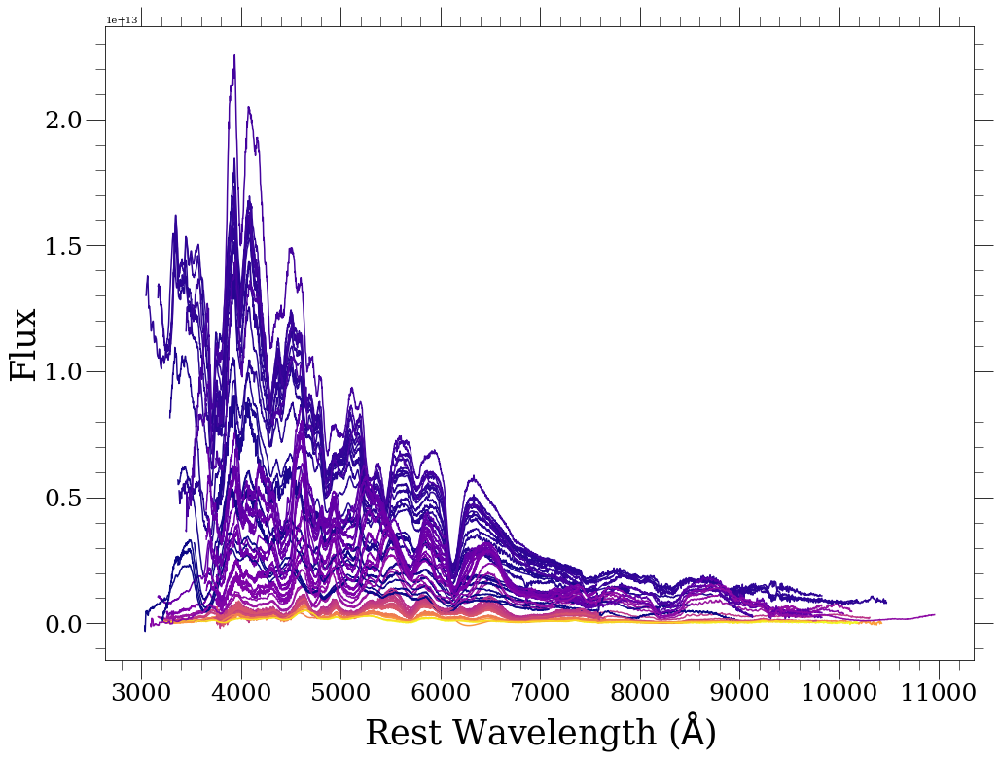

In [14]:
fc.plot_calibrated_spectra(spec_array_dered_08r)